# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 10,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 10, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 10,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 10, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 10,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 10, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "afriat_v2_3"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: rsrx83s7
Name: ancient-force-114
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/rsrx83s7
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_155910-rsrx83s7/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2561,3263,9419
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2561,2574,1697,3426,1645,3340
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4464,10779
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 644,846,2320
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 644,628,411,864,404,859
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1120,2690
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:15<2:35:54, 15.62s/it]

Epoch 1/600:   0%|          | 1/600 [00:15<2:35:54, 15.62s/it, v_num=s7_1, total_loss_train=3.71e+3, kl_local_train=53.1]

Epoch 2/600:   0%|          | 1/600 [00:15<2:35:54, 15.62s/it, v_num=s7_1, total_loss_train=3.71e+3, kl_local_train=53.1]

Epoch 2/600:   0%|          | 2/600 [00:29<2:26:57, 14.74s/it, v_num=s7_1, total_loss_train=3.71e+3, kl_local_train=53.1]

Epoch 2/600:   0%|          | 2/600 [00:29<2:26:57, 14.74s/it, v_num=s7_1, total_loss_train=3.22e+3, kl_local_train=81.2]

Epoch 3/600:   0%|          | 2/600 [00:29<2:26:57, 14.74s/it, v_num=s7_1, total_loss_train=3.22e+3, kl_local_train=81.2]

Epoch 3/600:   0%|          | 3/600 [00:43<2:22:10, 14.29s/it, v_num=s7_1, total_loss_train=3.22e+3, kl_local_train=81.2]

Epoch 3/600:   0%|          | 3/600 [00:43<2:22:10, 14.29s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=83]   

Epoch 4/600:   0%|          | 3/600 [00:43<2:22:10, 14.29s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=83]

Epoch 4/600:   1%|          | 4/600 [00:57<2:21:18, 14.23s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=83]

Epoch 4/600:   1%|          | 4/600 [00:57<2:21:18, 14.23s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=80.4]

Epoch 5/600:   1%|          | 4/600 [00:57<2:21:18, 14.23s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=80.4]

Epoch 5/600:   1%|          | 5/600 [01:12<2:22:14, 14.34s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=80.4]

Epoch 5/600:   1%|          | 5/600 [01:12<2:22:14, 14.34s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=74.9]

Epoch 6/600:   1%|          | 5/600 [01:13<2:22:14, 14.34s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=74.9]

Epoch 6/600:   1%|          | 6/600 [01:29<2:32:57, 15.45s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=74.9]

Epoch 6/600:   1%|          | 6/600 [01:29<2:32:57, 15.45s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 7/600:   1%|          | 6/600 [01:29<2:32:57, 15.45s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 7/600:   1%|          | 7/600 [01:43<2:27:43, 14.95s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 7/600:   1%|          | 7/600 [01:43<2:27:43, 14.95s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 8/600:   1%|          | 7/600 [01:43<2:27:43, 14.95s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 8/600:   1%|▏         | 8/600 [01:57<2:24:21, 14.63s/it, v_num=s7_1, total_loss_train=3.2e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 8/600:   1%|▏         | 8/600 [01:57<2:24:21, 14.63s/it, v_num=s7_1, total_loss_train=3.24e+3, kl_local_train=41.5, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 9/600:   1%|▏         | 8/600 [01:57<2:24:21, 14.63s/it, v_num=s7_1, total_loss_train=3.24e+3, kl_local_train=41.5, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 9/600:   2%|▏         | 9/600 [02:11<2:21:43, 14.39s/it, v_num=s7_1, total_loss_train=3.24e+3, kl_local_train=41.5, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 9/600:   2%|▏         | 9/600 [02:11<2:21:43, 14.39s/it, v_num=s7_1, total_loss_train=3.28e+3, kl_local_train=29.4, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 10/600:   2%|▏         | 9/600 [02:11<2:21:43, 14.39s/it, v_num=s7_1, total_loss_train=3.28e+3, kl_local_train=29.4, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 10/600:   2%|▏         | 10/600 [02:25<2:20:35, 14.30s/it, v_num=s7_1, total_loss_train=3.28e+3, kl_local_train=29.4, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 10/600:   2%|▏         | 10/600 [02:25<2:20:35, 14.30s/it, v_num=s7_1, total_loss_train=3.32e+3, kl_local_train=26.3, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 11/600:   2%|▏         | 10/600 [02:26<2:20:35, 14.30s/it, v_num=s7_1, total_loss_train=3.32e+3, kl_local_train=26.3, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 11/600:   2%|▏         | 11/600 [02:40<2:22:44, 14.54s/it, v_num=s7_1, total_loss_train=3.32e+3, kl_local_train=26.3, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00708, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.035]

Epoch 11/600:   2%|▏         | 11/600 [02:40<2:22:44, 14.54s/it, v_num=s7_1, total_loss_train=3.36e+3, kl_local_train=35, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348] 

Epoch 12/600:   2%|▏         | 11/600 [02:40<2:22:44, 14.54s/it, v_num=s7_1, total_loss_train=3.36e+3, kl_local_train=35, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 12/600:   2%|▏         | 12/600 [02:54<2:20:25, 14.33s/it, v_num=s7_1, total_loss_train=3.36e+3, kl_local_train=35, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 12/600:   2%|▏         | 12/600 [02:54<2:20:25, 14.33s/it, v_num=s7_1, total_loss_train=3.4e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 13/600:   2%|▏         | 12/600 [02:54<2:20:25, 14.33s/it, v_num=s7_1, total_loss_train=3.4e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 13/600:   2%|▏         | 13/600 [03:08<2:18:46, 14.18s/it, v_num=s7_1, total_loss_train=3.4e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 13/600:   2%|▏         | 13/600 [03:08<2:18:46, 14.18s/it, v_num=s7_1, total_loss_train=3.44e+3, kl_local_train=82.9, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 14/600:   2%|▏         | 13/600 [03:08<2:18:46, 14.18s/it, v_num=s7_1, total_loss_train=3.44e+3, kl_local_train=82.9, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 14/600:   2%|▏         | 14/600 [03:22<2:17:38, 14.09s/it, v_num=s7_1, total_loss_train=3.44e+3, kl_local_train=82.9, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 14/600:   2%|▏         | 14/600 [03:22<2:17:38, 14.09s/it, v_num=s7_1, total_loss_train=3.47e+3, kl_local_train=87.5, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 15/600:   2%|▏         | 14/600 [03:22<2:17:38, 14.09s/it, v_num=s7_1, total_loss_train=3.47e+3, kl_local_train=87.5, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 15/600:   2%|▎         | 15/600 [03:36<2:17:14, 14.08s/it, v_num=s7_1, total_loss_train=3.47e+3, kl_local_train=87.5, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 15/600:   2%|▎         | 15/600 [03:36<2:17:14, 14.08s/it, v_num=s7_1, total_loss_train=3.51e+3, kl_local_train=87.6, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 16/600:   2%|▎         | 15/600 [03:37<2:17:14, 14.08s/it, v_num=s7_1, total_loss_train=3.51e+3, kl_local_train=87.6, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 16/600:   3%|▎         | 16/600 [03:51<2:20:19, 14.42s/it, v_num=s7_1, total_loss_train=3.51e+3, kl_local_train=87.6, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00822, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 16/600:   3%|▎         | 16/600 [03:51<2:20:19, 14.42s/it, v_num=s7_1, total_loss_train=3.54e+3, kl_local_train=101, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]    

Epoch 17/600:   3%|▎         | 16/600 [03:51<2:20:19, 14.42s/it, v_num=s7_1, total_loss_train=3.54e+3, kl_local_train=101, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]

Epoch 17/600:   3%|▎         | 17/600 [04:05<2:19:29, 14.36s/it, v_num=s7_1, total_loss_train=3.54e+3, kl_local_train=101, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]

Epoch 17/600:   3%|▎         | 17/600 [04:05<2:19:29, 14.36s/it, v_num=s7_1, total_loss_train=3.58e+3, kl_local_train=164, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]

Epoch 18/600:   3%|▎         | 17/600 [04:05<2:19:29, 14.36s/it, v_num=s7_1, total_loss_train=3.58e+3, kl_local_train=164, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]

Epoch 18/600:   3%|▎         | 18/600 [04:19<2:17:07, 14.14s/it, v_num=s7_1, total_loss_train=3.58e+3, kl_local_train=164, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]

Epoch 18/600:   3%|▎         | 18/600 [04:19<2:17:07, 14.14s/it, v_num=s7_1, total_loss_train=3.62e+3, kl_local_train=255, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]

Epoch 19/600:   3%|▎         | 18/600 [04:19<2:17:07, 14.14s/it, v_num=s7_1, total_loss_train=3.62e+3, kl_local_train=255, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]

Epoch 19/600:   3%|▎         | 19/600 [04:33<2:16:18, 14.08s/it, v_num=s7_1, total_loss_train=3.62e+3, kl_local_train=255, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]

Epoch 19/600:   3%|▎         | 19/600 [04:33<2:16:18, 14.08s/it, v_num=s7_1, total_loss_train=3.67e+3, kl_local_train=336, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]

Epoch 20/600:   3%|▎         | 19/600 [04:33<2:16:18, 14.08s/it, v_num=s7_1, total_loss_train=3.67e+3, kl_local_train=336, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]

Epoch 20/600:   3%|▎         | 20/600 [04:47<2:15:55, 14.06s/it, v_num=s7_1, total_loss_train=3.67e+3, kl_local_train=336, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]

Epoch 20/600:   3%|▎         | 20/600 [04:47<2:15:55, 14.06s/it, v_num=s7_1, total_loss_train=3.71e+3, kl_local_train=396, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]

Epoch 21/600:   3%|▎         | 20/600 [04:48<2:15:55, 14.06s/it, v_num=s7_1, total_loss_train=3.71e+3, kl_local_train=396, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]

Epoch 21/600:   4%|▎         | 21/600 [05:02<2:19:10, 14.42s/it, v_num=s7_1, total_loss_train=3.71e+3, kl_local_train=396, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0366]

Epoch 21/600:   4%|▎         | 21/600 [05:02<2:19:10, 14.42s/it, v_num=s7_1, total_loss_train=3.75e+3, kl_local_train=440, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357]

Epoch 22/600:   4%|▎         | 21/600 [05:02<2:19:10, 14.42s/it, v_num=s7_1, total_loss_train=3.75e+3, kl_local_train=440, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357]

Epoch 22/600:   4%|▎         | 22/600 [05:16<2:17:22, 14.26s/it, v_num=s7_1, total_loss_train=3.75e+3, kl_local_train=440, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357]

Epoch 22/600:   4%|▎         | 22/600 [05:16<2:17:22, 14.26s/it, v_num=s7_1, total_loss_train=3.79e+3, kl_local_train=460, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357]

Epoch 23/600:   4%|▎         | 22/600 [05:16<2:17:22, 14.26s/it, v_num=s7_1, total_loss_train=3.79e+3, kl_local_train=460, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357]

Epoch 23/600:   4%|▍         | 23/600 [05:30<2:16:18, 14.17s/it, v_num=s7_1, total_loss_train=3.79e+3, kl_local_train=460, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357]

Epoch 23/600:   4%|▍         | 23/600 [05:30<2:16:18, 14.17s/it, v_num=s7_1, total_loss_train=3.82e+3, kl_local_train=476, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357]

Epoch 24/600:   4%|▍         | 23/600 [05:30<2:16:18, 14.17s/it, v_num=s7_1, total_loss_train=3.82e+3, kl_local_train=476, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357]

Epoch 24/600:   4%|▍         | 24/600 [05:44<2:15:13, 14.09s/it, v_num=s7_1, total_loss_train=3.82e+3, kl_local_train=476, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357]

Epoch 24/600:   4%|▍         | 24/600 [05:44<2:15:13, 14.09s/it, v_num=s7_1, total_loss_train=3.86e+3, kl_local_train=539, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357]

Epoch 25/600:   4%|▍         | 24/600 [05:44<2:15:13, 14.09s/it, v_num=s7_1, total_loss_train=3.86e+3, kl_local_train=539, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357]

Epoch 25/600:   4%|▍         | 25/600 [05:58<2:14:18, 14.01s/it, v_num=s7_1, total_loss_train=3.86e+3, kl_local_train=539, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357]

Epoch 25/600:   4%|▍         | 25/600 [05:58<2:14:18, 14.01s/it, v_num=s7_1, total_loss_train=3.9e+3, kl_local_train=522, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357] 

Epoch 26/600:   4%|▍         | 25/600 [05:59<2:14:18, 14.01s/it, v_num=s7_1, total_loss_train=3.9e+3, kl_local_train=522, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357]

Epoch 26/600:   4%|▍         | 26/600 [06:13<2:17:46, 14.40s/it, v_num=s7_1, total_loss_train=3.9e+3, kl_local_train=522, metric_mi|status_control_train=0.019, metric_mi|zone_train=0.0254, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0357]

Epoch 26/600:   4%|▍         | 26/600 [06:13<2:17:46, 14.40s/it, v_num=s7_1, total_loss_train=3.94e+3, kl_local_train=539, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378]

Epoch 27/600:   4%|▍         | 26/600 [06:13<2:17:46, 14.40s/it, v_num=s7_1, total_loss_train=3.94e+3, kl_local_train=539, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378]

Epoch 27/600:   4%|▍         | 27/600 [06:27<2:15:43, 14.21s/it, v_num=s7_1, total_loss_train=3.94e+3, kl_local_train=539, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378]

Epoch 27/600:   4%|▍         | 27/600 [06:27<2:15:43, 14.21s/it, v_num=s7_1, total_loss_train=3.98e+3, kl_local_train=610, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378]

Epoch 28/600:   4%|▍         | 27/600 [06:27<2:15:43, 14.21s/it, v_num=s7_1, total_loss_train=3.98e+3, kl_local_train=610, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378]

Epoch 28/600:   5%|▍         | 28/600 [06:41<2:14:38, 14.12s/it, v_num=s7_1, total_loss_train=3.98e+3, kl_local_train=610, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378]

Epoch 28/600:   5%|▍         | 28/600 [06:41<2:14:38, 14.12s/it, v_num=s7_1, total_loss_train=4.02e+3, kl_local_train=638, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378]

Epoch 29/600:   5%|▍         | 28/600 [06:41<2:14:38, 14.12s/it, v_num=s7_1, total_loss_train=4.02e+3, kl_local_train=638, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378]

Epoch 29/600:   5%|▍         | 29/600 [06:54<2:13:34, 14.04s/it, v_num=s7_1, total_loss_train=4.02e+3, kl_local_train=638, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378]

Epoch 29/600:   5%|▍         | 29/600 [06:54<2:13:34, 14.04s/it, v_num=s7_1, total_loss_train=4.06e+3, kl_local_train=633, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378]

Epoch 30/600:   5%|▍         | 29/600 [06:54<2:13:34, 14.04s/it, v_num=s7_1, total_loss_train=4.06e+3, kl_local_train=633, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378]

Epoch 30/600:   5%|▌         | 30/600 [07:09<2:13:37, 14.07s/it, v_num=s7_1, total_loss_train=4.06e+3, kl_local_train=633, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378]

Epoch 30/600:   5%|▌         | 30/600 [07:09<2:13:37, 14.07s/it, v_num=s7_1, total_loss_train=4.1e+3, kl_local_train=648, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378] 

Epoch 31/600:   5%|▌         | 30/600 [07:10<2:13:37, 14.07s/it, v_num=s7_1, total_loss_train=4.1e+3, kl_local_train=648, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378]

Epoch 31/600:   5%|▌         | 31/600 [07:24<2:16:51, 14.43s/it, v_num=s7_1, total_loss_train=4.1e+3, kl_local_train=648, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.0131, metric_mi|mouse_train=0.0378]

Epoch 31/600:   5%|▌         | 31/600 [07:24<2:16:51, 14.43s/it, v_num=s7_1, total_loss_train=4.15e+3, kl_local_train=669, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382]

Epoch 32/600:   5%|▌         | 31/600 [07:24<2:16:51, 14.43s/it, v_num=s7_1, total_loss_train=4.15e+3, kl_local_train=669, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382]

Epoch 32/600:   5%|▌         | 32/600 [07:38<2:14:55, 14.25s/it, v_num=s7_1, total_loss_train=4.15e+3, kl_local_train=669, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382]

Epoch 32/600:   5%|▌         | 32/600 [07:38<2:14:55, 14.25s/it, v_num=s7_1, total_loss_train=4.18e+3, kl_local_train=635, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382]

Epoch 33/600:   5%|▌         | 32/600 [07:38<2:14:55, 14.25s/it, v_num=s7_1, total_loss_train=4.18e+3, kl_local_train=635, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382]

Epoch 33/600:   6%|▌         | 33/600 [07:52<2:13:42, 14.15s/it, v_num=s7_1, total_loss_train=4.18e+3, kl_local_train=635, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382]

Epoch 33/600:   6%|▌         | 33/600 [07:52<2:13:42, 14.15s/it, v_num=s7_1, total_loss_train=4.22e+3, kl_local_train=594, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382]

Epoch 34/600:   6%|▌         | 33/600 [07:52<2:13:42, 14.15s/it, v_num=s7_1, total_loss_train=4.22e+3, kl_local_train=594, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382]

Epoch 34/600:   6%|▌         | 34/600 [08:06<2:12:54, 14.09s/it, v_num=s7_1, total_loss_train=4.22e+3, kl_local_train=594, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382]

Epoch 34/600:   6%|▌         | 34/600 [08:06<2:12:54, 14.09s/it, v_num=s7_1, total_loss_train=4.26e+3, kl_local_train=522, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382]

Epoch 35/600:   6%|▌         | 34/600 [08:06<2:12:54, 14.09s/it, v_num=s7_1, total_loss_train=4.26e+3, kl_local_train=522, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382]

Epoch 35/600:   6%|▌         | 35/600 [08:20<2:12:13, 14.04s/it, v_num=s7_1, total_loss_train=4.26e+3, kl_local_train=522, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382]

Epoch 35/600:   6%|▌         | 35/600 [08:20<2:12:13, 14.04s/it, v_num=s7_1, total_loss_train=4.3e+3, kl_local_train=554, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382] 

Epoch 36/600:   6%|▌         | 35/600 [08:21<2:12:13, 14.04s/it, v_num=s7_1, total_loss_train=4.3e+3, kl_local_train=554, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382]

Epoch 36/600:   6%|▌         | 36/600 [08:35<2:15:37, 14.43s/it, v_num=s7_1, total_loss_train=4.3e+3, kl_local_train=554, metric_mi|status_control_train=0.0191, metric_mi|zone_train=0.0236, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0382]

Epoch 36/600:   6%|▌         | 36/600 [08:35<2:15:37, 14.43s/it, v_num=s7_1, total_loss_train=4.34e+3, kl_local_train=554, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 37/600:   6%|▌         | 36/600 [08:35<2:15:37, 14.43s/it, v_num=s7_1, total_loss_train=4.34e+3, kl_local_train=554, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 37/600:   6%|▌         | 37/600 [08:49<2:13:36, 14.24s/it, v_num=s7_1, total_loss_train=4.34e+3, kl_local_train=554, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 37/600:   6%|▌         | 37/600 [08:49<2:13:36, 14.24s/it, v_num=s7_1, total_loss_train=4.38e+3, kl_local_train=522, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 38/600:   6%|▌         | 37/600 [08:49<2:13:36, 14.24s/it, v_num=s7_1, total_loss_train=4.38e+3, kl_local_train=522, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 38/600:   6%|▋         | 38/600 [09:03<2:12:23, 14.13s/it, v_num=s7_1, total_loss_train=4.38e+3, kl_local_train=522, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 38/600:   6%|▋         | 38/600 [09:03<2:12:23, 14.13s/it, v_num=s7_1, total_loss_train=4.43e+3, kl_local_train=553, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 39/600:   6%|▋         | 38/600 [09:03<2:12:23, 14.13s/it, v_num=s7_1, total_loss_train=4.43e+3, kl_local_train=553, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 39/600:   6%|▋         | 39/600 [09:16<2:11:29, 14.06s/it, v_num=s7_1, total_loss_train=4.43e+3, kl_local_train=553, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 39/600:   6%|▋         | 39/600 [09:16<2:11:29, 14.06s/it, v_num=s7_1, total_loss_train=4.46e+3, kl_local_train=566, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 40/600:   6%|▋         | 39/600 [09:16<2:11:29, 14.06s/it, v_num=s7_1, total_loss_train=4.46e+3, kl_local_train=566, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 40/600:   7%|▋         | 40/600 [09:30<2:10:19, 13.96s/it, v_num=s7_1, total_loss_train=4.46e+3, kl_local_train=566, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 40/600:   7%|▋         | 40/600 [09:30<2:10:19, 13.96s/it, v_num=s7_1, total_loss_train=4.51e+3, kl_local_train=565, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 41/600:   7%|▋         | 40/600 [09:32<2:10:19, 13.96s/it, v_num=s7_1, total_loss_train=4.51e+3, kl_local_train=565, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 41/600:   7%|▋         | 41/600 [09:46<2:14:14, 14.41s/it, v_num=s7_1, total_loss_train=4.51e+3, kl_local_train=565, metric_mi|status_control_train=0.0194, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.0139, metric_mi|mouse_train=0.0388]

Epoch 41/600:   7%|▋         | 41/600 [09:46<2:14:14, 14.41s/it, v_num=s7_1, total_loss_train=4.55e+3, kl_local_train=627, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 42/600:   7%|▋         | 41/600 [09:46<2:14:14, 14.41s/it, v_num=s7_1, total_loss_train=4.55e+3, kl_local_train=627, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 42/600:   7%|▋         | 42/600 [09:59<2:12:28, 14.25s/it, v_num=s7_1, total_loss_train=4.55e+3, kl_local_train=627, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 42/600:   7%|▋         | 42/600 [09:59<2:12:28, 14.25s/it, v_num=s7_1, total_loss_train=4.59e+3, kl_local_train=663, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 43/600:   7%|▋         | 42/600 [09:59<2:12:28, 14.25s/it, v_num=s7_1, total_loss_train=4.59e+3, kl_local_train=663, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 43/600:   7%|▋         | 43/600 [10:13<2:11:08, 14.13s/it, v_num=s7_1, total_loss_train=4.59e+3, kl_local_train=663, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 43/600:   7%|▋         | 43/600 [10:13<2:11:08, 14.13s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=697, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 44/600:   7%|▋         | 43/600 [10:13<2:11:08, 14.13s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=697, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 44/600:   7%|▋         | 44/600 [10:27<2:10:09, 14.05s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=697, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 44/600:   7%|▋         | 44/600 [10:27<2:10:09, 14.05s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=713, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 45/600:   7%|▋         | 44/600 [10:27<2:10:09, 14.05s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=713, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 45/600:   8%|▊         | 45/600 [10:41<2:09:34, 14.01s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=713, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 45/600:   8%|▊         | 45/600 [10:41<2:09:34, 14.01s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=599, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 46/600:   8%|▊         | 45/600 [10:42<2:09:34, 14.01s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=599, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 46/600:   8%|▊         | 46/600 [10:56<2:12:40, 14.37s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=599, metric_mi|status_control_train=0.0197, metric_mi|zone_train=0.0288, metric_mi|time_cat_train=0.0141, metric_mi|mouse_train=0.0391]

Epoch 46/600:   8%|▊         | 46/600 [10:56<2:12:40, 14.37s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=484, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 47/600:   8%|▊         | 46/600 [10:56<2:12:40, 14.37s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=484, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 47/600:   8%|▊         | 47/600 [11:10<2:11:03, 14.22s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=484, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 47/600:   8%|▊         | 47/600 [11:10<2:11:03, 14.22s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=495, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 48/600:   8%|▊         | 47/600 [11:10<2:11:03, 14.22s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=495, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 48/600:   8%|▊         | 48/600 [11:24<2:09:25, 14.07s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=495, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 48/600:   8%|▊         | 48/600 [11:24<2:09:25, 14.07s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=487, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 49/600:   8%|▊         | 48/600 [11:24<2:09:25, 14.07s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=487, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 49/600:   8%|▊         | 49/600 [11:38<2:07:57, 13.93s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=487, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 49/600:   8%|▊         | 49/600 [11:38<2:07:57, 13.93s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=463, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 50/600:   8%|▊         | 49/600 [11:38<2:07:57, 13.93s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=463, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 50/600:   8%|▊         | 50/600 [11:51<2:07:42, 13.93s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=463, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 50/600:   8%|▊         | 50/600 [11:51<2:07:42, 13.93s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=496, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 51/600:   8%|▊         | 50/600 [11:53<2:07:42, 13.93s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=496, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 51/600:   8%|▊         | 51/600 [12:07<2:11:08, 14.33s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=496, metric_mi|status_control_train=0.0196, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0143, metric_mi|mouse_train=0.0393]

Epoch 51/600:   8%|▊         | 51/600 [12:07<2:11:08, 14.33s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=506, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394]  

Epoch 52/600:   8%|▊         | 51/600 [12:07<2:11:08, 14.33s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=506, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394]

Epoch 52/600:   9%|▊         | 52/600 [12:21<2:09:40, 14.20s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=506, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394]

Epoch 52/600:   9%|▊         | 52/600 [12:21<2:09:40, 14.20s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=489, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394]

Epoch 53/600:   9%|▊         | 52/600 [12:21<2:09:40, 14.20s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=489, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394]

Epoch 53/600:   9%|▉         | 53/600 [12:34<2:08:33, 14.10s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=489, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394]

Epoch 53/600:   9%|▉         | 53/600 [12:34<2:08:33, 14.10s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=493, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394] 

Epoch 54/600:   9%|▉         | 53/600 [12:34<2:08:33, 14.10s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=493, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394]

Epoch 54/600:   9%|▉         | 54/600 [12:48<2:07:35, 14.02s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=493, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394]

Epoch 54/600:   9%|▉         | 54/600 [12:48<2:07:35, 14.02s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=515, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394]

Epoch 55/600:   9%|▉         | 54/600 [12:48<2:07:35, 14.02s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=515, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394]

Epoch 55/600:   9%|▉         | 55/600 [13:02<2:07:10, 14.00s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=515, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394]

Epoch 55/600:   9%|▉         | 55/600 [13:02<2:07:10, 14.00s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=484, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394] 

Epoch 56/600:   9%|▉         | 55/600 [13:04<2:07:10, 14.00s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=484, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394]

Epoch 56/600:   9%|▉         | 56/600 [13:17<2:10:15, 14.37s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=484, metric_mi|status_control_train=0.02, metric_mi|zone_train=0.0289, metric_mi|time_cat_train=0.0149, metric_mi|mouse_train=0.0394]

Epoch 56/600:   9%|▉         | 56/600 [13:17<2:10:15, 14.37s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=443, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04]

Epoch 57/600:   9%|▉         | 56/600 [13:18<2:10:15, 14.37s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=443, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04]

Epoch 57/600:  10%|▉         | 57/600 [13:31<2:08:32, 14.20s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=443, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04]

Epoch 57/600:  10%|▉         | 57/600 [13:31<2:08:32, 14.20s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=381, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04]

Epoch 58/600:  10%|▉         | 57/600 [13:31<2:08:32, 14.20s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=381, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04]

Epoch 58/600:  10%|▉         | 58/600 [13:45<2:07:21, 14.10s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=381, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04]

Epoch 58/600:  10%|▉         | 58/600 [13:45<2:07:21, 14.10s/it, v_num=s7_1, total_loss_train=4.89e+3, kl_local_train=282, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04]

Epoch 59/600:  10%|▉         | 58/600 [13:45<2:07:21, 14.10s/it, v_num=s7_1, total_loss_train=4.89e+3, kl_local_train=282, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04]

Epoch 59/600:  10%|▉         | 59/600 [13:59<2:06:17, 14.01s/it, v_num=s7_1, total_loss_train=4.89e+3, kl_local_train=282, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04]

Epoch 59/600:  10%|▉         | 59/600 [13:59<2:06:17, 14.01s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=350, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04] 

Epoch 60/600:  10%|▉         | 59/600 [13:59<2:06:17, 14.01s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=350, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04]

Epoch 60/600:  10%|█         | 60/600 [14:13<2:05:45, 13.97s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=350, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04]

Epoch 60/600:  10%|█         | 60/600 [14:13<2:05:45, 13.97s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=466, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04]

Epoch 61/600:  10%|█         | 60/600 [14:14<2:05:45, 13.97s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=466, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04]

Epoch 61/600:  10%|█         | 61/600 [14:28<2:09:17, 14.39s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=466, metric_mi|status_control_train=0.0198, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0156, metric_mi|mouse_train=0.04]

Epoch 61/600:  10%|█         | 61/600 [14:28<2:09:17, 14.39s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=543, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401]

Epoch 62/600:  10%|█         | 61/600 [14:28<2:09:17, 14.39s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=543, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401]

Epoch 62/600:  10%|█         | 62/600 [14:42<2:07:50, 14.26s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=543, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401]

Epoch 62/600:  10%|█         | 62/600 [14:42<2:07:50, 14.26s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=619, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401]

Epoch 63/600:  10%|█         | 62/600 [14:42<2:07:50, 14.26s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=619, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401]

Epoch 63/600:  10%|█         | 63/600 [14:56<2:05:26, 14.02s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=619, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401]

Epoch 63/600:  10%|█         | 63/600 [14:56<2:05:26, 14.02s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=646, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401]

Epoch 64/600:  10%|█         | 63/600 [14:56<2:05:26, 14.02s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=646, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401]

Epoch 64/600:  11%|█         | 64/600 [15:08<2:00:53, 13.53s/it, v_num=s7_1, total_loss_train=4.91e+3, kl_local_train=646, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401]

Epoch 64/600:  11%|█         | 64/600 [15:08<2:00:53, 13.53s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=572, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401] 

Epoch 65/600:  11%|█         | 64/600 [15:08<2:00:53, 13.53s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=572, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401]

Epoch 65/600:  11%|█         | 65/600 [15:21<1:57:59, 13.23s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=572, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401]

Epoch 65/600:  11%|█         | 65/600 [15:21<1:57:59, 13.23s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=539, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401]

Epoch 66/600:  11%|█         | 65/600 [15:22<1:57:59, 13.23s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=539, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401]

Epoch 66/600:  11%|█         | 66/600 [15:34<1:59:04, 13.38s/it, v_num=s7_1, total_loss_train=4.9e+3, kl_local_train=539, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0556, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0401]

Epoch 66/600:  11%|█         | 66/600 [15:34<1:59:04, 13.38s/it, v_num=s7_1, total_loss_train=4.89e+3, kl_local_train=476, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 67/600:  11%|█         | 66/600 [15:34<1:59:04, 13.38s/it, v_num=s7_1, total_loss_train=4.89e+3, kl_local_train=476, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 67/600:  11%|█         | 67/600 [15:47<1:56:36, 13.13s/it, v_num=s7_1, total_loss_train=4.89e+3, kl_local_train=476, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 67/600:  11%|█         | 67/600 [15:47<1:56:36, 13.13s/it, v_num=s7_1, total_loss_train=4.89e+3, kl_local_train=422, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 68/600:  11%|█         | 67/600 [15:47<1:56:36, 13.13s/it, v_num=s7_1, total_loss_train=4.89e+3, kl_local_train=422, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 68/600:  11%|█▏        | 68/600 [15:59<1:54:56, 12.96s/it, v_num=s7_1, total_loss_train=4.89e+3, kl_local_train=422, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 68/600:  11%|█▏        | 68/600 [15:59<1:54:56, 12.96s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=452, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 69/600:  11%|█▏        | 68/600 [15:59<1:54:56, 12.96s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=452, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 69/600:  12%|█▏        | 69/600 [16:12<1:53:34, 12.83s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=452, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 69/600:  12%|█▏        | 69/600 [16:12<1:53:34, 12.83s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=449, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 70/600:  12%|█▏        | 69/600 [16:12<1:53:34, 12.83s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=449, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 70/600:  12%|█▏        | 70/600 [16:25<1:52:42, 12.76s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=449, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 70/600:  12%|█▏        | 70/600 [16:25<1:52:42, 12.76s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=443, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 71/600:  12%|█▏        | 70/600 [16:26<1:52:42, 12.76s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=443, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 71/600:  12%|█▏        | 71/600 [16:38<1:55:24, 13.09s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=443, metric_mi|status_control_train=0.0202, metric_mi|zone_train=0.0558, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0411]

Epoch 71/600:  12%|█▏        | 71/600 [16:38<1:55:24, 13.09s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=462, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]  

Epoch 72/600:  12%|█▏        | 71/600 [16:38<1:55:24, 13.09s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=462, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]

Epoch 72/600:  12%|█▏        | 72/600 [16:51<1:53:47, 12.93s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=462, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]

Epoch 72/600:  12%|█▏        | 72/600 [16:51<1:53:47, 12.93s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=461, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]

Epoch 73/600:  12%|█▏        | 72/600 [16:51<1:53:47, 12.93s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=461, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]

Epoch 73/600:  12%|█▏        | 73/600 [17:04<1:54:04, 12.99s/it, v_num=s7_1, total_loss_train=4.88e+3, kl_local_train=461, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]

Epoch 73/600:  12%|█▏        | 73/600 [17:04<1:54:04, 12.99s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=413, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]

Epoch 74/600:  12%|█▏        | 73/600 [17:04<1:54:04, 12.99s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=413, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]

Epoch 74/600:  12%|█▏        | 74/600 [17:18<1:56:14, 13.26s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=413, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]

Epoch 74/600:  12%|█▏        | 74/600 [17:18<1:56:14, 13.26s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=361, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]

Epoch 75/600:  12%|█▏        | 74/600 [17:18<1:56:14, 13.26s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=361, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]

Epoch 75/600:  12%|█▎        | 75/600 [17:32<1:58:13, 13.51s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=361, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]

Epoch 75/600:  12%|█▎        | 75/600 [17:32<1:58:13, 13.51s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=344, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]

Epoch 76/600:  12%|█▎        | 75/600 [17:33<1:58:13, 13.51s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=344, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]

Epoch 76/600:  13%|█▎        | 76/600 [17:47<2:02:40, 14.05s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=344, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0426]

Epoch 76/600:  13%|█▎        | 76/600 [17:47<2:02:40, 14.05s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=295, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 77/600:  13%|█▎        | 76/600 [17:47<2:02:40, 14.05s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=295, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 77/600:  13%|█▎        | 77/600 [18:01<2:02:02, 14.00s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=295, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 77/600:  13%|█▎        | 77/600 [18:01<2:02:02, 14.00s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=334, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 78/600:  13%|█▎        | 77/600 [18:01<2:02:02, 14.00s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=334, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 78/600:  13%|█▎        | 78/600 [18:15<2:01:52, 14.01s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=334, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 78/600:  13%|█▎        | 78/600 [18:15<2:01:52, 14.01s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=383, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 79/600:  13%|█▎        | 78/600 [18:15<2:01:52, 14.01s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=383, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 79/600:  13%|█▎        | 79/600 [18:29<2:01:42, 14.02s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=383, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 79/600:  13%|█▎        | 79/600 [18:29<2:01:42, 14.02s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=414, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 80/600:  13%|█▎        | 79/600 [18:29<2:01:42, 14.02s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=414, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 80/600:  13%|█▎        | 80/600 [18:43<2:01:40, 14.04s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=414, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 80/600:  13%|█▎        | 80/600 [18:43<2:01:40, 14.04s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=419, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 81/600:  13%|█▎        | 80/600 [18:45<2:01:40, 14.04s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=419, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 81/600:  14%|█▎        | 81/600 [18:59<2:04:51, 14.43s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=419, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0357, metric_mi|time_cat_train=0.0191, metric_mi|mouse_train=0.0426]

Epoch 81/600:  14%|█▎        | 81/600 [18:59<2:04:51, 14.43s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=430, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 82/600:  14%|█▎        | 81/600 [18:59<2:04:51, 14.43s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=430, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 82/600:  14%|█▎        | 82/600 [19:13<2:03:11, 14.27s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=430, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 82/600:  14%|█▎        | 82/600 [19:13<2:03:11, 14.27s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=441, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 83/600:  14%|█▎        | 82/600 [19:13<2:03:11, 14.27s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=441, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 83/600:  14%|█▍        | 83/600 [19:26<2:01:32, 14.11s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=441, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 83/600:  14%|█▍        | 83/600 [19:26<2:01:32, 14.11s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=441, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 84/600:  14%|█▍        | 83/600 [19:26<2:01:32, 14.11s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=441, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 84/600:  14%|█▍        | 84/600 [19:40<2:00:54, 14.06s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=441, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 84/600:  14%|█▍        | 84/600 [19:40<2:00:54, 14.06s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=461, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 85/600:  14%|█▍        | 84/600 [19:40<2:00:54, 14.06s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=461, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 85/600:  14%|█▍        | 85/600 [19:54<2:00:45, 14.07s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=461, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 85/600:  14%|█▍        | 85/600 [19:54<2:00:45, 14.07s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=473, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 86/600:  14%|█▍        | 85/600 [19:56<2:00:45, 14.07s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=473, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 86/600:  14%|█▍        | 86/600 [20:10<2:03:39, 14.44s/it, v_num=s7_1, total_loss_train=4.87e+3, kl_local_train=473, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0432]

Epoch 86/600:  14%|█▍        | 86/600 [20:10<2:03:39, 14.44s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=421, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 87/600:  14%|█▍        | 86/600 [20:10<2:03:39, 14.44s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=421, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 87/600:  14%|█▍        | 87/600 [20:24<2:02:29, 14.33s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=421, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 87/600:  14%|█▍        | 87/600 [20:24<2:02:29, 14.33s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=452, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 88/600:  14%|█▍        | 87/600 [20:24<2:02:29, 14.33s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=452, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 88/600:  15%|█▍        | 88/600 [20:38<2:01:23, 14.23s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=452, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 88/600:  15%|█▍        | 88/600 [20:38<2:01:23, 14.23s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=498, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 89/600:  15%|█▍        | 88/600 [20:38<2:01:23, 14.23s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=498, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 89/600:  15%|█▍        | 89/600 [20:52<2:00:37, 14.16s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=498, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 89/600:  15%|█▍        | 89/600 [20:52<2:00:37, 14.16s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=408, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 90/600:  15%|█▍        | 89/600 [20:52<2:00:37, 14.16s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=408, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 90/600:  15%|█▌        | 90/600 [21:06<1:59:49, 14.10s/it, v_num=s7_1, total_loss_train=4.86e+3, kl_local_train=408, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 90/600:  15%|█▌        | 90/600 [21:06<1:59:49, 14.10s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=372, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 91/600:  15%|█▌        | 90/600 [21:07<1:59:49, 14.10s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=372, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 91/600:  15%|█▌        | 91/600 [21:24<2:09:32, 15.27s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=372, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.0519, metric_mi|time_cat_train=0.0204, metric_mi|mouse_train=0.0434]

Epoch 91/600:  15%|█▌        | 91/600 [21:24<2:09:32, 15.27s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=396, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 92/600:  15%|█▌        | 91/600 [21:24<2:09:32, 15.27s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=396, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 92/600:  15%|█▌        | 92/600 [21:40<2:12:15, 15.62s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=396, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 92/600:  15%|█▌        | 92/600 [21:40<2:12:15, 15.62s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=411, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 93/600:  15%|█▌        | 92/600 [21:40<2:12:15, 15.62s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=411, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 93/600:  16%|█▌        | 93/600 [21:57<2:14:07, 15.87s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=411, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 93/600:  16%|█▌        | 93/600 [21:57<2:14:07, 15.87s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=443, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 94/600:  16%|█▌        | 93/600 [21:57<2:14:07, 15.87s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=443, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 94/600:  16%|█▌        | 94/600 [22:13<2:15:17, 16.04s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=443, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 94/600:  16%|█▌        | 94/600 [22:13<2:15:17, 16.04s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=453, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 95/600:  16%|█▌        | 94/600 [22:13<2:15:17, 16.04s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=453, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 95/600:  16%|█▌        | 95/600 [22:30<2:16:05, 16.17s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=453, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 95/600:  16%|█▌        | 95/600 [22:30<2:16:05, 16.17s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=433, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 96/600:  16%|█▌        | 95/600 [22:31<2:16:05, 16.17s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=433, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 96/600:  16%|█▌        | 96/600 [22:47<2:20:11, 16.69s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=433, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.0495, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0445]

Epoch 96/600:  16%|█▌        | 96/600 [22:47<2:20:11, 16.69s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=458, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469] 

Epoch 97/600:  16%|█▌        | 96/600 [22:47<2:20:11, 16.69s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=458, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469]

Epoch 97/600:  16%|█▌        | 97/600 [23:04<2:19:20, 16.62s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=458, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469]

Epoch 97/600:  16%|█▌        | 97/600 [23:04<2:19:20, 16.62s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=487, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469]

Epoch 98/600:  16%|█▌        | 97/600 [23:04<2:19:20, 16.62s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=487, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469]

Epoch 98/600:  16%|█▋        | 98/600 [23:20<2:18:50, 16.59s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=487, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469]

Epoch 98/600:  16%|█▋        | 98/600 [23:20<2:18:50, 16.59s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=509, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469]

Epoch 99/600:  16%|█▋        | 98/600 [23:20<2:18:50, 16.59s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=509, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469]

Epoch 99/600:  16%|█▋        | 99/600 [23:37<2:18:19, 16.57s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=509, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469]

Epoch 99/600:  16%|█▋        | 99/600 [23:37<2:18:19, 16.57s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=495, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469]

Epoch 100/600:  16%|█▋        | 99/600 [23:37<2:18:19, 16.57s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=495, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469]

Epoch 100/600:  17%|█▋        | 100/600 [23:53<2:17:47, 16.54s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=495, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469]

Epoch 100/600:  17%|█▋        | 100/600 [23:53<2:17:47, 16.54s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=476, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469]

Epoch 101/600:  17%|█▋        | 100/600 [23:55<2:17:47, 16.54s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=476, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469]

Epoch 101/600:  17%|█▋        | 101/600 [24:12<2:21:28, 17.01s/it, v_num=s7_1, total_loss_train=4.85e+3, kl_local_train=476, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0469]

Epoch 101/600:  17%|█▋        | 101/600 [24:12<2:21:28, 17.01s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=416, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 102/600:  17%|█▋        | 101/600 [24:12<2:21:28, 17.01s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=416, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 102/600:  17%|█▋        | 102/600 [24:28<2:20:10, 16.89s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=416, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 102/600:  17%|█▋        | 102/600 [24:28<2:20:10, 16.89s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=378, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 103/600:  17%|█▋        | 102/600 [24:28<2:20:10, 16.89s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=378, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 103/600:  17%|█▋        | 103/600 [24:45<2:18:59, 16.78s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=378, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 103/600:  17%|█▋        | 103/600 [24:45<2:18:59, 16.78s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=366, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 104/600:  17%|█▋        | 103/600 [24:45<2:18:59, 16.78s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=366, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 104/600:  17%|█▋        | 104/600 [25:01<2:17:58, 16.69s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=366, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 104/600:  17%|█▋        | 104/600 [25:01<2:17:58, 16.69s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=361, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 105/600:  17%|█▋        | 104/600 [25:01<2:17:58, 16.69s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=361, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 105/600:  18%|█▊        | 105/600 [25:18<2:17:22, 16.65s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=361, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 105/600:  18%|█▊        | 105/600 [25:18<2:17:22, 16.65s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=396, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 106/600:  18%|█▊        | 105/600 [25:19<2:17:22, 16.65s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=396, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 106/600:  18%|█▊        | 106/600 [25:36<2:20:33, 17.07s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=396, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.0484, metric_mi|time_cat_train=0.0276, metric_mi|mouse_train=0.0489]

Epoch 106/600:  18%|█▊        | 106/600 [25:36<2:20:33, 17.07s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=408, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 107/600:  18%|█▊        | 106/600 [25:36<2:20:33, 17.07s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=408, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 107/600:  18%|█▊        | 107/600 [25:52<2:18:58, 16.91s/it, v_num=s7_1, total_loss_train=4.84e+3, kl_local_train=408, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 107/600:  18%|█▊        | 107/600 [25:52<2:18:58, 16.91s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=387, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 108/600:  18%|█▊        | 107/600 [25:52<2:18:58, 16.91s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=387, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 108/600:  18%|█▊        | 108/600 [26:09<2:17:33, 16.77s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=387, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 108/600:  18%|█▊        | 108/600 [26:09<2:17:33, 16.77s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=355, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 109/600:  18%|█▊        | 108/600 [26:09<2:17:33, 16.77s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=355, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 109/600:  18%|█▊        | 109/600 [26:25<2:16:32, 16.69s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=355, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 109/600:  18%|█▊        | 109/600 [26:25<2:16:32, 16.69s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=397, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 110/600:  18%|█▊        | 109/600 [26:25<2:16:32, 16.69s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=397, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 110/600:  18%|█▊        | 110/600 [26:42<2:15:57, 16.65s/it, v_num=s7_1, total_loss_train=4.83e+3, kl_local_train=397, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 110/600:  18%|█▊        | 110/600 [26:42<2:15:57, 16.65s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=367, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 111/600:  18%|█▊        | 110/600 [26:43<2:15:57, 16.65s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=367, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 111/600:  18%|█▊        | 111/600 [27:00<2:19:09, 17.08s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=367, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.0705, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0509]

Epoch 111/600:  18%|█▊        | 111/600 [27:00<2:19:09, 17.08s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=362, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 112/600:  18%|█▊        | 111/600 [27:00<2:19:09, 17.08s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=362, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 112/600:  19%|█▊        | 112/600 [27:16<2:17:18, 16.88s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=362, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 112/600:  19%|█▊        | 112/600 [27:16<2:17:18, 16.88s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=392, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 113/600:  19%|█▊        | 112/600 [27:16<2:17:18, 16.88s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=392, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 113/600:  19%|█▉        | 113/600 [27:33<2:16:02, 16.76s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=392, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 113/600:  19%|█▉        | 113/600 [27:33<2:16:02, 16.76s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=362, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 114/600:  19%|█▉        | 113/600 [27:33<2:16:02, 16.76s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=362, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 114/600:  19%|█▉        | 114/600 [27:49<2:15:09, 16.69s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=362, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 114/600:  19%|█▉        | 114/600 [27:49<2:15:09, 16.69s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=356, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 115/600:  19%|█▉        | 114/600 [27:49<2:15:09, 16.69s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=356, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 115/600:  19%|█▉        | 115/600 [28:06<2:14:24, 16.63s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=356, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 115/600:  19%|█▉        | 115/600 [28:06<2:14:24, 16.63s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=373, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 116/600:  19%|█▉        | 115/600 [28:07<2:14:24, 16.63s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=373, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 116/600:  19%|█▉        | 116/600 [28:24<2:17:46, 17.08s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=373, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.0606, metric_mi|time_cat_train=0.0326, metric_mi|mouse_train=0.0527]

Epoch 116/600:  19%|█▉        | 116/600 [28:24<2:17:46, 17.08s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=362, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 117/600:  19%|█▉        | 116/600 [28:24<2:17:46, 17.08s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=362, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 117/600:  20%|█▉        | 117/600 [28:40<2:15:58, 16.89s/it, v_num=s7_1, total_loss_train=4.82e+3, kl_local_train=362, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 117/600:  20%|█▉        | 117/600 [28:40<2:15:58, 16.89s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=317, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 118/600:  20%|█▉        | 117/600 [28:40<2:15:58, 16.89s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=317, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 118/600:  20%|█▉        | 118/600 [28:57<2:14:53, 16.79s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=317, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 118/600:  20%|█▉        | 118/600 [28:57<2:14:53, 16.79s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=322, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 119/600:  20%|█▉        | 118/600 [28:57<2:14:53, 16.79s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=322, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 119/600:  20%|█▉        | 119/600 [29:13<2:13:53, 16.70s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=322, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 119/600:  20%|█▉        | 119/600 [29:13<2:13:53, 16.70s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=322, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 120/600:  20%|█▉        | 119/600 [29:13<2:13:53, 16.70s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=322, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 120/600:  20%|██        | 120/600 [29:30<2:13:32, 16.69s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=322, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 120/600:  20%|██        | 120/600 [29:30<2:13:32, 16.69s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=305, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 121/600:  20%|██        | 120/600 [29:31<2:13:32, 16.69s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=305, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 121/600:  20%|██        | 121/600 [29:48<2:15:47, 17.01s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=305, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0594, metric_mi|time_cat_train=0.0355, metric_mi|mouse_train=0.0547]

Epoch 121/600:  20%|██        | 121/600 [29:48<2:15:47, 17.01s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=296, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057]  

Epoch 122/600:  20%|██        | 121/600 [29:48<2:15:47, 17.01s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=296, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057]

Epoch 122/600:  20%|██        | 122/600 [30:04<2:14:14, 16.85s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=296, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057]

Epoch 122/600:  20%|██        | 122/600 [30:04<2:14:14, 16.85s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=322, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057]

Epoch 123/600:  20%|██        | 122/600 [30:04<2:14:14, 16.85s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=322, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057]

Epoch 123/600:  20%|██        | 123/600 [30:21<2:13:33, 16.80s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=322, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057]

Epoch 123/600:  20%|██        | 123/600 [30:21<2:13:33, 16.80s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=323, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057]

Epoch 124/600:  20%|██        | 123/600 [30:21<2:13:33, 16.80s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=323, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057]

Epoch 124/600:  21%|██        | 124/600 [30:37<2:12:32, 16.71s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=323, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057]

Epoch 124/600:  21%|██        | 124/600 [30:37<2:12:32, 16.71s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=316, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057] 

Epoch 125/600:  21%|██        | 124/600 [30:37<2:12:32, 16.71s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=316, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057]

Epoch 125/600:  21%|██        | 125/600 [30:54<2:11:59, 16.67s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=316, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057]

Epoch 125/600:  21%|██        | 125/600 [30:54<2:11:59, 16.67s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=307, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057]

Epoch 126/600:  21%|██        | 125/600 [30:55<2:11:59, 16.67s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=307, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057]

Epoch 126/600:  21%|██        | 126/600 [31:12<2:14:24, 17.01s/it, v_num=s7_1, total_loss_train=4.81e+3, kl_local_train=307, metric_mi|status_control_train=0.0276, metric_mi|zone_train=0.0596, metric_mi|time_cat_train=0.0386, metric_mi|mouse_train=0.057]

Epoch 126/600:  21%|██        | 126/600 [31:12<2:14:24, 17.01s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=290, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592]

Epoch 127/600:  21%|██        | 126/600 [31:12<2:14:24, 17.01s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=290, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592]

Epoch 127/600:  21%|██        | 127/600 [31:29<2:13:27, 16.93s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=290, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592]

Epoch 127/600:  21%|██        | 127/600 [31:29<2:13:27, 16.93s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=262, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592]

Epoch 128/600:  21%|██        | 127/600 [31:29<2:13:27, 16.93s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=262, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592]

Epoch 128/600:  21%|██▏       | 128/600 [31:45<2:12:09, 16.80s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=262, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592]

Epoch 128/600:  21%|██▏       | 128/600 [31:45<2:12:09, 16.80s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=279, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592] 

Epoch 129/600:  21%|██▏       | 128/600 [31:45<2:12:09, 16.80s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=279, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592]

Epoch 129/600:  22%|██▏       | 129/600 [32:02<2:10:59, 16.69s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=279, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592]

Epoch 129/600:  22%|██▏       | 129/600 [32:02<2:10:59, 16.69s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=276, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592]

Epoch 130/600:  22%|██▏       | 129/600 [32:02<2:10:59, 16.69s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=276, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592]

Epoch 130/600:  22%|██▏       | 130/600 [32:18<2:10:21, 16.64s/it, v_num=s7_1, total_loss_train=4.8e+3, kl_local_train=276, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592]

Epoch 130/600:  22%|██▏       | 130/600 [32:18<2:10:21, 16.64s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=274, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592]

Epoch 131/600:  22%|██▏       | 130/600 [32:19<2:10:21, 16.64s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=274, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592]

Epoch 131/600:  22%|██▏       | 131/600 [32:36<2:13:00, 17.02s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=274, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.0602, metric_mi|time_cat_train=0.0414, metric_mi|mouse_train=0.0592]

Epoch 131/600:  22%|██▏       | 131/600 [32:36<2:13:00, 17.02s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=265, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 132/600:  22%|██▏       | 131/600 [32:36<2:13:00, 17.02s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=265, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 132/600:  22%|██▏       | 132/600 [32:52<2:11:32, 16.86s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=265, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 132/600:  22%|██▏       | 132/600 [32:52<2:11:32, 16.86s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=263, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 133/600:  22%|██▏       | 132/600 [32:52<2:11:32, 16.86s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=263, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 133/600:  22%|██▏       | 133/600 [33:09<2:10:19, 16.74s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=263, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 133/600:  22%|██▏       | 133/600 [33:09<2:10:19, 16.74s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=271, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 134/600:  22%|██▏       | 133/600 [33:09<2:10:19, 16.74s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=271, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 134/600:  22%|██▏       | 134/600 [33:25<2:09:27, 16.67s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=271, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 134/600:  22%|██▏       | 134/600 [33:25<2:09:27, 16.67s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=254, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 135/600:  22%|██▏       | 134/600 [33:25<2:09:27, 16.67s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=254, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 135/600:  22%|██▎       | 135/600 [33:42<2:09:04, 16.65s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=254, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 135/600:  22%|██▎       | 135/600 [33:42<2:09:04, 16.65s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=259, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 136/600:  22%|██▎       | 135/600 [33:43<2:09:04, 16.65s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=259, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 136/600:  23%|██▎       | 136/600 [34:00<2:11:37, 17.02s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=259, metric_mi|status_control_train=0.0302, metric_mi|zone_train=0.0628, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0617]

Epoch 136/600:  23%|██▎       | 136/600 [34:00<2:11:37, 17.02s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=262, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637] 

Epoch 137/600:  23%|██▎       | 136/600 [34:00<2:11:37, 17.02s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=262, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637]

Epoch 137/600:  23%|██▎       | 137/600 [34:16<2:10:08, 16.86s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=262, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637]

Epoch 137/600:  23%|██▎       | 137/600 [34:16<2:10:08, 16.86s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=261, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637]

Epoch 138/600:  23%|██▎       | 137/600 [34:16<2:10:08, 16.86s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=261, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637]

Epoch 138/600:  23%|██▎       | 138/600 [34:33<2:09:18, 16.79s/it, v_num=s7_1, total_loss_train=4.79e+3, kl_local_train=261, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637]

Epoch 138/600:  23%|██▎       | 138/600 [34:33<2:09:18, 16.79s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=246, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637]

Epoch 139/600:  23%|██▎       | 138/600 [34:33<2:09:18, 16.79s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=246, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637]

Epoch 139/600:  23%|██▎       | 139/600 [34:50<2:08:18, 16.70s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=246, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637]

Epoch 139/600:  23%|██▎       | 139/600 [34:50<2:08:18, 16.70s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=231, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637]

Epoch 140/600:  23%|██▎       | 139/600 [34:50<2:08:18, 16.70s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=231, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637]

Epoch 140/600:  23%|██▎       | 140/600 [35:06<2:07:32, 16.64s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=231, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637]

Epoch 140/600:  23%|██▎       | 140/600 [35:06<2:07:32, 16.64s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=231, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637]

Epoch 141/600:  23%|██▎       | 140/600 [35:07<2:07:32, 16.64s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=231, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637]

Epoch 141/600:  24%|██▎       | 141/600 [35:21<2:04:40, 16.30s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=231, metric_mi|status_control_train=0.0314, metric_mi|zone_train=0.0617, metric_mi|time_cat_train=0.048, metric_mi|mouse_train=0.0637]

Epoch 141/600:  24%|██▎       | 141/600 [35:22<2:04:40, 16.30s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=245, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 142/600:  24%|██▎       | 141/600 [35:22<2:04:40, 16.30s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=245, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 142/600:  24%|██▎       | 142/600 [35:36<1:59:23, 15.64s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=245, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 142/600:  24%|██▎       | 142/600 [35:36<1:59:23, 15.64s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=247, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 143/600:  24%|██▎       | 142/600 [35:36<1:59:23, 15.64s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=247, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 143/600:  24%|██▍       | 143/600 [35:50<1:55:34, 15.17s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=247, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 143/600:  24%|██▍       | 143/600 [35:50<1:55:34, 15.17s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=228, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 144/600:  24%|██▍       | 143/600 [35:50<1:55:34, 15.17s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=228, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 144/600:  24%|██▍       | 144/600 [36:04<1:52:40, 14.82s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=228, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 144/600:  24%|██▍       | 144/600 [36:04<1:52:40, 14.82s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=242, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 145/600:  24%|██▍       | 144/600 [36:04<1:52:40, 14.82s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=242, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 145/600:  24%|██▍       | 145/600 [36:18<1:50:51, 14.62s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=242, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 145/600:  24%|██▍       | 145/600 [36:18<1:50:51, 14.62s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=257, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 146/600:  24%|██▍       | 145/600 [36:19<1:50:51, 14.62s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=257, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 146/600:  24%|██▍       | 146/600 [36:33<1:52:22, 14.85s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=257, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.0607, metric_mi|time_cat_train=0.0501, metric_mi|mouse_train=0.0648]

Epoch 146/600:  24%|██▍       | 146/600 [36:33<1:52:22, 14.85s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=249, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662] 

Epoch 147/600:  24%|██▍       | 146/600 [36:33<1:52:22, 14.85s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=249, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662]

Epoch 147/600:  24%|██▍       | 147/600 [36:47<1:50:31, 14.64s/it, v_num=s7_1, total_loss_train=4.78e+3, kl_local_train=249, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662]

Epoch 147/600:  24%|██▍       | 147/600 [36:47<1:50:31, 14.64s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=232, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662]

Epoch 148/600:  24%|██▍       | 147/600 [36:47<1:50:31, 14.64s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=232, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662]

Epoch 148/600:  25%|██▍       | 148/600 [37:01<1:49:06, 14.48s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=232, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662]

Epoch 148/600:  25%|██▍       | 148/600 [37:01<1:49:06, 14.48s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=219, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662]

Epoch 149/600:  25%|██▍       | 148/600 [37:02<1:49:06, 14.48s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=219, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662]

Epoch 149/600:  25%|██▍       | 149/600 [37:16<1:48:05, 14.38s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=219, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662]

Epoch 149/600:  25%|██▍       | 149/600 [37:16<1:48:05, 14.38s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=227, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662]

Epoch 150/600:  25%|██▍       | 149/600 [37:16<1:48:05, 14.38s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=227, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662]

Epoch 150/600:  25%|██▌       | 150/600 [37:30<1:47:08, 14.29s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=227, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662]

Epoch 150/600:  25%|██▌       | 150/600 [37:30<1:47:08, 14.29s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=223, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662]

Epoch 151/600:  25%|██▌       | 150/600 [37:31<1:47:08, 14.29s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=223, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662]

Epoch 151/600:  25%|██▌       | 151/600 [37:45<1:49:37, 14.65s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=223, metric_mi|status_control_train=0.0359, metric_mi|zone_train=0.058, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0662]

Epoch 151/600:  25%|██▌       | 151/600 [37:45<1:49:37, 14.65s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=226, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 152/600:  25%|██▌       | 151/600 [37:45<1:49:37, 14.65s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=226, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 152/600:  25%|██▌       | 152/600 [37:59<1:48:07, 14.48s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=226, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 152/600:  25%|██▌       | 152/600 [37:59<1:48:07, 14.48s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=214, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 153/600:  25%|██▌       | 152/600 [37:59<1:48:07, 14.48s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=214, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 153/600:  26%|██▌       | 153/600 [38:13<1:47:05, 14.37s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=214, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 153/600:  26%|██▌       | 153/600 [38:13<1:47:05, 14.37s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=214, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 154/600:  26%|██▌       | 153/600 [38:13<1:47:05, 14.37s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=214, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 154/600:  26%|██▌       | 154/600 [38:27<1:46:08, 14.28s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=214, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 154/600:  26%|██▌       | 154/600 [38:27<1:46:08, 14.28s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=218, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 155/600:  26%|██▌       | 154/600 [38:27<1:46:08, 14.28s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=218, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 155/600:  26%|██▌       | 155/600 [38:42<1:45:22, 14.21s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=218, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 155/600:  26%|██▌       | 155/600 [38:42<1:45:22, 14.21s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=210, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 156/600:  26%|██▌       | 155/600 [38:43<1:45:22, 14.21s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=210, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 156/600:  26%|██▌       | 156/600 [38:57<1:47:48, 14.57s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=210, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.0523, metric_mi|mouse_train=0.0657]

Epoch 156/600:  26%|██▌       | 156/600 [38:57<1:47:48, 14.57s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=207, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 157/600:  26%|██▌       | 156/600 [38:57<1:47:48, 14.57s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=207, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 157/600:  26%|██▌       | 157/600 [39:11<1:46:33, 14.43s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=207, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 157/600:  26%|██▌       | 157/600 [39:11<1:46:33, 14.43s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=216, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 158/600:  26%|██▌       | 157/600 [39:11<1:46:33, 14.43s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=216, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 158/600:  26%|██▋       | 158/600 [39:25<1:45:43, 14.35s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=216, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 158/600:  26%|██▋       | 158/600 [39:25<1:45:43, 14.35s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=218, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 159/600:  26%|██▋       | 158/600 [39:25<1:45:43, 14.35s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=218, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 159/600:  26%|██▋       | 159/600 [39:39<1:45:15, 14.32s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=218, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 159/600:  26%|██▋       | 159/600 [39:39<1:45:15, 14.32s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=209, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 160/600:  26%|██▋       | 159/600 [39:39<1:45:15, 14.32s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=209, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 160/600:  27%|██▋       | 160/600 [39:54<1:44:26, 14.24s/it, v_num=s7_1, total_loss_train=4.77e+3, kl_local_train=209, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 160/600:  27%|██▋       | 160/600 [39:54<1:44:26, 14.24s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=215, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 161/600:  27%|██▋       | 160/600 [39:55<1:44:26, 14.24s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=215, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 161/600:  27%|██▋       | 161/600 [40:09<1:46:46, 14.59s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=215, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0536, metric_mi|mouse_train=0.0663]

Epoch 161/600:  27%|██▋       | 161/600 [40:09<1:46:46, 14.59s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=212, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]  

Epoch 162/600:  27%|██▋       | 161/600 [40:09<1:46:46, 14.59s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=212, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]

Epoch 162/600:  27%|██▋       | 162/600 [40:23<1:45:19, 14.43s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=212, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]

Epoch 162/600:  27%|██▋       | 162/600 [40:23<1:45:19, 14.43s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=203, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]

Epoch 163/600:  27%|██▋       | 162/600 [40:23<1:45:19, 14.43s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=203, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]

Epoch 163/600:  27%|██▋       | 163/600 [40:37<1:44:14, 14.31s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=203, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]

Epoch 163/600:  27%|██▋       | 163/600 [40:37<1:44:14, 14.31s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=188, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]

Epoch 164/600:  27%|██▋       | 163/600 [40:37<1:44:14, 14.31s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=188, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]

Epoch 164/600:  27%|██▋       | 164/600 [40:51<1:43:21, 14.22s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=188, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]

Epoch 164/600:  27%|██▋       | 164/600 [40:51<1:43:21, 14.22s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=201, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]

Epoch 165/600:  27%|██▋       | 164/600 [40:51<1:43:21, 14.22s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=201, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]

Epoch 165/600:  28%|██▊       | 165/600 [41:05<1:42:30, 14.14s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=201, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]

Epoch 165/600:  28%|██▊       | 165/600 [41:05<1:42:30, 14.14s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=199, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]

Epoch 166/600:  28%|██▊       | 165/600 [41:06<1:42:30, 14.14s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=199, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]

Epoch 166/600:  28%|██▊       | 166/600 [41:20<1:45:10, 14.54s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=199, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0664]

Epoch 166/600:  28%|██▊       | 166/600 [41:20<1:45:10, 14.54s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=200, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 167/600:  28%|██▊       | 166/600 [41:20<1:45:10, 14.54s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=200, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 167/600:  28%|██▊       | 167/600 [41:35<1:44:02, 14.42s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=200, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 167/600:  28%|██▊       | 167/600 [41:35<1:44:02, 14.42s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=195, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 168/600:  28%|██▊       | 167/600 [41:35<1:44:02, 14.42s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=195, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 168/600:  28%|██▊       | 168/600 [41:49<1:43:03, 14.31s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=195, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 168/600:  28%|██▊       | 168/600 [41:49<1:43:03, 14.31s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=211, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 169/600:  28%|██▊       | 168/600 [41:49<1:43:03, 14.31s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=211, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 169/600:  28%|██▊       | 169/600 [42:03<1:42:23, 14.26s/it, v_num=s7_1, total_loss_train=4.76e+3, kl_local_train=211, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 169/600:  28%|██▊       | 169/600 [42:03<1:42:23, 14.26s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=197, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 170/600:  28%|██▊       | 169/600 [42:03<1:42:23, 14.26s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=197, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 170/600:  28%|██▊       | 170/600 [42:17<1:41:43, 14.19s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=197, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 170/600:  28%|██▊       | 170/600 [42:17<1:41:43, 14.19s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=188, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 171/600:  28%|██▊       | 170/600 [42:18<1:41:43, 14.19s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=188, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 171/600:  28%|██▊       | 171/600 [42:32<1:44:39, 14.64s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=188, metric_mi|status_control_train=0.0402, metric_mi|zone_train=0.0469, metric_mi|time_cat_train=0.0524, metric_mi|mouse_train=0.0655]

Epoch 171/600:  28%|██▊       | 171/600 [42:32<1:44:39, 14.64s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=176, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 172/600:  28%|██▊       | 171/600 [42:32<1:44:39, 14.64s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=176, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 172/600:  29%|██▊       | 172/600 [42:46<1:42:43, 14.40s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=176, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 172/600:  29%|██▊       | 172/600 [42:46<1:42:43, 14.40s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=186, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 173/600:  29%|██▊       | 172/600 [42:46<1:42:43, 14.40s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=186, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 173/600:  29%|██▉       | 173/600 [43:00<1:41:52, 14.32s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=186, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 173/600:  29%|██▉       | 173/600 [43:00<1:41:52, 14.32s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=194, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 174/600:  29%|██▉       | 173/600 [43:00<1:41:52, 14.32s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=194, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 174/600:  29%|██▉       | 174/600 [43:15<1:41:13, 14.26s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=194, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 174/600:  29%|██▉       | 174/600 [43:15<1:41:13, 14.26s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=197, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 175/600:  29%|██▉       | 174/600 [43:15<1:41:13, 14.26s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=197, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 175/600:  29%|██▉       | 175/600 [43:29<1:40:49, 14.23s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=197, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 175/600:  29%|██▉       | 175/600 [43:29<1:40:49, 14.23s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=177, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 176/600:  29%|██▉       | 175/600 [43:30<1:40:49, 14.23s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=177, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 176/600:  29%|██▉       | 176/600 [43:44<1:42:58, 14.57s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=177, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.0433, metric_mi|time_cat_train=0.0521, metric_mi|mouse_train=0.0657]

Epoch 176/600:  29%|██▉       | 176/600 [43:44<1:42:58, 14.57s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=168, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653] 

Epoch 177/600:  29%|██▉       | 176/600 [43:44<1:42:58, 14.57s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=168, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653]

Epoch 177/600:  30%|██▉       | 177/600 [43:58<1:41:54, 14.45s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=168, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653]

Epoch 177/600:  30%|██▉       | 177/600 [43:58<1:41:54, 14.45s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=162, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653]

Epoch 178/600:  30%|██▉       | 177/600 [43:58<1:41:54, 14.45s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=162, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653]

Epoch 178/600:  30%|██▉       | 178/600 [44:12<1:41:01, 14.36s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=162, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653]

Epoch 178/600:  30%|██▉       | 178/600 [44:12<1:41:01, 14.36s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=162, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653]

Epoch 179/600:  30%|██▉       | 178/600 [44:12<1:41:01, 14.36s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=162, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653]

Epoch 179/600:  30%|██▉       | 179/600 [44:27<1:40:19, 14.30s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=162, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653]

Epoch 179/600:  30%|██▉       | 179/600 [44:27<1:40:19, 14.30s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=171, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653]

Epoch 180/600:  30%|██▉       | 179/600 [44:27<1:40:19, 14.30s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=171, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653]

Epoch 180/600:  30%|███       | 180/600 [44:41<1:40:26, 14.35s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=171, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653]

Epoch 180/600:  30%|███       | 180/600 [44:41<1:40:26, 14.35s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=168, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653]

Epoch 181/600:  30%|███       | 180/600 [44:42<1:40:26, 14.35s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=168, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653]

Epoch 181/600:  30%|███       | 181/600 [44:56<1:42:24, 14.66s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=168, metric_mi|status_control_train=0.0398, metric_mi|zone_train=0.0398, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0653]

Epoch 181/600:  30%|███       | 181/600 [44:56<1:42:24, 14.66s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=184, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 182/600:  30%|███       | 181/600 [44:56<1:42:24, 14.66s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=184, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 182/600:  30%|███       | 182/600 [45:11<1:40:58, 14.49s/it, v_num=s7_1, total_loss_train=4.75e+3, kl_local_train=184, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 182/600:  30%|███       | 182/600 [45:11<1:40:58, 14.49s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=178, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 183/600:  30%|███       | 182/600 [45:11<1:40:58, 14.49s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=178, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 183/600:  30%|███       | 183/600 [45:25<1:39:48, 14.36s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=178, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 183/600:  30%|███       | 183/600 [45:25<1:39:48, 14.36s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=162, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 184/600:  30%|███       | 183/600 [45:25<1:39:48, 14.36s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=162, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 184/600:  31%|███       | 184/600 [45:39<1:38:55, 14.27s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=162, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 184/600:  31%|███       | 184/600 [45:39<1:38:55, 14.27s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=177, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 185/600:  31%|███       | 184/600 [45:39<1:38:55, 14.27s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=177, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 185/600:  31%|███       | 185/600 [45:53<1:38:08, 14.19s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=177, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 185/600:  31%|███       | 185/600 [45:53<1:38:08, 14.19s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=168, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 186/600:  31%|███       | 185/600 [45:54<1:38:08, 14.19s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=168, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 186/600:  31%|███       | 186/600 [46:07<1:38:40, 14.30s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=168, metric_mi|status_control_train=0.0396, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.066]

Epoch 186/600:  31%|███       | 186/600 [46:07<1:38:40, 14.30s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=163, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 187/600:  31%|███       | 186/600 [46:07<1:38:40, 14.30s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=163, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 187/600:  31%|███       | 187/600 [46:20<1:34:59, 13.80s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=163, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 187/600:  31%|███       | 187/600 [46:20<1:34:59, 13.80s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=170, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 188/600:  31%|███       | 187/600 [46:20<1:34:59, 13.80s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=170, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 188/600:  31%|███▏      | 188/600 [46:33<1:32:25, 13.46s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=170, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 188/600:  31%|███▏      | 188/600 [46:33<1:32:25, 13.46s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=166, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 189/600:  31%|███▏      | 188/600 [46:33<1:32:25, 13.46s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=166, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 189/600:  32%|███▏      | 189/600 [46:45<1:30:25, 13.20s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=166, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 189/600:  32%|███▏      | 189/600 [46:45<1:30:25, 13.20s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=166, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 190/600:  32%|███▏      | 189/600 [46:45<1:30:25, 13.20s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=166, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 190/600:  32%|███▏      | 190/600 [46:58<1:29:11, 13.05s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=166, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 190/600:  32%|███▏      | 190/600 [46:58<1:29:11, 13.05s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=165, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 191/600:  32%|███▏      | 190/600 [46:59<1:29:11, 13.05s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=165, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 191/600:  32%|███▏      | 191/600 [47:12<1:30:30, 13.28s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=165, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0525, metric_mi|mouse_train=0.0653]

Epoch 191/600:  32%|███▏      | 191/600 [47:12<1:30:30, 13.28s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=153, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 192/600:  32%|███▏      | 191/600 [47:12<1:30:30, 13.28s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=153, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 192/600:  32%|███▏      | 192/600 [47:24<1:29:01, 13.09s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=153, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 192/600:  32%|███▏      | 192/600 [47:24<1:29:01, 13.09s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=148, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 193/600:  32%|███▏      | 192/600 [47:24<1:29:01, 13.09s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=148, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 193/600:  32%|███▏      | 193/600 [47:37<1:27:53, 12.96s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=148, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 193/600:  32%|███▏      | 193/600 [47:37<1:27:53, 12.96s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=158, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 194/600:  32%|███▏      | 193/600 [47:37<1:27:53, 12.96s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=158, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 194/600:  32%|███▏      | 194/600 [47:50<1:27:04, 12.87s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=158, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 194/600:  32%|███▏      | 194/600 [47:50<1:27:04, 12.87s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=159, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 195/600:  32%|███▏      | 194/600 [47:50<1:27:04, 12.87s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=159, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 195/600:  32%|███▎      | 195/600 [48:02<1:26:51, 12.87s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=159, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 195/600:  32%|███▎      | 195/600 [48:02<1:26:51, 12.87s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=157, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 196/600:  32%|███▎      | 195/600 [48:04<1:26:51, 12.87s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=157, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 196/600:  33%|███▎      | 196/600 [48:17<1:30:02, 13.37s/it, v_num=s7_1, total_loss_train=4.74e+3, kl_local_train=157, metric_mi|status_control_train=0.0379, metric_mi|zone_train=0.0417, metric_mi|time_cat_train=0.0557, metric_mi|mouse_train=0.0672]

Epoch 196/600:  33%|███▎      | 196/600 [48:17<1:30:02, 13.37s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=155, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068] 

Epoch 197/600:  33%|███▎      | 196/600 [48:17<1:30:02, 13.37s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=155, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068]

Epoch 197/600:  33%|███▎      | 197/600 [48:31<1:31:08, 13.57s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=155, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068]

Epoch 197/600:  33%|███▎      | 197/600 [48:31<1:31:08, 13.57s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=159, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068]

Epoch 198/600:  33%|███▎      | 197/600 [48:31<1:31:08, 13.57s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=159, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068]

Epoch 198/600:  33%|███▎      | 198/600 [48:45<1:31:47, 13.70s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=159, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068]

Epoch 198/600:  33%|███▎      | 198/600 [48:45<1:31:47, 13.70s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=158, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068]

Epoch 199/600:  33%|███▎      | 198/600 [48:45<1:31:47, 13.70s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=158, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068]

Epoch 199/600:  33%|███▎      | 199/600 [48:59<1:32:07, 13.78s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=158, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068]

Epoch 199/600:  33%|███▎      | 199/600 [48:59<1:32:07, 13.78s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=147, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068]

Epoch 200/600:  33%|███▎      | 199/600 [48:59<1:32:07, 13.78s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=147, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068]

Epoch 200/600:  33%|███▎      | 200/600 [49:13<1:32:09, 13.82s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=147, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068]

Epoch 200/600:  33%|███▎      | 200/600 [49:13<1:32:09, 13.82s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=145, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068]

Epoch 201/600:  33%|███▎      | 200/600 [49:14<1:32:09, 13.82s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=145, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068]

Epoch 201/600:  34%|███▎      | 201/600 [49:28<1:34:55, 14.27s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=145, metric_mi|status_control_train=0.0363, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.068]

Epoch 201/600:  34%|███▎      | 201/600 [49:28<1:34:55, 14.27s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=144, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 202/600:  34%|███▎      | 201/600 [49:28<1:34:55, 14.27s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=144, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 202/600:  34%|███▎      | 202/600 [49:42<1:34:02, 14.18s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=144, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 202/600:  34%|███▎      | 202/600 [49:42<1:34:02, 14.18s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=139, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 203/600:  34%|███▎      | 202/600 [49:42<1:34:02, 14.18s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=139, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 203/600:  34%|███▍      | 203/600 [49:56<1:33:12, 14.09s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=139, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 203/600:  34%|███▍      | 203/600 [49:56<1:33:12, 14.09s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=143, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 204/600:  34%|███▍      | 203/600 [49:56<1:33:12, 14.09s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=143, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 204/600:  34%|███▍      | 204/600 [50:10<1:32:56, 14.08s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=143, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 204/600:  34%|███▍      | 204/600 [50:10<1:32:56, 14.08s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=150, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 205/600:  34%|███▍      | 204/600 [50:10<1:32:56, 14.08s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=150, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 205/600:  34%|███▍      | 205/600 [50:24<1:32:32, 14.06s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=150, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 205/600:  34%|███▍      | 205/600 [50:24<1:32:32, 14.06s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=150, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 206/600:  34%|███▍      | 205/600 [50:26<1:32:32, 14.06s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=150, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 206/600:  34%|███▍      | 206/600 [50:40<1:34:54, 14.45s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=150, metric_mi|status_control_train=0.0367, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0709]

Epoch 206/600:  34%|███▍      | 206/600 [50:40<1:34:54, 14.45s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=144, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717] 

Epoch 207/600:  34%|███▍      | 206/600 [50:40<1:34:54, 14.45s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=144, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717]

Epoch 207/600:  34%|███▍      | 207/600 [50:53<1:32:56, 14.19s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=144, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717]

Epoch 207/600:  34%|███▍      | 207/600 [50:53<1:32:56, 14.19s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=145, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717]

Epoch 208/600:  34%|███▍      | 207/600 [50:53<1:32:56, 14.19s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=145, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717]

Epoch 208/600:  35%|███▍      | 208/600 [51:07<1:32:06, 14.10s/it, v_num=s7_1, total_loss_train=4.73e+3, kl_local_train=145, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717]

Epoch 208/600:  35%|███▍      | 208/600 [51:07<1:32:06, 14.10s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=140, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717]

Epoch 209/600:  35%|███▍      | 208/600 [51:07<1:32:06, 14.10s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=140, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717]

Epoch 209/600:  35%|███▍      | 209/600 [51:21<1:31:33, 14.05s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=140, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717]

Epoch 209/600:  35%|███▍      | 209/600 [51:21<1:31:33, 14.05s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=136, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717]

Epoch 210/600:  35%|███▍      | 209/600 [51:21<1:31:33, 14.05s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=136, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717]

Epoch 210/600:  35%|███▌      | 210/600 [51:35<1:31:35, 14.09s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=136, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717]

Epoch 210/600:  35%|███▌      | 210/600 [51:35<1:31:35, 14.09s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=140, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717]

Epoch 211/600:  35%|███▌      | 210/600 [51:36<1:31:35, 14.09s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=140, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717]

Epoch 211/600:  35%|███▌      | 211/600 [51:50<1:33:28, 14.42s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=140, metric_mi|status_control_train=0.035, metric_mi|zone_train=0.0375, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0717]

Epoch 211/600:  35%|███▌      | 211/600 [51:50<1:33:28, 14.42s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=134, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 212/600:  35%|███▌      | 211/600 [51:50<1:33:28, 14.42s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=134, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 212/600:  35%|███▌      | 212/600 [52:04<1:32:07, 14.25s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=134, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 212/600:  35%|███▌      | 212/600 [52:04<1:32:07, 14.25s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=140, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 213/600:  35%|███▌      | 212/600 [52:04<1:32:07, 14.25s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=140, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 213/600:  36%|███▌      | 213/600 [52:18<1:31:17, 14.15s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=140, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 213/600:  36%|███▌      | 213/600 [52:18<1:31:17, 14.15s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=138, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 214/600:  36%|███▌      | 213/600 [52:18<1:31:17, 14.15s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=138, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 214/600:  36%|███▌      | 214/600 [52:32<1:30:47, 14.11s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=138, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 214/600:  36%|███▌      | 214/600 [52:32<1:30:47, 14.11s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=132, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 215/600:  36%|███▌      | 214/600 [52:32<1:30:47, 14.11s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=132, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 215/600:  36%|███▌      | 215/600 [52:46<1:30:39, 14.13s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=132, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 215/600:  36%|███▌      | 215/600 [52:46<1:30:39, 14.13s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=127, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 216/600:  36%|███▌      | 215/600 [52:48<1:30:39, 14.13s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=127, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 216/600:  36%|███▌      | 216/600 [53:02<1:32:43, 14.49s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=127, metric_mi|status_control_train=0.0366, metric_mi|zone_train=0.0373, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0728]

Epoch 216/600:  36%|███▌      | 216/600 [53:02<1:32:43, 14.49s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=127, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072] 

Epoch 217/600:  36%|███▌      | 216/600 [53:02<1:32:43, 14.49s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=127, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072]

Epoch 217/600:  36%|███▌      | 217/600 [53:15<1:30:57, 14.25s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=127, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072]

Epoch 217/600:  36%|███▌      | 217/600 [53:15<1:30:57, 14.25s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=132, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072]

Epoch 218/600:  36%|███▌      | 217/600 [53:15<1:30:57, 14.25s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=132, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072]

Epoch 218/600:  36%|███▋      | 218/600 [53:29<1:30:17, 14.18s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=132, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072]

Epoch 218/600:  36%|███▋      | 218/600 [53:29<1:30:17, 14.18s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=120, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072]

Epoch 219/600:  36%|███▋      | 218/600 [53:29<1:30:17, 14.18s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=120, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072]

Epoch 219/600:  36%|███▋      | 219/600 [53:43<1:29:49, 14.15s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=120, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072]

Epoch 219/600:  36%|███▋      | 219/600 [53:43<1:29:49, 14.15s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=117, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072]

Epoch 220/600:  36%|███▋      | 219/600 [53:43<1:29:49, 14.15s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=117, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072]

Epoch 220/600:  37%|███▋      | 220/600 [53:58<1:29:35, 14.15s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=117, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072]

Epoch 220/600:  37%|███▋      | 220/600 [53:58<1:29:35, 14.15s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=122, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072]

Epoch 221/600:  37%|███▋      | 220/600 [53:59<1:29:35, 14.15s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=122, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072]

Epoch 221/600:  37%|███▋      | 221/600 [54:13<1:31:54, 14.55s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=122, metric_mi|status_control_train=0.0355, metric_mi|zone_train=0.0371, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.072]

Epoch 221/600:  37%|███▋      | 221/600 [54:13<1:31:54, 14.55s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=121, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 222/600:  37%|███▋      | 221/600 [54:13<1:31:54, 14.55s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=121, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 222/600:  37%|███▋      | 222/600 [54:27<1:30:50, 14.42s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=121, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 222/600:  37%|███▋      | 222/600 [54:27<1:30:50, 14.42s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=118, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 223/600:  37%|███▋      | 222/600 [54:27<1:30:50, 14.42s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=118, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 223/600:  37%|███▋      | 223/600 [54:41<1:30:05, 14.34s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=118, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 223/600:  37%|███▋      | 223/600 [54:41<1:30:05, 14.34s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=122, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 224/600:  37%|███▋      | 223/600 [54:41<1:30:05, 14.34s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=122, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 224/600:  37%|███▋      | 224/600 [54:55<1:29:21, 14.26s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=122, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 224/600:  37%|███▋      | 224/600 [54:55<1:29:21, 14.26s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=128, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 225/600:  37%|███▋      | 224/600 [54:55<1:29:21, 14.26s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=128, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 225/600:  38%|███▊      | 225/600 [55:10<1:29:36, 14.34s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=128, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 225/600:  38%|███▊      | 225/600 [55:10<1:29:36, 14.34s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=126, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 226/600:  38%|███▊      | 225/600 [55:11<1:29:36, 14.34s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=126, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 226/600:  38%|███▊      | 226/600 [55:25<1:31:23, 14.66s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=126, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.036, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0734]

Epoch 226/600:  38%|███▊      | 226/600 [55:25<1:31:23, 14.66s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=121, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 227/600:  38%|███▊      | 226/600 [55:25<1:31:23, 14.66s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=121, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 227/600:  38%|███▊      | 227/600 [55:39<1:30:12, 14.51s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=121, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 227/600:  38%|███▊      | 227/600 [55:39<1:30:12, 14.51s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=115, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 228/600:  38%|███▊      | 227/600 [55:39<1:30:12, 14.51s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=115, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 228/600:  38%|███▊      | 228/600 [55:53<1:29:05, 14.37s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=115, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 228/600:  38%|███▊      | 228/600 [55:53<1:29:05, 14.37s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=116, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 229/600:  38%|███▊      | 228/600 [55:53<1:29:05, 14.37s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=116, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 229/600:  38%|███▊      | 229/600 [56:07<1:27:48, 14.20s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=116, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 229/600:  38%|███▊      | 229/600 [56:07<1:27:48, 14.20s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=120, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 230/600:  38%|███▊      | 229/600 [56:07<1:27:48, 14.20s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=120, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 230/600:  38%|███▊      | 230/600 [56:22<1:28:01, 14.27s/it, v_num=s7_1, total_loss_train=4.72e+3, kl_local_train=120, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 230/600:  38%|███▊      | 230/600 [56:22<1:28:01, 14.27s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=114, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 231/600:  38%|███▊      | 230/600 [56:23<1:28:01, 14.27s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=114, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 231/600:  38%|███▊      | 231/600 [56:38<1:30:42, 14.75s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=114, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0737]

Epoch 231/600:  38%|███▊      | 231/600 [56:38<1:30:42, 14.75s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 232/600:  38%|███▊      | 231/600 [56:38<1:30:42, 14.75s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 232/600:  39%|███▊      | 232/600 [56:52<1:29:32, 14.60s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 232/600:  39%|███▊      | 232/600 [56:52<1:29:32, 14.60s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=105, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 233/600:  39%|███▊      | 232/600 [56:52<1:29:32, 14.60s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=105, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 233/600:  39%|███▉      | 233/600 [57:06<1:28:22, 14.45s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=105, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 233/600:  39%|███▉      | 233/600 [57:06<1:28:22, 14.45s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=108, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 234/600:  39%|███▉      | 233/600 [57:06<1:28:22, 14.45s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=108, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 234/600:  39%|███▉      | 234/600 [57:20<1:27:35, 14.36s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=108, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 234/600:  39%|███▉      | 234/600 [57:20<1:27:35, 14.36s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 235/600:  39%|███▉      | 234/600 [57:20<1:27:35, 14.36s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 235/600:  39%|███▉      | 235/600 [57:34<1:27:09, 14.33s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 235/600:  39%|███▉      | 235/600 [57:34<1:27:09, 14.33s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=105, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 236/600:  39%|███▉      | 235/600 [57:36<1:27:09, 14.33s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=105, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 236/600:  39%|███▉      | 236/600 [57:50<1:29:20, 14.73s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=105, metric_mi|status_control_train=0.0337, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0727]

Epoch 236/600:  39%|███▉      | 236/600 [57:50<1:29:20, 14.73s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=107, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 237/600:  39%|███▉      | 236/600 [57:50<1:29:20, 14.73s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=107, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 237/600:  40%|███▉      | 237/600 [58:04<1:27:38, 14.49s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=107, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 237/600:  40%|███▉      | 237/600 [58:04<1:27:38, 14.49s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=107, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 238/600:  40%|███▉      | 237/600 [58:04<1:27:38, 14.49s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=107, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 238/600:  40%|███▉      | 238/600 [58:18<1:26:30, 14.34s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=107, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 238/600:  40%|███▉      | 238/600 [58:18<1:26:30, 14.34s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 239/600:  40%|███▉      | 238/600 [58:18<1:26:30, 14.34s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 239/600:  40%|███▉      | 239/600 [58:32<1:25:33, 14.22s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 239/600:  40%|███▉      | 239/600 [58:32<1:25:33, 14.22s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 240/600:  40%|███▉      | 239/600 [58:32<1:25:33, 14.22s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 240/600:  40%|████      | 240/600 [58:46<1:24:56, 14.16s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 240/600:  40%|████      | 240/600 [58:46<1:24:56, 14.16s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=111, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 241/600:  40%|████      | 240/600 [58:47<1:24:56, 14.16s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=111, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 241/600:  40%|████      | 241/600 [59:01<1:26:48, 14.51s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=111, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0736]

Epoch 241/600:  40%|████      | 241/600 [59:01<1:26:48, 14.51s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739] 

Epoch 242/600:  40%|████      | 241/600 [59:01<1:26:48, 14.51s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739]

Epoch 242/600:  40%|████      | 242/600 [59:15<1:25:17, 14.30s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739]

Epoch 242/600:  40%|████      | 242/600 [59:15<1:25:17, 14.30s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=111, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739]

Epoch 243/600:  40%|████      | 242/600 [59:15<1:25:17, 14.30s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=111, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739]

Epoch 243/600:  40%|████      | 243/600 [59:29<1:24:30, 14.20s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=111, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739]

Epoch 243/600:  40%|████      | 243/600 [59:29<1:24:30, 14.20s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=112, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739]

Epoch 244/600:  40%|████      | 243/600 [59:29<1:24:30, 14.20s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=112, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739]

Epoch 244/600:  41%|████      | 244/600 [59:43<1:23:47, 14.12s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=112, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739]

Epoch 244/600:  41%|████      | 244/600 [59:43<1:23:47, 14.12s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=111, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739]

Epoch 245/600:  41%|████      | 244/600 [59:43<1:23:47, 14.12s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=111, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739]

Epoch 245/600:  41%|████      | 245/600 [59:57<1:23:46, 14.16s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=111, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739]

Epoch 245/600:  41%|████      | 245/600 [59:57<1:23:46, 14.16s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739]

Epoch 246/600:  41%|████      | 245/600 [59:59<1:23:46, 14.16s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739]

Epoch 246/600:  41%|████      | 246/600 [1:00:13<1:25:46, 14.54s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=110, metric_mi|status_control_train=0.0352, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0739]

Epoch 246/600:  41%|████      | 246/600 [1:00:13<1:25:46, 14.54s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=113, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 247/600:  41%|████      | 246/600 [1:00:13<1:25:46, 14.54s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=113, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 247/600:  41%|████      | 247/600 [1:00:27<1:24:32, 14.37s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=113, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 247/600:  41%|████      | 247/600 [1:00:27<1:24:32, 14.37s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=107, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 248/600:  41%|████      | 247/600 [1:00:27<1:24:32, 14.37s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=107, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 248/600:  41%|████▏     | 248/600 [1:00:40<1:23:22, 14.21s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=107, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 248/600:  41%|████▏     | 248/600 [1:00:40<1:23:22, 14.21s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=99.8, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 249/600:  41%|████▏     | 248/600 [1:00:40<1:23:22, 14.21s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=99.8, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 249/600:  42%|████▏     | 249/600 [1:00:54<1:22:42, 14.14s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=99.8, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 249/600:  42%|████▏     | 249/600 [1:00:54<1:22:42, 14.14s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=107, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 250/600:  42%|████▏     | 249/600 [1:00:54<1:22:42, 14.14s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=107, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 250/600:  42%|████▏     | 250/600 [1:01:08<1:22:01, 14.06s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=107, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 250/600:  42%|████▏     | 250/600 [1:01:08<1:22:01, 14.06s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=102, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 251/600:  42%|████▏     | 250/600 [1:01:10<1:22:01, 14.06s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=102, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 251/600:  42%|████▏     | 251/600 [1:01:24<1:23:55, 14.43s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=102, metric_mi|status_control_train=0.0348, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0737]

Epoch 251/600:  42%|████▏     | 251/600 [1:01:24<1:23:55, 14.43s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=99.3, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741] 

Epoch 252/600:  42%|████▏     | 251/600 [1:01:24<1:23:55, 14.43s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=99.3, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741]

Epoch 252/600:  42%|████▏     | 252/600 [1:01:37<1:22:46, 14.27s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=99.3, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741]

Epoch 252/600:  42%|████▏     | 252/600 [1:01:37<1:22:46, 14.27s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=99.9, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741]

Epoch 253/600:  42%|████▏     | 252/600 [1:01:37<1:22:46, 14.27s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=99.9, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741]

Epoch 253/600:  42%|████▏     | 253/600 [1:01:51<1:21:28, 14.09s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=99.9, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741]

Epoch 253/600:  42%|████▏     | 253/600 [1:01:51<1:21:28, 14.09s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=100, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741]  

Epoch 254/600:  42%|████▏     | 253/600 [1:01:51<1:21:28, 14.09s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=100, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741]

Epoch 254/600:  42%|████▏     | 254/600 [1:02:05<1:20:58, 14.04s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=100, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741]

Epoch 254/600:  42%|████▏     | 254/600 [1:02:05<1:20:58, 14.04s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=102, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741]

Epoch 255/600:  42%|████▏     | 254/600 [1:02:05<1:20:58, 14.04s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=102, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741]

Epoch 255/600:  42%|████▎     | 255/600 [1:02:19<1:20:58, 14.08s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=102, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741]

Epoch 255/600:  42%|████▎     | 255/600 [1:02:19<1:20:58, 14.08s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=98.6, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741]

Epoch 256/600:  42%|████▎     | 255/600 [1:02:21<1:20:58, 14.08s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=98.6, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741]

Epoch 256/600:  43%|████▎     | 256/600 [1:02:35<1:22:51, 14.45s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=98.6, metric_mi|status_control_train=0.0346, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.068, metric_mi|mouse_train=0.0741]

Epoch 256/600:  43%|████▎     | 256/600 [1:02:35<1:22:51, 14.45s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=100, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741]

Epoch 257/600:  43%|████▎     | 256/600 [1:02:35<1:22:51, 14.45s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=100, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741]

Epoch 257/600:  43%|████▎     | 257/600 [1:02:48<1:21:39, 14.29s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=100, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741]

Epoch 257/600:  43%|████▎     | 257/600 [1:02:48<1:21:39, 14.29s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=102, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741]

Epoch 258/600:  43%|████▎     | 257/600 [1:02:48<1:21:39, 14.29s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=102, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741]

Epoch 258/600:  43%|████▎     | 258/600 [1:03:02<1:20:53, 14.19s/it, v_num=s7_1, total_loss_train=4.71e+3, kl_local_train=102, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741]

Epoch 258/600:  43%|████▎     | 258/600 [1:03:02<1:20:53, 14.19s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=103, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741] 

Epoch 259/600:  43%|████▎     | 258/600 [1:03:02<1:20:53, 14.19s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=103, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741]

Epoch 259/600:  43%|████▎     | 259/600 [1:03:16<1:19:57, 14.07s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=103, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741]

Epoch 259/600:  43%|████▎     | 259/600 [1:03:16<1:19:57, 14.07s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=94.4, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741]

Epoch 260/600:  43%|████▎     | 259/600 [1:03:16<1:19:57, 14.07s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=94.4, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741]

Epoch 260/600:  43%|████▎     | 260/600 [1:03:30<1:19:06, 13.96s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=94.4, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741]

Epoch 260/600:  43%|████▎     | 260/600 [1:03:30<1:19:06, 13.96s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=96.7, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741]

Epoch 261/600:  43%|████▎     | 260/600 [1:03:31<1:19:06, 13.96s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=96.7, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741]

Epoch 261/600:  44%|████▎     | 261/600 [1:03:45<1:20:58, 14.33s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=96.7, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0741]

Epoch 261/600:  44%|████▎     | 261/600 [1:03:45<1:20:58, 14.33s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=95.7, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746] 

Epoch 262/600:  44%|████▎     | 261/600 [1:03:45<1:20:58, 14.33s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=95.7, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746]

Epoch 262/600:  44%|████▎     | 262/600 [1:03:59<1:20:02, 14.21s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=95.7, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746]

Epoch 262/600:  44%|████▎     | 262/600 [1:03:59<1:20:02, 14.21s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=97.5, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746]

Epoch 263/600:  44%|████▎     | 262/600 [1:03:59<1:20:02, 14.21s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=97.5, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746]

Epoch 263/600:  44%|████▍     | 263/600 [1:04:13<1:19:18, 14.12s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=97.5, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746]

Epoch 263/600:  44%|████▍     | 263/600 [1:04:13<1:19:18, 14.12s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=97.1, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746]

Epoch 264/600:  44%|████▍     | 263/600 [1:04:13<1:19:18, 14.12s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=97.1, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746]

Epoch 264/600:  44%|████▍     | 264/600 [1:04:27<1:18:32, 14.03s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=97.1, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746]

Epoch 264/600:  44%|████▍     | 264/600 [1:04:27<1:18:32, 14.03s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=99.1, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746]

Epoch 265/600:  44%|████▍     | 264/600 [1:04:27<1:18:32, 14.03s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=99.1, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746]

Epoch 265/600:  44%|████▍     | 265/600 [1:04:42<1:20:36, 14.44s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=99.1, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746]

Epoch 265/600:  44%|████▍     | 265/600 [1:04:42<1:20:36, 14.44s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=96.7, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746]

Epoch 266/600:  44%|████▍     | 265/600 [1:04:44<1:20:36, 14.44s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=96.7, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746]

Epoch 266/600:  44%|████▍     | 266/600 [1:05:00<1:25:46, 15.41s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=96.7, metric_mi|status_control_train=0.0361, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0746]

Epoch 266/600:  44%|████▍     | 266/600 [1:05:00<1:25:46, 15.41s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=93.7, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]

Epoch 267/600:  44%|████▍     | 266/600 [1:05:00<1:25:46, 15.41s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=93.7, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]

Epoch 267/600:  44%|████▍     | 267/600 [1:05:16<1:27:03, 15.69s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=93.7, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]

Epoch 267/600:  44%|████▍     | 267/600 [1:05:16<1:27:03, 15.69s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]  

Epoch 268/600:  44%|████▍     | 267/600 [1:05:16<1:27:03, 15.69s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]

Epoch 268/600:  45%|████▍     | 268/600 [1:05:32<1:27:43, 15.85s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]

Epoch 268/600:  45%|████▍     | 268/600 [1:05:32<1:27:43, 15.85s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=90.3, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]

Epoch 269/600:  45%|████▍     | 268/600 [1:05:32<1:27:43, 15.85s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=90.3, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]

Epoch 269/600:  45%|████▍     | 269/600 [1:05:49<1:28:07, 15.97s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=90.3, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]

Epoch 269/600:  45%|████▍     | 269/600 [1:05:49<1:28:07, 15.97s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=87.1, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]

Epoch 270/600:  45%|████▍     | 269/600 [1:05:49<1:28:07, 15.97s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=87.1, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]

Epoch 270/600:  45%|████▌     | 270/600 [1:06:05<1:28:24, 16.07s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=87.1, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]

Epoch 270/600:  45%|████▌     | 270/600 [1:06:05<1:28:24, 16.07s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91.8, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]

Epoch 271/600:  45%|████▌     | 270/600 [1:06:06<1:28:24, 16.07s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91.8, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]

Epoch 271/600:  45%|████▌     | 271/600 [1:06:23<1:31:04, 16.61s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91.8, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.0359, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.0745]

Epoch 271/600:  45%|████▌     | 271/600 [1:06:23<1:31:04, 16.61s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=88.2, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 272/600:  45%|████▌     | 271/600 [1:06:23<1:31:04, 16.61s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=88.2, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 272/600:  45%|████▌     | 272/600 [1:06:39<1:29:48, 16.43s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=88.2, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 272/600:  45%|████▌     | 272/600 [1:06:39<1:29:48, 16.43s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=92.6, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 273/600:  45%|████▌     | 272/600 [1:06:39<1:29:48, 16.43s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=92.6, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 273/600:  46%|████▌     | 273/600 [1:06:55<1:29:30, 16.42s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=92.6, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 273/600:  46%|████▌     | 273/600 [1:06:55<1:29:30, 16.42s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=94, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]  

Epoch 274/600:  46%|████▌     | 273/600 [1:06:55<1:29:30, 16.42s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=94, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 274/600:  46%|████▌     | 274/600 [1:07:11<1:28:56, 16.37s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=94, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 274/600:  46%|████▌     | 274/600 [1:07:11<1:28:56, 16.37s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=94.8, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 275/600:  46%|████▌     | 274/600 [1:07:11<1:28:56, 16.37s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=94.8, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 275/600:  46%|████▌     | 275/600 [1:07:28<1:28:40, 16.37s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=94.8, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 275/600:  46%|████▌     | 275/600 [1:07:28<1:28:40, 16.37s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91.2, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 276/600:  46%|████▌     | 275/600 [1:07:29<1:28:40, 16.37s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91.2, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 276/600:  46%|████▌     | 276/600 [1:07:45<1:30:02, 16.68s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91.2, metric_mi|status_control_train=0.0375, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 276/600:  46%|████▌     | 276/600 [1:07:45<1:30:02, 16.68s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91.2, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753]

Epoch 277/600:  46%|████▌     | 276/600 [1:07:45<1:30:02, 16.68s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91.2, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753]

Epoch 277/600:  46%|████▌     | 277/600 [1:08:02<1:29:13, 16.57s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91.2, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753]

Epoch 277/600:  46%|████▌     | 277/600 [1:08:02<1:29:13, 16.57s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=88.7, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753]

Epoch 278/600:  46%|████▌     | 277/600 [1:08:02<1:29:13, 16.57s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=88.7, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753]

Epoch 278/600:  46%|████▋     | 278/600 [1:08:18<1:28:28, 16.49s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=88.7, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753]

Epoch 278/600:  46%|████▋     | 278/600 [1:08:18<1:28:28, 16.49s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.4, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753]

Epoch 279/600:  46%|████▋     | 278/600 [1:08:18<1:28:28, 16.49s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.4, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753]

Epoch 279/600:  46%|████▋     | 279/600 [1:08:34<1:27:57, 16.44s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.4, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753]

Epoch 279/600:  46%|████▋     | 279/600 [1:08:34<1:27:57, 16.44s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=85.6, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753]

Epoch 280/600:  46%|████▋     | 279/600 [1:08:34<1:27:57, 16.44s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=85.6, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753]

Epoch 280/600:  47%|████▋     | 280/600 [1:08:50<1:27:28, 16.40s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=85.6, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753]

Epoch 280/600:  47%|████▋     | 280/600 [1:08:50<1:27:28, 16.40s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=88.7, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753] 

Epoch 281/600:  47%|████▋     | 280/600 [1:08:52<1:27:28, 16.40s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=88.7, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753]

Epoch 281/600:  47%|████▋     | 281/600 [1:09:08<1:29:15, 16.79s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=88.7, metric_mi|status_control_train=0.0381, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0753]

Epoch 281/600:  47%|████▋     | 281/600 [1:09:08<1:29:15, 16.79s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=90.8, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]

Epoch 282/600:  47%|████▋     | 281/600 [1:09:08<1:29:15, 16.79s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=90.8, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]

Epoch 282/600:  47%|████▋     | 282/600 [1:09:24<1:27:59, 16.60s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=90.8, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]

Epoch 282/600:  47%|████▋     | 282/600 [1:09:24<1:27:59, 16.60s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91.4, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]

Epoch 283/600:  47%|████▋     | 282/600 [1:09:24<1:27:59, 16.60s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91.4, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]

Epoch 283/600:  47%|████▋     | 283/600 [1:09:41<1:27:10, 16.50s/it, v_num=s7_1, total_loss_train=4.7e+3, kl_local_train=91.4, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]

Epoch 283/600:  47%|████▋     | 283/600 [1:09:41<1:27:10, 16.50s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=90.7, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]

Epoch 284/600:  47%|████▋     | 283/600 [1:09:41<1:27:10, 16.50s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=90.7, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]

Epoch 284/600:  47%|████▋     | 284/600 [1:09:57<1:26:28, 16.42s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=90.7, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]

Epoch 284/600:  47%|████▋     | 284/600 [1:09:57<1:26:28, 16.42s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=89, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]  

Epoch 285/600:  47%|████▋     | 284/600 [1:09:57<1:26:28, 16.42s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=89, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]

Epoch 285/600:  48%|████▊     | 285/600 [1:10:13<1:26:17, 16.44s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=89, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]

Epoch 285/600:  48%|████▊     | 285/600 [1:10:13<1:26:17, 16.44s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.1, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]

Epoch 286/600:  48%|████▊     | 285/600 [1:10:15<1:26:17, 16.44s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.1, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]

Epoch 286/600:  48%|████▊     | 286/600 [1:10:31<1:27:54, 16.80s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.1, metric_mi|status_control_train=0.0389, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0753]

Epoch 286/600:  48%|████▊     | 286/600 [1:10:31<1:27:54, 16.80s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.8, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 287/600:  48%|████▊     | 286/600 [1:10:31<1:27:54, 16.80s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.8, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 287/600:  48%|████▊     | 287/600 [1:10:47<1:27:02, 16.68s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.8, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 287/600:  48%|████▊     | 287/600 [1:10:47<1:27:02, 16.68s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=86.8, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 288/600:  48%|████▊     | 287/600 [1:10:47<1:27:02, 16.68s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=86.8, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 288/600:  48%|████▊     | 288/600 [1:11:04<1:26:01, 16.54s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=86.8, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 288/600:  48%|████▊     | 288/600 [1:11:04<1:26:01, 16.54s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=89.2, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 289/600:  48%|████▊     | 288/600 [1:11:04<1:26:01, 16.54s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=89.2, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 289/600:  48%|████▊     | 289/600 [1:11:20<1:25:09, 16.43s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=89.2, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 289/600:  48%|████▊     | 289/600 [1:11:20<1:25:09, 16.43s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.5, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 290/600:  48%|████▊     | 289/600 [1:11:20<1:25:09, 16.43s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.5, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 290/600:  48%|████▊     | 290/600 [1:11:36<1:24:10, 16.29s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.5, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 290/600:  48%|████▊     | 290/600 [1:11:36<1:24:10, 16.29s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.5, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 291/600:  48%|████▊     | 290/600 [1:11:37<1:24:10, 16.29s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.5, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 291/600:  48%|████▊     | 291/600 [1:11:54<1:26:12, 16.74s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.5, metric_mi|status_control_train=0.0393, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0751]

Epoch 291/600:  48%|████▊     | 291/600 [1:11:54<1:26:12, 16.74s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=79.7, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 292/600:  48%|████▊     | 291/600 [1:11:54<1:26:12, 16.74s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=79.7, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 292/600:  49%|████▊     | 292/600 [1:12:09<1:24:44, 16.51s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=79.7, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 292/600:  49%|████▊     | 292/600 [1:12:09<1:24:44, 16.51s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=76.7, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 293/600:  49%|████▊     | 292/600 [1:12:10<1:24:44, 16.51s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=76.7, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 293/600:  49%|████▉     | 293/600 [1:12:26<1:24:27, 16.51s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=76.7, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 293/600:  49%|████▉     | 293/600 [1:12:26<1:24:27, 16.51s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.1, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 294/600:  49%|████▉     | 293/600 [1:12:26<1:24:27, 16.51s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.1, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 294/600:  49%|████▉     | 294/600 [1:12:42<1:23:33, 16.38s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.1, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 294/600:  49%|████▉     | 294/600 [1:12:42<1:23:33, 16.38s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.2, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 295/600:  49%|████▉     | 294/600 [1:12:42<1:23:33, 16.38s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.2, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 295/600:  49%|████▉     | 295/600 [1:12:58<1:23:01, 16.33s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.2, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 295/600:  49%|████▉     | 295/600 [1:12:58<1:23:01, 16.33s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 296/600:  49%|████▉     | 295/600 [1:13:00<1:23:01, 16.33s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 296/600:  49%|████▉     | 296/600 [1:13:16<1:24:37, 16.70s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0403, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0755]

Epoch 296/600:  49%|████▉     | 296/600 [1:13:16<1:24:37, 16.70s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 297/600:  49%|████▉     | 296/600 [1:13:16<1:24:37, 16.70s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 297/600:  50%|████▉     | 297/600 [1:13:32<1:23:30, 16.54s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 297/600:  50%|████▉     | 297/600 [1:13:32<1:23:30, 16.54s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 298/600:  50%|████▉     | 297/600 [1:13:32<1:23:30, 16.54s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 298/600:  50%|████▉     | 298/600 [1:13:46<1:19:08, 15.72s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 298/600:  50%|████▉     | 298/600 [1:13:46<1:19:08, 15.72s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.1, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 299/600:  50%|████▉     | 298/600 [1:13:46<1:19:08, 15.72s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.1, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 299/600:  50%|████▉     | 299/600 [1:14:00<1:16:01, 15.15s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.1, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 299/600:  50%|████▉     | 299/600 [1:14:00<1:16:01, 15.15s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.9, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 300/600:  50%|████▉     | 299/600 [1:14:00<1:16:01, 15.15s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.9, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 300/600:  50%|█████     | 300/600 [1:14:13<1:13:20, 14.67s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.9, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 300/600:  50%|█████     | 300/600 [1:14:13<1:13:20, 14.67s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.7, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 301/600:  50%|█████     | 300/600 [1:14:15<1:13:20, 14.67s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.7, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 301/600:  50%|█████     | 301/600 [1:14:28<1:13:45, 14.80s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.7, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0707, metric_mi|mouse_train=0.0756]

Epoch 301/600:  50%|█████     | 301/600 [1:14:28<1:13:45, 14.80s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=80.5, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]

Epoch 302/600:  50%|█████     | 301/600 [1:14:28<1:13:45, 14.80s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=80.5, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]

Epoch 302/600:  50%|█████     | 302/600 [1:14:42<1:11:59, 14.49s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=80.5, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]

Epoch 302/600:  50%|█████     | 302/600 [1:14:42<1:11:59, 14.49s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]

Epoch 303/600:  50%|█████     | 302/600 [1:14:42<1:11:59, 14.49s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]

Epoch 303/600:  50%|█████     | 303/600 [1:14:56<1:10:48, 14.30s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]

Epoch 303/600:  50%|█████     | 303/600 [1:14:56<1:10:48, 14.30s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=83, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]  

Epoch 304/600:  50%|█████     | 303/600 [1:14:56<1:10:48, 14.30s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=83, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]

Epoch 304/600:  51%|█████     | 304/600 [1:15:10<1:09:53, 14.17s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=83, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]

Epoch 304/600:  51%|█████     | 304/600 [1:15:10<1:09:53, 14.17s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=83, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]

Epoch 305/600:  51%|█████     | 304/600 [1:15:10<1:09:53, 14.17s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=83, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]

Epoch 305/600:  51%|█████     | 305/600 [1:15:24<1:09:21, 14.11s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=83, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]

Epoch 305/600:  51%|█████     | 305/600 [1:15:24<1:09:21, 14.11s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.4, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]

Epoch 306/600:  51%|█████     | 305/600 [1:15:25<1:09:21, 14.11s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.4, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]

Epoch 306/600:  51%|█████     | 306/600 [1:15:39<1:10:34, 14.40s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.4, metric_mi|status_control_train=0.0418, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0756]

Epoch 306/600:  51%|█████     | 306/600 [1:15:39<1:10:34, 14.40s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 307/600:  51%|█████     | 306/600 [1:15:39<1:10:34, 14.40s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 307/600:  51%|█████     | 307/600 [1:15:53<1:09:22, 14.21s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 307/600:  51%|█████     | 307/600 [1:15:53<1:09:22, 14.21s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=82.6, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 308/600:  51%|█████     | 307/600 [1:15:53<1:09:22, 14.21s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=82.6, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 308/600:  51%|█████▏    | 308/600 [1:16:06<1:08:21, 14.05s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=82.6, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 308/600:  51%|█████▏    | 308/600 [1:16:06<1:08:21, 14.05s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.9, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 309/600:  51%|█████▏    | 308/600 [1:16:06<1:08:21, 14.05s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.9, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 309/600:  52%|█████▏    | 309/600 [1:16:20<1:07:15, 13.87s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=84.9, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 309/600:  52%|█████▏    | 309/600 [1:16:20<1:07:15, 13.87s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.5, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 310/600:  52%|█████▏    | 309/600 [1:16:20<1:07:15, 13.87s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.5, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 310/600:  52%|█████▏    | 310/600 [1:16:33<1:06:51, 13.83s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=81.5, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 310/600:  52%|█████▏    | 310/600 [1:16:33<1:06:51, 13.83s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=77.4, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 311/600:  52%|█████▏    | 310/600 [1:16:35<1:06:51, 13.83s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=77.4, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 311/600:  52%|█████▏    | 311/600 [1:16:48<1:08:12, 14.16s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=77.4, metric_mi|status_control_train=0.0417, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0751]

Epoch 311/600:  52%|█████▏    | 311/600 [1:16:48<1:08:12, 14.16s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=74.9, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075] 

Epoch 312/600:  52%|█████▏    | 311/600 [1:16:48<1:08:12, 14.16s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=74.9, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075]

Epoch 312/600:  52%|█████▏    | 312/600 [1:17:02<1:07:20, 14.03s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=74.9, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075]

Epoch 312/600:  52%|█████▏    | 312/600 [1:17:02<1:07:20, 14.03s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=74.5, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075]

Epoch 313/600:  52%|█████▏    | 312/600 [1:17:02<1:07:20, 14.03s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=74.5, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075]

Epoch 313/600:  52%|█████▏    | 313/600 [1:17:16<1:06:41, 13.94s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=74.5, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075]

Epoch 313/600:  52%|█████▏    | 313/600 [1:17:16<1:06:41, 13.94s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=74.3, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075]

Epoch 314/600:  52%|█████▏    | 313/600 [1:17:16<1:06:41, 13.94s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=74.3, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075]

Epoch 314/600:  52%|█████▏    | 314/600 [1:17:30<1:06:11, 13.89s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=74.3, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075]

Epoch 314/600:  52%|█████▏    | 314/600 [1:17:30<1:06:11, 13.89s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=77.6, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075]

Epoch 315/600:  52%|█████▏    | 314/600 [1:17:30<1:06:11, 13.89s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=77.6, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075]

Epoch 315/600:  52%|█████▎    | 315/600 [1:17:43<1:05:50, 13.86s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=77.6, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075]

Epoch 315/600:  52%|█████▎    | 315/600 [1:17:43<1:05:50, 13.86s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075]

Epoch 316/600:  52%|█████▎    | 315/600 [1:17:45<1:05:50, 13.86s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075]

Epoch 316/600:  53%|█████▎    | 316/600 [1:17:58<1:07:18, 14.22s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0432, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0692, metric_mi|mouse_train=0.075]

Epoch 316/600:  53%|█████▎    | 316/600 [1:17:58<1:07:18, 14.22s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=80.7, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 317/600:  53%|█████▎    | 316/600 [1:17:58<1:07:18, 14.22s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=80.7, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 317/600:  53%|█████▎    | 317/600 [1:18:12<1:05:52, 13.97s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=80.7, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 317/600:  53%|█████▎    | 317/600 [1:18:12<1:05:52, 13.97s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=79.2, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 318/600:  53%|█████▎    | 317/600 [1:18:12<1:05:52, 13.97s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=79.2, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 318/600:  53%|█████▎    | 318/600 [1:18:26<1:05:14, 13.88s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=79.2, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 318/600:  53%|█████▎    | 318/600 [1:18:26<1:05:14, 13.88s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=79.8, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 319/600:  53%|█████▎    | 318/600 [1:18:26<1:05:14, 13.88s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=79.8, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 319/600:  53%|█████▎    | 319/600 [1:18:39<1:04:47, 13.84s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=79.8, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 319/600:  53%|█████▎    | 319/600 [1:18:39<1:04:47, 13.84s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=75.3, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 320/600:  53%|█████▎    | 319/600 [1:18:39<1:04:47, 13.84s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=75.3, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 320/600:  53%|█████▎    | 320/600 [1:18:53<1:04:24, 13.80s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=75.3, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 320/600:  53%|█████▎    | 320/600 [1:18:53<1:04:24, 13.80s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=74.8, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 321/600:  53%|█████▎    | 320/600 [1:18:54<1:04:24, 13.80s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=74.8, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 321/600:  54%|█████▎    | 321/600 [1:19:08<1:05:59, 14.19s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=74.8, metric_mi|status_control_train=0.0431, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0741]

Epoch 321/600:  54%|█████▎    | 321/600 [1:19:08<1:05:59, 14.19s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=74.3, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]

Epoch 322/600:  54%|█████▎    | 321/600 [1:19:08<1:05:59, 14.19s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=74.3, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]

Epoch 322/600:  54%|█████▎    | 322/600 [1:19:22<1:04:59, 14.03s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=74.3, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]

Epoch 322/600:  54%|█████▎    | 322/600 [1:19:22<1:04:59, 14.03s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]

Epoch 323/600:  54%|█████▎    | 322/600 [1:19:22<1:04:59, 14.03s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]

Epoch 323/600:  54%|█████▍    | 323/600 [1:19:36<1:04:25, 13.95s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]

Epoch 323/600:  54%|█████▍    | 323/600 [1:19:36<1:04:25, 13.95s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=75.4, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]

Epoch 324/600:  54%|█████▍    | 323/600 [1:19:36<1:04:25, 13.95s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=75.4, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]

Epoch 324/600:  54%|█████▍    | 324/600 [1:19:49<1:03:04, 13.71s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=75.4, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]

Epoch 324/600:  54%|█████▍    | 324/600 [1:19:49<1:03:04, 13.71s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73.8, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]

Epoch 325/600:  54%|█████▍    | 324/600 [1:19:49<1:03:04, 13.71s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73.8, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]

Epoch 325/600:  54%|█████▍    | 325/600 [1:20:01<1:00:55, 13.29s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73.8, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]

Epoch 325/600:  54%|█████▍    | 325/600 [1:20:01<1:00:55, 13.29s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]  

Epoch 326/600:  54%|█████▍    | 325/600 [1:20:02<1:00:55, 13.29s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]

Epoch 326/600:  54%|█████▍    | 326/600 [1:20:14<1:00:56, 13.35s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73, metric_mi|status_control_train=0.0438, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0731]

Epoch 326/600:  54%|█████▍    | 326/600 [1:20:14<1:00:56, 13.35s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73.4, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]

Epoch 327/600:  54%|█████▍    | 326/600 [1:20:14<1:00:56, 13.35s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73.4, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]

Epoch 327/600:  55%|█████▍    | 327/600 [1:20:27<59:08, 13.00s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73.4, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]  

Epoch 327/600:  55%|█████▍    | 327/600 [1:20:27<59:08, 13.00s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=75, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]  

Epoch 328/600:  55%|█████▍    | 327/600 [1:20:27<59:08, 13.00s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=75, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]

Epoch 328/600:  55%|█████▍    | 328/600 [1:20:39<58:07, 12.82s/it, v_num=s7_1, total_loss_train=4.69e+3, kl_local_train=75, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]

Epoch 328/600:  55%|█████▍    | 328/600 [1:20:39<58:07, 12.82s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=71.8, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]

Epoch 329/600:  55%|█████▍    | 328/600 [1:20:39<58:07, 12.82s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=71.8, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]

Epoch 329/600:  55%|█████▍    | 329/600 [1:20:51<57:15, 12.68s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=71.8, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]

Epoch 329/600:  55%|█████▍    | 329/600 [1:20:51<57:15, 12.68s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73.1, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]

Epoch 330/600:  55%|█████▍    | 329/600 [1:20:51<57:15, 12.68s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73.1, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]

Epoch 330/600:  55%|█████▌    | 330/600 [1:21:04<56:35, 12.58s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73.1, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]

Epoch 330/600:  55%|█████▌    | 330/600 [1:21:04<56:35, 12.58s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=70, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]  

Epoch 331/600:  55%|█████▌    | 330/600 [1:21:05<56:35, 12.58s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=70, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]

Epoch 331/600:  55%|█████▌    | 331/600 [1:21:17<57:47, 12.89s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=70, metric_mi|status_control_train=0.0451, metric_mi|zone_train=0.0358, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0729]

Epoch 331/600:  55%|█████▌    | 331/600 [1:21:17<57:47, 12.89s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 332/600:  55%|█████▌    | 331/600 [1:21:17<57:47, 12.89s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 332/600:  55%|█████▌    | 332/600 [1:21:30<56:54, 12.74s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 332/600:  55%|█████▌    | 332/600 [1:21:30<56:54, 12.74s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=69.5, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 333/600:  55%|█████▌    | 332/600 [1:21:30<56:54, 12.74s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=69.5, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 333/600:  56%|█████▌    | 333/600 [1:21:42<56:10, 12.62s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=69.5, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 333/600:  56%|█████▌    | 333/600 [1:21:42<56:10, 12.62s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 334/600:  56%|█████▌    | 333/600 [1:21:42<56:10, 12.62s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 334/600:  56%|█████▌    | 334/600 [1:21:55<56:11, 12.67s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 334/600:  56%|█████▌    | 334/600 [1:21:55<56:11, 12.67s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 335/600:  56%|█████▌    | 334/600 [1:21:55<56:11, 12.67s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 335/600:  56%|█████▌    | 335/600 [1:22:09<57:29, 13.02s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 335/600:  56%|█████▌    | 335/600 [1:22:09<57:29, 13.02s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.8, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 336/600:  56%|█████▌    | 335/600 [1:22:10<57:29, 13.02s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.8, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 336/600:  56%|█████▌    | 336/600 [1:22:24<59:39, 13.56s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.8, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.072]

Epoch 336/600:  56%|█████▌    | 336/600 [1:22:24<59:39, 13.56s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073] 

Epoch 337/600:  56%|█████▌    | 336/600 [1:22:24<59:39, 13.56s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073]

Epoch 337/600:  56%|█████▌    | 337/600 [1:22:37<59:45, 13.63s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073]

Epoch 337/600:  56%|█████▌    | 337/600 [1:22:37<59:45, 13.63s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.2, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073]

Epoch 338/600:  56%|█████▌    | 337/600 [1:22:37<59:45, 13.63s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.2, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073]

Epoch 338/600:  56%|█████▋    | 338/600 [1:22:51<59:45, 13.69s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.2, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073]

Epoch 338/600:  56%|█████▋    | 338/600 [1:22:51<59:45, 13.69s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=70.6, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073]

Epoch 339/600:  56%|█████▋    | 338/600 [1:22:51<59:45, 13.69s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=70.6, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073]

Epoch 339/600:  56%|█████▋    | 339/600 [1:23:05<59:39, 13.72s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=70.6, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073]

Epoch 339/600:  56%|█████▋    | 339/600 [1:23:05<59:39, 13.72s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073]

Epoch 340/600:  56%|█████▋    | 339/600 [1:23:05<59:39, 13.72s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073]

Epoch 340/600:  57%|█████▋    | 340/600 [1:23:19<59:34, 13.75s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073]

Epoch 340/600:  57%|█████▋    | 340/600 [1:23:19<59:34, 13.75s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=69.7, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073]

Epoch 341/600:  57%|█████▋    | 340/600 [1:23:20<59:34, 13.75s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=69.7, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073]

Epoch 341/600:  57%|█████▋    | 341/600 [1:23:34<1:01:05, 14.15s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=69.7, metric_mi|status_control_train=0.0502, metric_mi|zone_train=0.0354, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.073]

Epoch 341/600:  57%|█████▋    | 341/600 [1:23:34<1:01:05, 14.15s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]

Epoch 342/600:  57%|█████▋    | 341/600 [1:23:34<1:01:05, 14.15s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]

Epoch 342/600:  57%|█████▋    | 342/600 [1:23:47<1:00:04, 13.97s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]

Epoch 342/600:  57%|█████▋    | 342/600 [1:23:47<1:00:04, 13.97s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]

Epoch 343/600:  57%|█████▋    | 342/600 [1:23:47<1:00:04, 13.97s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]

Epoch 343/600:  57%|█████▋    | 343/600 [1:24:01<59:35, 13.91s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]  

Epoch 343/600:  57%|█████▋    | 343/600 [1:24:01<59:35, 13.91s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=74, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]  

Epoch 344/600:  57%|█████▋    | 343/600 [1:24:01<59:35, 13.91s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=74, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]

Epoch 344/600:  57%|█████▋    | 344/600 [1:24:15<59:10, 13.87s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=74, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]

Epoch 344/600:  57%|█████▋    | 344/600 [1:24:15<59:10, 13.87s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=74.8, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]

Epoch 345/600:  57%|█████▋    | 344/600 [1:24:15<59:10, 13.87s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=74.8, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]

Epoch 345/600:  57%|█████▊    | 345/600 [1:24:29<58:54, 13.86s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=74.8, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]

Epoch 345/600:  57%|█████▊    | 345/600 [1:24:29<58:54, 13.86s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=73.9, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]

Epoch 346/600:  57%|█████▊    | 345/600 [1:24:30<58:54, 13.86s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=73.9, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]

Epoch 346/600:  58%|█████▊    | 346/600 [1:24:44<1:00:18, 14.25s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=73.9, metric_mi|status_control_train=0.0542, metric_mi|zone_train=0.0352, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.072]

Epoch 346/600:  58%|█████▊    | 346/600 [1:24:44<1:00:18, 14.25s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=76.2, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 347/600:  58%|█████▊    | 346/600 [1:24:44<1:00:18, 14.25s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=76.2, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 347/600:  58%|█████▊    | 347/600 [1:24:58<59:36, 14.14s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=76.2, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]  

Epoch 347/600:  58%|█████▊    | 347/600 [1:24:58<59:36, 14.14s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 348/600:  58%|█████▊    | 347/600 [1:24:58<59:36, 14.14s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 348/600:  58%|█████▊    | 348/600 [1:25:12<58:58, 14.04s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 348/600:  58%|█████▊    | 348/600 [1:25:12<58:58, 14.04s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.5, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 349/600:  58%|█████▊    | 348/600 [1:25:12<58:58, 14.04s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.5, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 349/600:  58%|█████▊    | 349/600 [1:25:25<57:58, 13.86s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.5, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 349/600:  58%|█████▊    | 349/600 [1:25:25<57:58, 13.86s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=76.9, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 350/600:  58%|█████▊    | 349/600 [1:25:25<57:58, 13.86s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=76.9, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 350/600:  58%|█████▊    | 350/600 [1:25:39<57:42, 13.85s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=76.9, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 350/600:  58%|█████▊    | 350/600 [1:25:39<57:42, 13.85s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 351/600:  58%|█████▊    | 350/600 [1:25:40<57:42, 13.85s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 351/600:  58%|█████▊    | 351/600 [1:25:54<59:33, 14.35s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0664, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 351/600:  58%|█████▊    | 351/600 [1:25:54<59:33, 14.35s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 352/600:  58%|█████▊    | 351/600 [1:25:54<59:33, 14.35s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 352/600:  59%|█████▊    | 352/600 [1:26:08<58:37, 14.18s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 352/600:  59%|█████▊    | 352/600 [1:26:08<58:37, 14.18s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=79.2, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 353/600:  59%|█████▊    | 352/600 [1:26:08<58:37, 14.18s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=79.2, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 353/600:  59%|█████▉    | 353/600 [1:26:22<57:52, 14.06s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=79.2, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 353/600:  59%|█████▉    | 353/600 [1:26:22<57:52, 14.06s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.8, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 354/600:  59%|█████▉    | 353/600 [1:26:22<57:52, 14.06s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.8, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 354/600:  59%|█████▉    | 354/600 [1:26:36<57:16, 13.97s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.8, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 354/600:  59%|█████▉    | 354/600 [1:26:36<57:16, 13.97s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=81.9, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 355/600:  59%|█████▉    | 354/600 [1:26:36<57:16, 13.97s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=81.9, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 355/600:  59%|█████▉    | 355/600 [1:26:50<56:49, 13.92s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=81.9, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 355/600:  59%|█████▉    | 355/600 [1:26:50<56:49, 13.92s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=84.8, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 356/600:  59%|█████▉    | 355/600 [1:26:51<56:49, 13.92s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=84.8, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 356/600:  59%|█████▉    | 356/600 [1:27:05<58:09, 14.30s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=84.8, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0733]

Epoch 356/600:  59%|█████▉    | 356/600 [1:27:05<58:09, 14.30s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=84.7, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073] 

Epoch 357/600:  59%|█████▉    | 356/600 [1:27:05<58:09, 14.30s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=84.7, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 357/600:  60%|█████▉    | 357/600 [1:27:18<57:15, 14.14s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=84.7, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 357/600:  60%|█████▉    | 357/600 [1:27:18<57:15, 14.14s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 358/600:  60%|█████▉    | 357/600 [1:27:18<57:15, 14.14s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 358/600:  60%|█████▉    | 358/600 [1:27:32<56:37, 14.04s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 358/600:  60%|█████▉    | 358/600 [1:27:32<56:37, 14.04s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.6, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 359/600:  60%|█████▉    | 358/600 [1:27:32<56:37, 14.04s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.6, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 359/600:  60%|█████▉    | 359/600 [1:27:46<55:59, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.6, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 359/600:  60%|█████▉    | 359/600 [1:27:46<55:59, 13.94s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=83.8, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 360/600:  60%|█████▉    | 359/600 [1:27:46<55:59, 13.94s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=83.8, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 360/600:  60%|██████    | 360/600 [1:28:00<55:46, 13.94s/it, v_num=s7_1, total_loss_train=4.68e+3, kl_local_train=83.8, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 360/600:  60%|██████    | 360/600 [1:28:00<55:46, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.3, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 361/600:  60%|██████    | 360/600 [1:28:01<55:46, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.3, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 361/600:  60%|██████    | 361/600 [1:28:15<56:53, 14.28s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.3, metric_mi|status_control_train=0.0753, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.073]

Epoch 361/600:  60%|██████    | 361/600 [1:28:15<56:53, 14.28s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731] 

Epoch 362/600:  60%|██████    | 361/600 [1:28:15<56:53, 14.28s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731]

Epoch 362/600:  60%|██████    | 362/600 [1:28:29<56:02, 14.13s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731]

Epoch 362/600:  60%|██████    | 362/600 [1:28:29<56:02, 14.13s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731]

Epoch 363/600:  60%|██████    | 362/600 [1:28:29<56:02, 14.13s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731]

Epoch 363/600:  60%|██████    | 363/600 [1:28:43<55:27, 14.04s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731]

Epoch 363/600:  60%|██████    | 363/600 [1:28:43<55:27, 14.04s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.3, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731]

Epoch 364/600:  60%|██████    | 363/600 [1:28:43<55:27, 14.04s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.3, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731]

Epoch 364/600:  61%|██████    | 364/600 [1:28:56<54:50, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.3, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731]

Epoch 364/600:  61%|██████    | 364/600 [1:28:56<54:50, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=76.7, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731]

Epoch 365/600:  61%|██████    | 364/600 [1:28:56<54:50, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=76.7, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731]

Epoch 365/600:  61%|██████    | 365/600 [1:29:10<54:11, 13.84s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=76.7, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731]

Epoch 365/600:  61%|██████    | 365/600 [1:29:10<54:11, 13.84s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731]

Epoch 366/600:  61%|██████    | 365/600 [1:29:11<54:11, 13.84s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731]

Epoch 366/600:  61%|██████    | 366/600 [1:29:25<55:27, 14.22s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0772, metric_mi|zone_train=0.0356, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0731]

Epoch 366/600:  61%|██████    | 366/600 [1:29:25<55:27, 14.22s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738] 

Epoch 367/600:  61%|██████    | 366/600 [1:29:25<55:27, 14.22s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738]

Epoch 367/600:  61%|██████    | 367/600 [1:29:39<54:41, 14.08s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738]

Epoch 367/600:  61%|██████    | 367/600 [1:29:39<54:41, 14.08s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.1, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738]

Epoch 368/600:  61%|██████    | 367/600 [1:29:39<54:41, 14.08s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.1, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738]

Epoch 368/600:  61%|██████▏   | 368/600 [1:29:53<54:06, 13.99s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.1, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738]

Epoch 368/600:  61%|██████▏   | 368/600 [1:29:53<54:06, 13.99s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.6, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738]

Epoch 369/600:  61%|██████▏   | 368/600 [1:29:53<54:06, 13.99s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.6, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738]

Epoch 369/600:  62%|██████▏   | 369/600 [1:30:06<53:35, 13.92s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.6, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738]

Epoch 369/600:  62%|██████▏   | 369/600 [1:30:06<53:35, 13.92s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738]

Epoch 370/600:  62%|██████▏   | 369/600 [1:30:06<53:35, 13.92s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738]

Epoch 370/600:  62%|██████▏   | 370/600 [1:30:20<53:24, 13.93s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738]

Epoch 370/600:  62%|██████▏   | 370/600 [1:30:20<53:24, 13.93s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738]  

Epoch 371/600:  62%|██████▏   | 370/600 [1:30:22<53:24, 13.93s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738]

Epoch 371/600:  62%|██████▏   | 371/600 [1:30:35<54:32, 14.29s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80, metric_mi|status_control_train=0.0773, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.067, metric_mi|mouse_train=0.0738]

Epoch 371/600:  62%|██████▏   | 371/600 [1:30:35<54:32, 14.29s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.2, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 372/600:  62%|██████▏   | 371/600 [1:30:35<54:32, 14.29s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.2, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 372/600:  62%|██████▏   | 372/600 [1:30:49<53:47, 14.15s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.2, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 372/600:  62%|██████▏   | 372/600 [1:30:49<53:47, 14.15s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=82.8, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 373/600:  62%|██████▏   | 372/600 [1:30:49<53:47, 14.15s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=82.8, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 373/600:  62%|██████▏   | 373/600 [1:31:03<53:10, 14.06s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=82.8, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 373/600:  62%|██████▏   | 373/600 [1:31:03<53:10, 14.06s/it, v_num=s7_1, total_loss_train=4670.75, kl_local_train=79.7, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 374/600:  62%|██████▏   | 373/600 [1:31:03<53:10, 14.06s/it, v_num=s7_1, total_loss_train=4670.75, kl_local_train=79.7, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 374/600:  62%|██████▏   | 374/600 [1:31:17<52:18, 13.89s/it, v_num=s7_1, total_loss_train=4670.75, kl_local_train=79.7, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 374/600:  62%|██████▏   | 374/600 [1:31:17<52:18, 13.89s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 375/600:  62%|██████▏   | 374/600 [1:31:17<52:18, 13.89s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 375/600:  62%|██████▎   | 375/600 [1:31:31<52:11, 13.92s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 375/600:  62%|██████▎   | 375/600 [1:31:31<52:11, 13.92s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.3, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 376/600:  62%|██████▎   | 375/600 [1:31:32<52:11, 13.92s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.3, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 376/600:  63%|██████▎   | 376/600 [1:31:46<53:20, 14.29s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.3, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0738]

Epoch 376/600:  63%|██████▎   | 376/600 [1:31:46<53:20, 14.29s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.2, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 377/600:  63%|██████▎   | 376/600 [1:31:46<53:20, 14.29s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.2, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 377/600:  63%|██████▎   | 377/600 [1:32:00<52:39, 14.17s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.2, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 377/600:  63%|██████▎   | 377/600 [1:32:00<52:39, 14.17s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=76.8, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 378/600:  63%|██████▎   | 377/600 [1:32:00<52:39, 14.17s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=76.8, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 378/600:  63%|██████▎   | 378/600 [1:32:13<52:00, 14.06s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=76.8, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 378/600:  63%|██████▎   | 378/600 [1:32:13<52:00, 14.06s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 379/600:  63%|██████▎   | 378/600 [1:32:13<52:00, 14.06s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 379/600:  63%|██████▎   | 379/600 [1:32:27<51:29, 13.98s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 379/600:  63%|██████▎   | 379/600 [1:32:27<51:29, 13.98s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.9, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 380/600:  63%|██████▎   | 379/600 [1:32:27<51:29, 13.98s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.9, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 380/600:  63%|██████▎   | 380/600 [1:32:41<50:57, 13.90s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.9, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 380/600:  63%|██████▎   | 380/600 [1:32:41<50:57, 13.90s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=74.3, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 381/600:  63%|██████▎   | 380/600 [1:32:42<50:57, 13.90s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=74.3, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 381/600:  64%|██████▎   | 381/600 [1:32:56<51:42, 14.17s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=74.3, metric_mi|status_control_train=0.0757, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0741]

Epoch 381/600:  64%|██████▎   | 381/600 [1:32:56<51:42, 14.17s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]  

Epoch 382/600:  64%|██████▎   | 381/600 [1:32:56<51:42, 14.17s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]

Epoch 382/600:  64%|██████▎   | 382/600 [1:33:10<51:06, 14.07s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]

Epoch 382/600:  64%|██████▎   | 382/600 [1:33:10<51:06, 14.07s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]

Epoch 383/600:  64%|██████▎   | 382/600 [1:33:10<51:06, 14.07s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]

Epoch 383/600:  64%|██████▍   | 383/600 [1:33:23<50:35, 13.99s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]

Epoch 383/600:  64%|██████▍   | 383/600 [1:33:23<50:35, 13.99s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.5, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]

Epoch 384/600:  64%|██████▍   | 383/600 [1:33:23<50:35, 13.99s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.5, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]

Epoch 384/600:  64%|██████▍   | 384/600 [1:33:37<50:10, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.5, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]

Epoch 384/600:  64%|██████▍   | 384/600 [1:33:37<50:10, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.6, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]

Epoch 385/600:  64%|██████▍   | 384/600 [1:33:37<50:10, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.6, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]

Epoch 385/600:  64%|██████▍   | 385/600 [1:33:51<49:56, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.6, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]

Epoch 385/600:  64%|██████▍   | 385/600 [1:33:51<49:56, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]

Epoch 386/600:  64%|██████▍   | 385/600 [1:33:52<49:56, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]

Epoch 386/600:  64%|██████▍   | 386/600 [1:34:06<50:55, 14.28s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.035, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0736]

Epoch 386/600:  64%|██████▍   | 386/600 [1:34:06<50:55, 14.28s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 387/600:  64%|██████▍   | 386/600 [1:34:06<50:55, 14.28s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 387/600:  64%|██████▍   | 387/600 [1:34:20<49:54, 14.06s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 387/600:  64%|██████▍   | 387/600 [1:34:20<49:54, 14.06s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.9, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 388/600:  64%|██████▍   | 387/600 [1:34:20<49:54, 14.06s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.9, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 388/600:  65%|██████▍   | 388/600 [1:34:34<49:30, 14.01s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.9, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 388/600:  65%|██████▍   | 388/600 [1:34:34<49:30, 14.01s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.1, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 389/600:  65%|██████▍   | 388/600 [1:34:34<49:30, 14.01s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.1, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 389/600:  65%|██████▍   | 389/600 [1:34:47<49:08, 13.97s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.1, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 389/600:  65%|██████▍   | 389/600 [1:34:48<49:08, 13.97s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 390/600:  65%|██████▍   | 389/600 [1:34:48<49:08, 13.97s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 390/600:  65%|██████▌   | 390/600 [1:35:01<48:52, 13.97s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 390/600:  65%|██████▌   | 390/600 [1:35:01<48:52, 13.97s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.2, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 391/600:  65%|██████▌   | 390/600 [1:35:03<48:52, 13.97s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.2, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 391/600:  65%|██████▌   | 391/600 [1:35:17<49:51, 14.31s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81.2, metric_mi|status_control_train=0.0719, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0727]

Epoch 391/600:  65%|██████▌   | 391/600 [1:35:17<49:51, 14.31s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]  

Epoch 392/600:  65%|██████▌   | 391/600 [1:35:17<49:51, 14.31s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]

Epoch 392/600:  65%|██████▌   | 392/600 [1:35:30<49:06, 14.16s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=80, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]

Epoch 392/600:  65%|██████▌   | 392/600 [1:35:30<49:06, 14.16s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]

Epoch 393/600:  65%|██████▌   | 392/600 [1:35:30<49:06, 14.16s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]

Epoch 393/600:  66%|██████▌   | 393/600 [1:35:44<48:38, 14.10s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=81, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]

Epoch 393/600:  66%|██████▌   | 393/600 [1:35:44<48:38, 14.10s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.8, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]

Epoch 394/600:  66%|██████▌   | 393/600 [1:35:44<48:38, 14.10s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.8, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]

Epoch 394/600:  66%|██████▌   | 394/600 [1:35:58<48:05, 14.01s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.8, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]

Epoch 394/600:  66%|██████▌   | 394/600 [1:35:58<48:05, 14.01s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.4, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]

Epoch 395/600:  66%|██████▌   | 394/600 [1:35:58<48:05, 14.01s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.4, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]

Epoch 395/600:  66%|██████▌   | 395/600 [1:36:12<47:20, 13.86s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=79.4, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]

Epoch 395/600:  66%|██████▌   | 395/600 [1:36:12<47:20, 13.86s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.8, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]

Epoch 396/600:  66%|██████▌   | 395/600 [1:36:13<47:20, 13.86s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.8, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]

Epoch 396/600:  66%|██████▌   | 396/600 [1:36:27<48:22, 14.23s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.8, metric_mi|status_control_train=0.0708, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0733]

Epoch 396/600:  66%|██████▌   | 396/600 [1:36:27<48:22, 14.23s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.7, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 397/600:  66%|██████▌   | 396/600 [1:36:27<48:22, 14.23s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.7, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 397/600:  66%|██████▌   | 397/600 [1:36:40<47:30, 14.04s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.7, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 397/600:  66%|██████▌   | 397/600 [1:36:40<47:30, 14.04s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.3, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 398/600:  66%|██████▌   | 397/600 [1:36:40<47:30, 14.04s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.3, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 398/600:  66%|██████▋   | 398/600 [1:36:54<47:04, 13.98s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.3, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 398/600:  66%|██████▋   | 398/600 [1:36:54<47:04, 13.98s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=74.9, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 399/600:  66%|██████▋   | 398/600 [1:36:54<47:04, 13.98s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=74.9, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 399/600:  66%|██████▋   | 399/600 [1:37:08<46:41, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=74.9, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 399/600:  66%|██████▋   | 399/600 [1:37:08<46:41, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=74.9, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 400/600:  66%|██████▋   | 399/600 [1:37:08<46:41, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=74.9, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 400/600:  67%|██████▋   | 400/600 [1:37:22<46:29, 13.95s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=74.9, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 400/600:  67%|██████▋   | 400/600 [1:37:22<46:29, 13.95s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=76.6, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 401/600:  67%|██████▋   | 400/600 [1:37:23<46:29, 13.95s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=76.6, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 401/600:  67%|██████▋   | 401/600 [1:37:37<47:08, 14.21s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=76.6, metric_mi|status_control_train=0.0702, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 401/600:  67%|██████▋   | 401/600 [1:37:37<47:08, 14.21s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.5, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]

Epoch 402/600:  67%|██████▋   | 401/600 [1:37:37<47:08, 14.21s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.5, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]

Epoch 402/600:  67%|██████▋   | 402/600 [1:37:51<46:25, 14.07s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.5, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]

Epoch 402/600:  67%|██████▋   | 402/600 [1:37:51<46:25, 14.07s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.3, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]

Epoch 403/600:  67%|██████▋   | 402/600 [1:37:51<46:25, 14.07s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.3, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]

Epoch 403/600:  67%|██████▋   | 403/600 [1:38:04<45:56, 13.99s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=78.3, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]

Epoch 403/600:  67%|██████▋   | 403/600 [1:38:04<45:56, 13.99s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]  

Epoch 404/600:  67%|██████▋   | 403/600 [1:38:04<45:56, 13.99s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]

Epoch 404/600:  67%|██████▋   | 404/600 [1:38:18<45:31, 13.93s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]

Epoch 404/600:  67%|██████▋   | 404/600 [1:38:18<45:31, 13.93s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=76.5, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]

Epoch 405/600:  67%|██████▋   | 404/600 [1:38:18<45:31, 13.93s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=76.5, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]

Epoch 405/600:  68%|██████▊   | 405/600 [1:38:32<45:17, 13.94s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=76.5, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]

Epoch 405/600:  68%|██████▊   | 405/600 [1:38:32<45:17, 13.94s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=73.9, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]

Epoch 406/600:  68%|██████▊   | 405/600 [1:38:33<45:17, 13.94s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=73.9, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]

Epoch 406/600:  68%|██████▊   | 406/600 [1:38:47<46:10, 14.28s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=73.9, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0717]

Epoch 406/600:  68%|██████▊   | 406/600 [1:38:47<46:10, 14.28s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.3, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]  

Epoch 407/600:  68%|██████▊   | 406/600 [1:38:47<46:10, 14.28s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.3, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]

Epoch 407/600:  68%|██████▊   | 407/600 [1:39:01<45:23, 14.11s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.3, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]

Epoch 407/600:  68%|██████▊   | 407/600 [1:39:01<45:23, 14.11s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.4, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]

Epoch 408/600:  68%|██████▊   | 407/600 [1:39:01<45:23, 14.11s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.4, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]

Epoch 408/600:  68%|██████▊   | 408/600 [1:39:15<44:48, 14.00s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=77.4, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]

Epoch 408/600:  68%|██████▊   | 408/600 [1:39:15<44:48, 14.00s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=74.4, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]

Epoch 409/600:  68%|██████▊   | 408/600 [1:39:15<44:48, 14.00s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=74.4, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]

Epoch 409/600:  68%|██████▊   | 409/600 [1:39:28<44:21, 13.93s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=74.4, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]

Epoch 409/600:  68%|██████▊   | 409/600 [1:39:28<44:21, 13.93s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]

Epoch 410/600:  68%|██████▊   | 409/600 [1:39:28<44:21, 13.93s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]

Epoch 410/600:  68%|██████▊   | 410/600 [1:39:42<44:10, 13.95s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]

Epoch 410/600:  68%|██████▊   | 410/600 [1:39:42<44:10, 13.95s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=73.5, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]

Epoch 411/600:  68%|██████▊   | 410/600 [1:39:44<44:10, 13.95s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=73.5, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]

Epoch 411/600:  68%|██████▊   | 411/600 [1:39:58<45:01, 14.30s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=73.5, metric_mi|status_control_train=0.0677, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.072]

Epoch 411/600:  68%|██████▊   | 411/600 [1:39:58<45:01, 14.30s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=73.7, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 412/600:  68%|██████▊   | 411/600 [1:39:58<45:01, 14.30s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=73.7, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 412/600:  69%|██████▊   | 412/600 [1:40:11<44:10, 14.10s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=73.7, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 412/600:  69%|██████▊   | 412/600 [1:40:11<44:10, 14.10s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 413/600:  69%|██████▊   | 412/600 [1:40:11<44:10, 14.10s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 413/600:  69%|██████▉   | 413/600 [1:40:25<43:34, 13.98s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 413/600:  69%|██████▉   | 413/600 [1:40:25<43:34, 13.98s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=74.6, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 414/600:  69%|██████▉   | 413/600 [1:40:25<43:34, 13.98s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=74.6, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 414/600:  69%|██████▉   | 414/600 [1:40:38<42:57, 13.86s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=74.6, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 414/600:  69%|██████▉   | 414/600 [1:40:38<42:57, 13.86s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=74, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]  

Epoch 415/600:  69%|██████▉   | 414/600 [1:40:38<42:57, 13.86s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=74, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 415/600:  69%|██████▉   | 415/600 [1:40:53<42:56, 13.93s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=74, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 415/600:  69%|██████▉   | 415/600 [1:40:53<42:56, 13.93s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 416/600:  69%|██████▉   | 415/600 [1:40:54<42:56, 13.93s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 416/600:  69%|██████▉   | 416/600 [1:41:08<43:50, 14.30s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0657, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0731]

Epoch 416/600:  69%|██████▉   | 416/600 [1:41:08<43:50, 14.30s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073] 

Epoch 417/600:  69%|██████▉   | 416/600 [1:41:08<43:50, 14.30s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073]

Epoch 417/600:  70%|██████▉   | 417/600 [1:41:21<43:01, 14.11s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073]

Epoch 417/600:  70%|██████▉   | 417/600 [1:41:21<43:01, 14.11s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=73.7, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073]

Epoch 418/600:  70%|██████▉   | 417/600 [1:41:21<43:01, 14.11s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=73.7, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073]

Epoch 418/600:  70%|██████▉   | 418/600 [1:41:35<42:29, 14.01s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=73.7, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073]

Epoch 418/600:  70%|██████▉   | 418/600 [1:41:35<42:29, 14.01s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073]

Epoch 419/600:  70%|██████▉   | 418/600 [1:41:35<42:29, 14.01s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073]

Epoch 419/600:  70%|██████▉   | 419/600 [1:41:49<42:01, 13.93s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073]

Epoch 419/600:  70%|██████▉   | 419/600 [1:41:49<42:01, 13.93s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=71.2, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073]

Epoch 420/600:  70%|██████▉   | 419/600 [1:41:49<42:01, 13.93s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=71.2, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073]

Epoch 420/600:  70%|███████   | 420/600 [1:42:02<41:23, 13.80s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=71.2, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073]

Epoch 420/600:  70%|███████   | 420/600 [1:42:02<41:23, 13.80s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.5, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073]

Epoch 421/600:  70%|███████   | 420/600 [1:42:04<41:23, 13.80s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.5, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073]

Epoch 421/600:  70%|███████   | 421/600 [1:42:17<42:21, 14.20s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.5, metric_mi|status_control_train=0.0655, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.073]

Epoch 421/600:  70%|███████   | 421/600 [1:42:17<42:21, 14.20s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=69.5, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 422/600:  70%|███████   | 421/600 [1:42:17<42:21, 14.20s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=69.5, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 422/600:  70%|███████   | 422/600 [1:42:31<41:45, 14.07s/it, v_num=s7_1, total_loss_train=4.67e+3, kl_local_train=69.5, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 422/600:  70%|███████   | 422/600 [1:42:31<41:45, 14.07s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.9, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 423/600:  70%|███████   | 422/600 [1:42:31<41:45, 14.07s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.9, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 423/600:  70%|███████   | 423/600 [1:42:45<41:17, 14.00s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.9, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 423/600:  70%|███████   | 423/600 [1:42:45<41:17, 14.00s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.8, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 424/600:  70%|███████   | 423/600 [1:42:45<41:17, 14.00s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.8, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 424/600:  71%|███████   | 424/600 [1:42:59<40:53, 13.94s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.8, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 424/600:  71%|███████   | 424/600 [1:42:59<40:53, 13.94s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 425/600:  71%|███████   | 424/600 [1:42:59<40:53, 13.94s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 425/600:  71%|███████   | 425/600 [1:43:13<40:30, 13.89s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 425/600:  71%|███████   | 425/600 [1:43:13<40:30, 13.89s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.8, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 426/600:  71%|███████   | 425/600 [1:43:14<40:30, 13.89s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.8, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 426/600:  71%|███████   | 426/600 [1:43:28<41:20, 14.25s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.8, metric_mi|status_control_train=0.0644, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0726]

Epoch 426/600:  71%|███████   | 426/600 [1:43:28<41:20, 14.25s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.2, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 427/600:  71%|███████   | 426/600 [1:43:28<41:20, 14.25s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.2, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 427/600:  71%|███████   | 427/600 [1:43:42<40:42, 14.12s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.2, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 427/600:  71%|███████   | 427/600 [1:43:42<40:42, 14.12s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.5, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 428/600:  71%|███████   | 427/600 [1:43:42<40:42, 14.12s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.5, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 428/600:  71%|███████▏  | 428/600 [1:43:55<40:10, 14.01s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.5, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 428/600:  71%|███████▏  | 428/600 [1:43:55<40:10, 14.01s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.7, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 429/600:  71%|███████▏  | 428/600 [1:43:55<40:10, 14.01s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.7, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 429/600:  72%|███████▏  | 429/600 [1:44:09<39:42, 13.93s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.7, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 429/600:  72%|███████▏  | 429/600 [1:44:09<39:42, 13.93s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 430/600:  72%|███████▏  | 429/600 [1:44:09<39:42, 13.93s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 430/600:  72%|███████▏  | 430/600 [1:44:23<39:15, 13.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 430/600:  72%|███████▏  | 430/600 [1:44:23<39:15, 13.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.4, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 431/600:  72%|███████▏  | 430/600 [1:44:24<39:15, 13.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.4, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 431/600:  72%|███████▏  | 431/600 [1:44:38<39:59, 14.20s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.4, metric_mi|status_control_train=0.0628, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0724]

Epoch 431/600:  72%|███████▏  | 431/600 [1:44:38<39:59, 14.20s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727] 

Epoch 432/600:  72%|███████▏  | 431/600 [1:44:38<39:59, 14.20s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727]

Epoch 432/600:  72%|███████▏  | 432/600 [1:44:51<39:22, 14.06s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727]

Epoch 432/600:  72%|███████▏  | 432/600 [1:44:52<39:22, 14.06s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727]

Epoch 433/600:  72%|███████▏  | 432/600 [1:44:52<39:22, 14.06s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727]

Epoch 433/600:  72%|███████▏  | 433/600 [1:45:05<38:46, 13.93s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=72.4, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727]

Epoch 433/600:  72%|███████▏  | 433/600 [1:45:05<38:46, 13.93s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.1, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727]

Epoch 434/600:  72%|███████▏  | 433/600 [1:45:05<38:46, 13.93s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.1, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727]

Epoch 434/600:  72%|███████▏  | 434/600 [1:45:19<38:15, 13.83s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.1, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727]

Epoch 434/600:  72%|███████▏  | 434/600 [1:45:19<38:15, 13.83s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.9, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727]

Epoch 435/600:  72%|███████▏  | 434/600 [1:45:19<38:15, 13.83s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.9, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727]

Epoch 435/600:  72%|███████▎  | 435/600 [1:45:32<37:56, 13.80s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.9, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727]

Epoch 435/600:  72%|███████▎  | 435/600 [1:45:32<37:56, 13.80s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.7, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727]

Epoch 436/600:  72%|███████▎  | 435/600 [1:45:34<37:56, 13.80s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.7, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727]

Epoch 436/600:  73%|███████▎  | 436/600 [1:45:48<38:45, 14.18s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.7, metric_mi|status_control_train=0.0627, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.065, metric_mi|mouse_train=0.0727]

Epoch 436/600:  73%|███████▎  | 436/600 [1:45:48<38:45, 14.18s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.9, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]

Epoch 437/600:  73%|███████▎  | 436/600 [1:45:48<38:45, 14.18s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.9, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]

Epoch 437/600:  73%|███████▎  | 437/600 [1:46:01<38:15, 14.08s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.9, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]

Epoch 437/600:  73%|███████▎  | 437/600 [1:46:01<38:15, 14.08s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.8, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]

Epoch 438/600:  73%|███████▎  | 437/600 [1:46:01<38:15, 14.08s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.8, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]

Epoch 438/600:  73%|███████▎  | 438/600 [1:46:15<37:46, 13.99s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.8, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]

Epoch 438/600:  73%|███████▎  | 438/600 [1:46:15<37:46, 13.99s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.9, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]

Epoch 439/600:  73%|███████▎  | 438/600 [1:46:15<37:46, 13.99s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.9, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]

Epoch 439/600:  73%|███████▎  | 439/600 [1:46:29<37:19, 13.91s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.9, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]

Epoch 439/600:  73%|███████▎  | 439/600 [1:46:29<37:19, 13.91s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=71, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]  

Epoch 440/600:  73%|███████▎  | 439/600 [1:46:29<37:19, 13.91s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=71, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]

Epoch 440/600:  73%|███████▎  | 440/600 [1:46:43<36:57, 13.86s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=71, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]

Epoch 440/600:  73%|███████▎  | 440/600 [1:46:43<36:57, 13.86s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.3, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]

Epoch 441/600:  73%|███████▎  | 440/600 [1:46:44<36:57, 13.86s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.3, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]

Epoch 441/600:  74%|███████▎  | 441/600 [1:46:58<37:40, 14.22s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.3, metric_mi|status_control_train=0.062, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0655, metric_mi|mouse_train=0.0728]

Epoch 441/600:  74%|███████▎  | 441/600 [1:46:58<37:40, 14.22s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 442/600:  74%|███████▎  | 441/600 [1:46:58<37:40, 14.22s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 442/600:  74%|███████▎  | 442/600 [1:47:11<37:05, 14.08s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 442/600:  74%|███████▎  | 442/600 [1:47:11<37:05, 14.08s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.8, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 443/600:  74%|███████▎  | 442/600 [1:47:11<37:05, 14.08s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.8, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 443/600:  74%|███████▍  | 443/600 [1:47:25<36:34, 13.98s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.8, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 443/600:  74%|███████▍  | 443/600 [1:47:25<36:34, 13.98s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.8, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 444/600:  74%|███████▍  | 443/600 [1:47:25<36:34, 13.98s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.8, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 444/600:  74%|███████▍  | 444/600 [1:47:39<36:00, 13.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.8, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 444/600:  74%|███████▍  | 444/600 [1:47:39<36:00, 13.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.2, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 445/600:  74%|███████▍  | 444/600 [1:47:39<36:00, 13.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.2, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 445/600:  74%|███████▍  | 445/600 [1:47:52<35:34, 13.77s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.2, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 445/600:  74%|███████▍  | 445/600 [1:47:52<35:34, 13.77s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 446/600:  74%|███████▍  | 445/600 [1:47:54<35:34, 13.77s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 446/600:  74%|███████▍  | 446/600 [1:48:07<36:15, 14.13s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0626, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0729]

Epoch 446/600:  74%|███████▍  | 446/600 [1:48:07<36:15, 14.13s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722] 

Epoch 447/600:  74%|███████▍  | 446/600 [1:48:07<36:15, 14.13s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722]

Epoch 447/600:  74%|███████▍  | 447/600 [1:48:21<35:40, 13.99s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722]

Epoch 447/600:  74%|███████▍  | 447/600 [1:48:21<35:40, 13.99s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.1, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722]

Epoch 448/600:  74%|███████▍  | 447/600 [1:48:21<35:40, 13.99s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.1, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722]

Epoch 448/600:  75%|███████▍  | 448/600 [1:48:35<35:11, 13.89s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.1, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722]

Epoch 448/600:  75%|███████▍  | 448/600 [1:48:35<35:11, 13.89s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722]  

Epoch 449/600:  75%|███████▍  | 448/600 [1:48:35<35:11, 13.89s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722]

Epoch 449/600:  75%|███████▍  | 449/600 [1:48:48<34:48, 13.83s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722]

Epoch 449/600:  75%|███████▍  | 449/600 [1:48:48<34:48, 13.83s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722]

Epoch 450/600:  75%|███████▍  | 449/600 [1:48:48<34:48, 13.83s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722]

Epoch 450/600:  75%|███████▌  | 450/600 [1:49:02<34:23, 13.76s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722]

Epoch 450/600:  75%|███████▌  | 450/600 [1:49:02<34:23, 13.76s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.9, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722]

Epoch 451/600:  75%|███████▌  | 450/600 [1:49:03<34:23, 13.76s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.9, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722]

Epoch 451/600:  75%|███████▌  | 451/600 [1:49:17<35:10, 14.17s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.9, metric_mi|status_control_train=0.0621, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0722]

Epoch 451/600:  75%|███████▌  | 451/600 [1:49:17<35:10, 14.17s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 452/600:  75%|███████▌  | 451/600 [1:49:17<35:10, 14.17s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 452/600:  75%|███████▌  | 452/600 [1:49:31<34:36, 14.03s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 452/600:  75%|███████▌  | 452/600 [1:49:31<34:36, 14.03s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.1, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 453/600:  75%|███████▌  | 452/600 [1:49:31<34:36, 14.03s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.1, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 453/600:  76%|███████▌  | 453/600 [1:49:44<33:58, 13.87s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.1, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 453/600:  76%|███████▌  | 453/600 [1:49:44<33:58, 13.87s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 454/600:  76%|███████▌  | 453/600 [1:49:44<33:58, 13.87s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 454/600:  76%|███████▌  | 454/600 [1:49:58<33:41, 13.84s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 454/600:  76%|███████▌  | 454/600 [1:49:58<33:41, 13.84s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.6, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 455/600:  76%|███████▌  | 454/600 [1:49:58<33:41, 13.84s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.6, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 455/600:  76%|███████▌  | 455/600 [1:50:12<33:16, 13.77s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=70.6, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 455/600:  76%|███████▌  | 455/600 [1:50:12<33:16, 13.77s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 456/600:  76%|███████▌  | 455/600 [1:50:13<33:16, 13.77s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 456/600:  76%|███████▌  | 456/600 [1:50:27<34:02, 14.19s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0622, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0724]

Epoch 456/600:  76%|███████▌  | 456/600 [1:50:27<34:02, 14.19s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]

Epoch 457/600:  76%|███████▌  | 456/600 [1:50:27<34:02, 14.19s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]

Epoch 457/600:  76%|███████▌  | 457/600 [1:50:41<33:31, 14.07s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]

Epoch 457/600:  76%|███████▌  | 457/600 [1:50:41<33:31, 14.07s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]  

Epoch 458/600:  76%|███████▌  | 457/600 [1:50:41<33:31, 14.07s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]

Epoch 458/600:  76%|███████▋  | 458/600 [1:50:54<33:03, 13.97s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]

Epoch 458/600:  76%|███████▋  | 458/600 [1:50:54<33:03, 13.97s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]

Epoch 459/600:  76%|███████▋  | 458/600 [1:50:54<33:03, 13.97s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]

Epoch 459/600:  76%|███████▋  | 459/600 [1:51:08<32:42, 13.92s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]

Epoch 459/600:  76%|███████▋  | 459/600 [1:51:08<32:42, 13.92s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]

Epoch 460/600:  76%|███████▋  | 459/600 [1:51:08<32:42, 13.92s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]

Epoch 460/600:  77%|███████▋  | 460/600 [1:51:22<32:19, 13.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]

Epoch 460/600:  77%|███████▋  | 460/600 [1:51:22<32:19, 13.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]

Epoch 461/600:  77%|███████▋  | 460/600 [1:51:23<32:19, 13.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]

Epoch 461/600:  77%|███████▋  | 461/600 [1:51:37<32:53, 14.20s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0716]

Epoch 461/600:  77%|███████▋  | 461/600 [1:51:37<32:53, 14.20s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 462/600:  77%|███████▋  | 461/600 [1:51:37<32:53, 14.20s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 462/600:  77%|███████▋  | 462/600 [1:51:50<32:07, 13.97s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 462/600:  77%|███████▋  | 462/600 [1:51:50<32:07, 13.97s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 463/600:  77%|███████▋  | 462/600 [1:51:50<32:07, 13.97s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 463/600:  77%|███████▋  | 463/600 [1:52:04<31:44, 13.90s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 463/600:  77%|███████▋  | 463/600 [1:52:04<31:44, 13.90s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 464/600:  77%|███████▋  | 463/600 [1:52:04<31:44, 13.90s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 464/600:  77%|███████▋  | 464/600 [1:52:18<31:24, 13.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 464/600:  77%|███████▋  | 464/600 [1:52:18<31:24, 13.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 465/600:  77%|███████▋  | 464/600 [1:52:18<31:24, 13.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 465/600:  78%|███████▊  | 465/600 [1:52:31<31:05, 13.82s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 465/600:  78%|███████▊  | 465/600 [1:52:31<31:05, 13.82s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.1, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 466/600:  78%|███████▊  | 465/600 [1:52:33<31:05, 13.82s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.1, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 466/600:  78%|███████▊  | 466/600 [1:52:46<31:38, 14.17s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.1, metric_mi|status_control_train=0.0614, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0722]

Epoch 466/600:  78%|███████▊  | 466/600 [1:52:46<31:38, 14.17s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 467/600:  78%|███████▊  | 466/600 [1:52:46<31:38, 14.17s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 467/600:  78%|███████▊  | 467/600 [1:53:00<30:54, 13.95s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 467/600:  78%|███████▊  | 467/600 [1:53:00<30:54, 13.95s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 468/600:  78%|███████▊  | 467/600 [1:53:00<30:54, 13.95s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 468/600:  78%|███████▊  | 468/600 [1:53:14<30:32, 13.89s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 468/600:  78%|███████▊  | 468/600 [1:53:14<30:32, 13.89s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 469/600:  78%|███████▊  | 468/600 [1:53:14<30:32, 13.89s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 469/600:  78%|███████▊  | 469/600 [1:53:27<30:10, 13.82s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 469/600:  78%|███████▊  | 469/600 [1:53:27<30:10, 13.82s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 470/600:  78%|███████▊  | 469/600 [1:53:27<30:10, 13.82s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 470/600:  78%|███████▊  | 470/600 [1:53:41<29:58, 13.84s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 470/600:  78%|███████▊  | 470/600 [1:53:41<29:58, 13.84s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=65.8, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 471/600:  78%|███████▊  | 470/600 [1:53:42<29:58, 13.84s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=65.8, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 471/600:  78%|███████▊  | 471/600 [1:53:56<30:10, 14.04s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=65.8, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0712]

Epoch 471/600:  78%|███████▊  | 471/600 [1:53:56<30:10, 14.04s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64.9, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]

Epoch 472/600:  78%|███████▊  | 471/600 [1:53:56<30:10, 14.04s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64.9, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]

Epoch 472/600:  79%|███████▊  | 472/600 [1:54:08<28:47, 13.50s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64.9, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]

Epoch 472/600:  79%|███████▊  | 472/600 [1:54:08<28:47, 13.50s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]  

Epoch 473/600:  79%|███████▊  | 472/600 [1:54:08<28:47, 13.50s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]

Epoch 473/600:  79%|███████▉  | 473/600 [1:54:20<27:44, 13.10s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]

Epoch 473/600:  79%|███████▉  | 473/600 [1:54:20<27:44, 13.10s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]

Epoch 474/600:  79%|███████▉  | 473/600 [1:54:20<27:44, 13.10s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]

Epoch 474/600:  79%|███████▉  | 474/600 [1:54:32<26:57, 12.83s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]

Epoch 474/600:  79%|███████▉  | 474/600 [1:54:32<26:57, 12.83s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]

Epoch 475/600:  79%|███████▉  | 474/600 [1:54:32<26:57, 12.83s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]

Epoch 475/600:  79%|███████▉  | 475/600 [1:54:44<26:20, 12.65s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]

Epoch 475/600:  79%|███████▉  | 475/600 [1:54:44<26:20, 12.65s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]  

Epoch 476/600:  79%|███████▉  | 475/600 [1:54:46<26:20, 12.65s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]

Epoch 476/600:  79%|███████▉  | 476/600 [1:54:58<26:33, 12.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0625, metric_mi|mouse_train=0.0712]

Epoch 476/600:  79%|███████▉  | 476/600 [1:54:58<26:33, 12.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=63.5, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 477/600:  79%|███████▉  | 476/600 [1:54:58<26:33, 12.85s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=63.5, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 477/600:  80%|███████▉  | 477/600 [1:55:10<26:00, 12.69s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=63.5, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 477/600:  80%|███████▉  | 477/600 [1:55:10<26:00, 12.69s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 478/600:  80%|███████▉  | 477/600 [1:55:10<26:00, 12.69s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 478/600:  80%|███████▉  | 478/600 [1:55:22<25:29, 12.54s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 478/600:  80%|███████▉  | 478/600 [1:55:22<25:29, 12.54s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 479/600:  80%|███████▉  | 478/600 [1:55:22<25:29, 12.54s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 479/600:  80%|███████▉  | 479/600 [1:55:34<25:03, 12.42s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 479/600:  80%|███████▉  | 479/600 [1:55:34<25:03, 12.42s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.3, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 480/600:  80%|███████▉  | 479/600 [1:55:34<25:03, 12.42s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.3, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 480/600:  80%|████████  | 480/600 [1:55:47<24:41, 12.35s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.3, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 480/600:  80%|████████  | 480/600 [1:55:47<24:41, 12.35s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.3, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 481/600:  80%|████████  | 480/600 [1:55:48<24:41, 12.35s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.3, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 481/600:  80%|████████  | 481/600 [1:56:00<25:13, 12.72s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.3, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0344, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0715]

Epoch 481/600:  80%|████████  | 481/600 [1:56:00<25:13, 12.72s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=61.6, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 482/600:  80%|████████  | 481/600 [1:56:00<25:13, 12.72s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=61.6, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 482/600:  80%|████████  | 482/600 [1:56:12<24:40, 12.55s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=61.6, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 482/600:  80%|████████  | 482/600 [1:56:12<24:40, 12.55s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=63.1, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 483/600:  80%|████████  | 482/600 [1:56:12<24:40, 12.55s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=63.1, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 483/600:  80%|████████  | 483/600 [1:56:25<24:17, 12.45s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=63.1, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 483/600:  80%|████████  | 483/600 [1:56:25<24:17, 12.45s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 484/600:  80%|████████  | 483/600 [1:56:25<24:17, 12.45s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 484/600:  81%|████████  | 484/600 [1:56:37<24:00, 12.42s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 484/600:  81%|████████  | 484/600 [1:56:37<24:00, 12.42s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.3, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 485/600:  81%|████████  | 484/600 [1:56:37<24:00, 12.42s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.3, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 485/600:  81%|████████  | 485/600 [1:56:49<23:42, 12.37s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.3, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 485/600:  81%|████████  | 485/600 [1:56:49<23:42, 12.37s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=63.7, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 486/600:  81%|████████  | 485/600 [1:56:50<23:42, 12.37s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=63.7, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 486/600:  81%|████████  | 486/600 [1:57:03<24:06, 12.69s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=63.7, metric_mi|status_control_train=0.0603, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0706]

Epoch 486/600:  81%|████████  | 486/600 [1:57:03<24:06, 12.69s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.5, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]   

Epoch 487/600:  81%|████████  | 486/600 [1:57:03<24:06, 12.69s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.5, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]

Epoch 487/600:  81%|████████  | 487/600 [1:57:15<23:37, 12.54s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.5, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]

Epoch 487/600:  81%|████████  | 487/600 [1:57:15<23:37, 12.54s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.6, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]

Epoch 488/600:  81%|████████  | 487/600 [1:57:15<23:37, 12.54s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.6, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]

Epoch 488/600:  81%|████████▏ | 488/600 [1:57:27<23:13, 12.45s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.6, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]

Epoch 488/600:  81%|████████▏ | 488/600 [1:57:27<23:13, 12.45s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64.7, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]

Epoch 489/600:  81%|████████▏ | 488/600 [1:57:27<23:13, 12.45s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64.7, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]

Epoch 489/600:  82%|████████▏ | 489/600 [1:57:39<22:55, 12.39s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=64.7, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]

Epoch 489/600:  82%|████████▏ | 489/600 [1:57:39<22:55, 12.39s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.2, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]

Epoch 490/600:  82%|████████▏ | 489/600 [1:57:39<22:55, 12.39s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.2, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]

Epoch 490/600:  82%|████████▏ | 490/600 [1:57:52<22:38, 12.35s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.2, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]

Epoch 490/600:  82%|████████▏ | 490/600 [1:57:52<22:38, 12.35s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]  

Epoch 491/600:  82%|████████▏ | 490/600 [1:57:53<22:38, 12.35s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]

Epoch 491/600:  82%|████████▏ | 491/600 [1:58:05<23:00, 12.67s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0702]

Epoch 491/600:  82%|████████▏ | 491/600 [1:58:05<23:00, 12.67s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 492/600:  82%|████████▏ | 491/600 [1:58:05<23:00, 12.67s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 492/600:  82%|████████▏ | 492/600 [1:58:17<22:30, 12.50s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 492/600:  82%|████████▏ | 492/600 [1:58:17<22:30, 12.50s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.8, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 493/600:  82%|████████▏ | 492/600 [1:58:17<22:30, 12.50s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.8, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 493/600:  82%|████████▏ | 493/600 [1:58:29<22:10, 12.43s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.8, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 493/600:  82%|████████▏ | 493/600 [1:58:29<22:10, 12.43s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.6, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 494/600:  82%|████████▏ | 493/600 [1:58:29<22:10, 12.43s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.6, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 494/600:  82%|████████▏ | 494/600 [1:58:42<21:53, 12.39s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.6, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 494/600:  82%|████████▏ | 494/600 [1:58:42<21:53, 12.39s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 495/600:  82%|████████▏ | 494/600 [1:58:42<21:53, 12.39s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 495/600:  82%|████████▎ | 495/600 [1:58:54<21:37, 12.35s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 495/600:  82%|████████▎ | 495/600 [1:58:54<21:37, 12.35s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 496/600:  82%|████████▎ | 495/600 [1:58:55<21:37, 12.35s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 496/600:  83%|████████▎ | 496/600 [1:59:08<22:05, 12.74s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0596, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0704]

Epoch 496/600:  83%|████████▎ | 496/600 [1:59:08<22:05, 12.74s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 497/600:  83%|████████▎ | 496/600 [1:59:08<22:05, 12.74s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 497/600:  83%|████████▎ | 497/600 [1:59:20<21:34, 12.57s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 497/600:  83%|████████▎ | 497/600 [1:59:20<21:34, 12.57s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 498/600:  83%|████████▎ | 497/600 [1:59:20<21:34, 12.57s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 498/600:  83%|████████▎ | 498/600 [1:59:32<21:12, 12.48s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 498/600:  83%|████████▎ | 498/600 [1:59:32<21:12, 12.48s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 499/600:  83%|████████▎ | 498/600 [1:59:32<21:12, 12.48s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 499/600:  83%|████████▎ | 499/600 [1:59:44<20:54, 12.42s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 499/600:  83%|████████▎ | 499/600 [1:59:44<20:54, 12.42s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 500/600:  83%|████████▎ | 499/600 [1:59:44<20:54, 12.42s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 500/600:  83%|████████▎ | 500/600 [1:59:56<20:35, 12.35s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 500/600:  83%|████████▎ | 500/600 [1:59:56<20:35, 12.35s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.5, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 501/600:  83%|████████▎ | 500/600 [1:59:58<20:35, 12.35s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.5, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 501/600:  84%|████████▎ | 501/600 [2:00:10<20:56, 12.69s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.5, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0602, metric_mi|mouse_train=0.0698]

Epoch 501/600:  84%|████████▎ | 501/600 [2:00:10<20:56, 12.69s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697] 

Epoch 502/600:  84%|████████▎ | 501/600 [2:00:10<20:56, 12.69s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697]

Epoch 502/600:  84%|████████▎ | 502/600 [2:00:22<20:28, 12.54s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697]

Epoch 502/600:  84%|████████▎ | 502/600 [2:00:22<20:28, 12.54s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697]

Epoch 503/600:  84%|████████▎ | 502/600 [2:00:22<20:28, 12.54s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697]

Epoch 503/600:  84%|████████▍ | 503/600 [2:00:34<20:08, 12.46s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697]

Epoch 503/600:  84%|████████▍ | 503/600 [2:00:34<20:08, 12.46s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697]

Epoch 504/600:  84%|████████▍ | 503/600 [2:00:34<20:08, 12.46s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697]

Epoch 504/600:  84%|████████▍ | 504/600 [2:00:47<19:49, 12.39s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697]

Epoch 504/600:  84%|████████▍ | 504/600 [2:00:47<19:49, 12.39s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697]

Epoch 505/600:  84%|████████▍ | 504/600 [2:00:47<19:49, 12.39s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697]

Epoch 505/600:  84%|████████▍ | 505/600 [2:00:59<19:32, 12.34s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697]

Epoch 505/600:  84%|████████▍ | 505/600 [2:00:59<19:32, 12.34s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697]

Epoch 506/600:  84%|████████▍ | 505/600 [2:01:00<19:32, 12.34s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697]

Epoch 506/600:  84%|████████▍ | 506/600 [2:01:12<19:52, 12.69s/it, v_num=s7_1, total_loss_train=4.66e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0697]

Epoch 506/600:  84%|████████▍ | 506/600 [2:01:12<19:52, 12.69s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.3, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 507/600:  84%|████████▍ | 506/600 [2:01:12<19:52, 12.69s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.3, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 507/600:  84%|████████▍ | 507/600 [2:01:25<19:26, 12.55s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.3, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 507/600:  84%|████████▍ | 507/600 [2:01:25<19:26, 12.55s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.8, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 508/600:  84%|████████▍ | 507/600 [2:01:25<19:26, 12.55s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.8, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 508/600:  85%|████████▍ | 508/600 [2:01:37<19:05, 12.45s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.8, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 508/600:  85%|████████▍ | 508/600 [2:01:37<19:05, 12.45s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.3, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 509/600:  85%|████████▍ | 508/600 [2:01:37<19:05, 12.45s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.3, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 509/600:  85%|████████▍ | 509/600 [2:01:49<18:48, 12.40s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=62.3, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 509/600:  85%|████████▍ | 509/600 [2:01:49<18:48, 12.40s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 510/600:  85%|████████▍ | 509/600 [2:01:49<18:48, 12.40s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 510/600:  85%|████████▌ | 510/600 [2:02:01<18:32, 12.36s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 510/600:  85%|████████▌ | 510/600 [2:02:01<18:32, 12.36s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=60.2, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 511/600:  85%|████████▌ | 510/600 [2:02:03<18:32, 12.36s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=60.2, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 511/600:  85%|████████▌ | 511/600 [2:02:15<18:52, 12.73s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=60.2, metric_mi|status_control_train=0.0601, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0693]

Epoch 511/600:  85%|████████▌ | 511/600 [2:02:15<18:52, 12.73s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 512/600:  85%|████████▌ | 511/600 [2:02:15<18:52, 12.73s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 512/600:  85%|████████▌ | 512/600 [2:02:27<18:26, 12.57s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 512/600:  85%|████████▌ | 512/600 [2:02:27<18:26, 12.57s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 513/600:  85%|████████▌ | 512/600 [2:02:27<18:26, 12.57s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 513/600:  86%|████████▌ | 513/600 [2:02:39<18:04, 12.47s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 513/600:  86%|████████▌ | 513/600 [2:02:39<18:04, 12.47s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 514/600:  86%|████████▌ | 513/600 [2:02:39<18:04, 12.47s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 514/600:  86%|████████▌ | 514/600 [2:02:52<17:46, 12.40s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 514/600:  86%|████████▌ | 514/600 [2:02:52<17:46, 12.40s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 515/600:  86%|████████▌ | 514/600 [2:02:52<17:46, 12.40s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 515/600:  86%|████████▌ | 515/600 [2:03:04<17:28, 12.33s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 515/600:  86%|████████▌ | 515/600 [2:03:04<17:28, 12.33s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 516/600:  86%|████████▌ | 515/600 [2:03:05<17:28, 12.33s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 516/600:  86%|████████▌ | 516/600 [2:03:17<17:44, 12.67s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0619, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0594, metric_mi|mouse_train=0.0692]

Epoch 516/600:  86%|████████▌ | 516/600 [2:03:17<17:44, 12.67s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 517/600:  86%|████████▌ | 516/600 [2:03:17<17:44, 12.67s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 517/600:  86%|████████▌ | 517/600 [2:03:29<17:20, 12.54s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 517/600:  86%|████████▌ | 517/600 [2:03:29<17:20, 12.54s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57.1, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 518/600:  86%|████████▌ | 517/600 [2:03:29<17:20, 12.54s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57.1, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 518/600:  86%|████████▋ | 518/600 [2:03:42<17:00, 12.44s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57.1, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 518/600:  86%|████████▋ | 518/600 [2:03:42<17:00, 12.44s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 519/600:  86%|████████▋ | 518/600 [2:03:42<17:00, 12.44s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 519/600:  86%|████████▋ | 519/600 [2:03:54<16:42, 12.38s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 519/600:  86%|████████▋ | 519/600 [2:03:54<16:42, 12.38s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 520/600:  86%|████████▋ | 519/600 [2:03:54<16:42, 12.38s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 520/600:  87%|████████▋ | 520/600 [2:04:06<16:29, 12.37s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 520/600:  87%|████████▋ | 520/600 [2:04:06<16:29, 12.37s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 521/600:  87%|████████▋ | 520/600 [2:04:08<16:29, 12.37s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 521/600:  87%|████████▋ | 521/600 [2:04:20<16:42, 12.69s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0604, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0687]

Epoch 521/600:  87%|████████▋ | 521/600 [2:04:20<16:42, 12.69s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 522/600:  87%|████████▋ | 521/600 [2:04:20<16:42, 12.69s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 522/600:  87%|████████▋ | 522/600 [2:04:32<16:19, 12.55s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 522/600:  87%|████████▋ | 522/600 [2:04:32<16:19, 12.55s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.5, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 523/600:  87%|████████▋ | 522/600 [2:04:32<16:19, 12.55s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.5, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 523/600:  87%|████████▋ | 523/600 [2:04:44<15:58, 12.44s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.5, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 523/600:  87%|████████▋ | 523/600 [2:04:44<15:58, 12.44s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 524/600:  87%|████████▋ | 523/600 [2:04:44<15:58, 12.44s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 524/600:  87%|████████▋ | 524/600 [2:04:56<15:41, 12.38s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 524/600:  87%|████████▋ | 524/600 [2:04:56<15:41, 12.38s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 525/600:  87%|████████▋ | 524/600 [2:04:56<15:41, 12.38s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 525/600:  88%|████████▊ | 525/600 [2:05:09<15:23, 12.32s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 525/600:  88%|████████▊ | 525/600 [2:05:09<15:23, 12.32s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 526/600:  88%|████████▊ | 525/600 [2:05:10<15:23, 12.32s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 526/600:  88%|████████▊ | 526/600 [2:05:22<15:35, 12.64s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0686]

Epoch 526/600:  88%|████████▊ | 526/600 [2:05:22<15:35, 12.64s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.1, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]  

Epoch 527/600:  88%|████████▊ | 526/600 [2:05:22<15:35, 12.64s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.1, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]

Epoch 527/600:  88%|████████▊ | 527/600 [2:05:34<15:15, 12.54s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.1, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]

Epoch 527/600:  88%|████████▊ | 527/600 [2:05:34<15:15, 12.54s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.2, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]

Epoch 528/600:  88%|████████▊ | 527/600 [2:05:34<15:15, 12.54s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.2, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]

Epoch 528/600:  88%|████████▊ | 528/600 [2:05:46<14:56, 12.45s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.2, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]

Epoch 528/600:  88%|████████▊ | 528/600 [2:05:46<14:56, 12.45s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.8, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]

Epoch 529/600:  88%|████████▊ | 528/600 [2:05:46<14:56, 12.45s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.8, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]

Epoch 529/600:  88%|████████▊ | 529/600 [2:05:59<14:39, 12.38s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.8, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]

Epoch 529/600:  88%|████████▊ | 529/600 [2:05:59<14:39, 12.38s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.6, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]

Epoch 530/600:  88%|████████▊ | 529/600 [2:05:59<14:39, 12.38s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.6, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]

Epoch 530/600:  88%|████████▊ | 530/600 [2:06:11<14:24, 12.35s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.6, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]

Epoch 530/600:  88%|████████▊ | 530/600 [2:06:11<14:24, 12.35s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.3, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]

Epoch 531/600:  88%|████████▊ | 530/600 [2:06:12<14:24, 12.35s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.3, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]

Epoch 531/600:  88%|████████▊ | 531/600 [2:06:24<14:35, 12.69s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.3, metric_mi|status_control_train=0.061, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.0687]

Epoch 531/600:  88%|████████▊ | 531/600 [2:06:24<14:35, 12.69s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.7, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]

Epoch 532/600:  88%|████████▊ | 531/600 [2:06:24<14:35, 12.69s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.7, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]

Epoch 532/600:  89%|████████▊ | 532/600 [2:06:37<14:13, 12.55s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.7, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]

Epoch 532/600:  89%|████████▊ | 532/600 [2:06:37<14:13, 12.55s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]

Epoch 533/600:  89%|████████▊ | 532/600 [2:06:37<14:13, 12.55s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]

Epoch 533/600:  89%|████████▉ | 533/600 [2:06:49<13:52, 12.43s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]

Epoch 533/600:  89%|████████▉ | 533/600 [2:06:49<13:52, 12.43s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]

Epoch 534/600:  89%|████████▉ | 533/600 [2:06:49<13:52, 12.43s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]

Epoch 534/600:  89%|████████▉ | 534/600 [2:07:01<13:36, 12.37s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]

Epoch 534/600:  89%|████████▉ | 534/600 [2:07:01<13:36, 12.37s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]

Epoch 535/600:  89%|████████▉ | 534/600 [2:07:01<13:36, 12.37s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]

Epoch 535/600:  89%|████████▉ | 535/600 [2:07:13<13:20, 12.32s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]

Epoch 535/600:  89%|████████▉ | 535/600 [2:07:13<13:20, 12.32s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]  

Epoch 536/600:  89%|████████▉ | 535/600 [2:07:15<13:20, 12.32s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]

Epoch 536/600:  89%|████████▉ | 536/600 [2:07:27<13:36, 12.76s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57, metric_mi|status_control_train=0.0602, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0687]

Epoch 536/600:  89%|████████▉ | 536/600 [2:07:27<13:36, 12.76s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]

Epoch 537/600:  89%|████████▉ | 536/600 [2:07:27<13:36, 12.76s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]

Epoch 537/600:  90%|████████▉ | 537/600 [2:07:39<13:14, 12.62s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]

Epoch 537/600:  90%|████████▉ | 537/600 [2:07:39<13:14, 12.62s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]

Epoch 538/600:  90%|████████▉ | 537/600 [2:07:39<13:14, 12.62s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]

Epoch 538/600:  90%|████████▉ | 538/600 [2:07:52<12:55, 12.51s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]

Epoch 538/600:  90%|████████▉ | 538/600 [2:07:52<12:55, 12.51s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]  

Epoch 539/600:  90%|████████▉ | 538/600 [2:07:52<12:55, 12.51s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]

Epoch 539/600:  90%|████████▉ | 539/600 [2:08:04<12:39, 12.44s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]

Epoch 539/600:  90%|████████▉ | 539/600 [2:08:04<12:39, 12.44s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]

Epoch 540/600:  90%|████████▉ | 539/600 [2:08:04<12:39, 12.44s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]

Epoch 540/600:  90%|█████████ | 540/600 [2:08:16<12:23, 12.39s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]

Epoch 540/600:  90%|█████████ | 540/600 [2:08:16<12:23, 12.39s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]

Epoch 541/600:  90%|█████████ | 540/600 [2:08:17<12:23, 12.39s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]

Epoch 541/600:  90%|█████████ | 541/600 [2:08:30<12:29, 12.70s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0598, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0681]

Epoch 541/600:  90%|█████████ | 541/600 [2:08:30<12:29, 12.70s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]

Epoch 542/600:  90%|█████████ | 541/600 [2:08:30<12:29, 12.70s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]

Epoch 542/600:  90%|█████████ | 542/600 [2:08:42<12:08, 12.56s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]

Epoch 542/600:  90%|█████████ | 542/600 [2:08:42<12:08, 12.56s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]  

Epoch 543/600:  90%|█████████ | 542/600 [2:08:42<12:08, 12.56s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]

Epoch 543/600:  90%|█████████ | 543/600 [2:08:54<11:47, 12.41s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]

Epoch 543/600:  90%|█████████ | 543/600 [2:08:54<11:47, 12.41s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]

Epoch 544/600:  90%|█████████ | 543/600 [2:08:54<11:47, 12.41s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]

Epoch 544/600:  91%|█████████ | 544/600 [2:09:06<11:30, 12.34s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]

Epoch 544/600:  91%|█████████ | 544/600 [2:09:06<11:30, 12.34s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]

Epoch 545/600:  91%|█████████ | 544/600 [2:09:06<11:30, 12.34s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]

Epoch 545/600:  91%|█████████ | 545/600 [2:09:18<11:17, 12.32s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]

Epoch 545/600:  91%|█████████ | 545/600 [2:09:18<11:17, 12.32s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]  

Epoch 546/600:  91%|█████████ | 545/600 [2:09:20<11:17, 12.32s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]

Epoch 546/600:  91%|█████████ | 546/600 [2:09:32<11:24, 12.67s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0347, metric_mi|time_cat_train=0.0568, metric_mi|mouse_train=0.0678]

Epoch 546/600:  91%|█████████ | 546/600 [2:09:32<11:24, 12.67s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 547/600:  91%|█████████ | 546/600 [2:09:32<11:24, 12.67s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 547/600:  91%|█████████ | 547/600 [2:09:44<11:05, 12.56s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 547/600:  91%|█████████ | 547/600 [2:09:44<11:05, 12.56s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.3, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 548/600:  91%|█████████ | 547/600 [2:09:44<11:05, 12.56s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.3, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 548/600:  91%|█████████▏| 548/600 [2:09:56<10:46, 12.43s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=56.3, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 548/600:  91%|█████████▏| 548/600 [2:09:56<10:46, 12.43s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.5, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 549/600:  91%|█████████▏| 548/600 [2:09:56<10:46, 12.43s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.5, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 549/600:  92%|█████████▏| 549/600 [2:10:08<10:31, 12.37s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.5, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 549/600:  92%|█████████▏| 549/600 [2:10:08<10:31, 12.37s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 550/600:  92%|█████████▏| 549/600 [2:10:08<10:31, 12.37s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 550/600:  92%|█████████▏| 550/600 [2:10:21<10:16, 12.32s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 550/600:  92%|█████████▏| 550/600 [2:10:21<10:16, 12.32s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 551/600:  92%|█████████▏| 550/600 [2:10:22<10:16, 12.32s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 551/600:  92%|█████████▏| 551/600 [2:10:34<10:19, 12.64s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0612, metric_mi|zone_train=0.0345, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0673]

Epoch 551/600:  92%|█████████▏| 551/600 [2:10:34<10:19, 12.64s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]

Epoch 552/600:  92%|█████████▏| 551/600 [2:10:34<10:19, 12.64s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]

Epoch 552/600:  92%|█████████▏| 552/600 [2:10:46<10:00, 12.51s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]

Epoch 552/600:  92%|█████████▏| 552/600 [2:10:46<10:00, 12.51s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]  

Epoch 553/600:  92%|█████████▏| 552/600 [2:10:46<10:00, 12.51s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]

Epoch 553/600:  92%|█████████▏| 553/600 [2:10:58<09:42, 12.40s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]

Epoch 553/600:  92%|█████████▏| 553/600 [2:10:58<09:42, 12.40s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]

Epoch 554/600:  92%|█████████▏| 553/600 [2:10:58<09:42, 12.40s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]

Epoch 554/600:  92%|█████████▏| 554/600 [2:11:11<09:27, 12.34s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]

Epoch 554/600:  92%|█████████▏| 554/600 [2:11:11<09:27, 12.34s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]

Epoch 555/600:  92%|█████████▏| 554/600 [2:11:11<09:27, 12.34s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]

Epoch 555/600:  92%|█████████▎| 555/600 [2:11:23<09:13, 12.31s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]

Epoch 555/600:  92%|█████████▎| 555/600 [2:11:23<09:13, 12.31s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]

Epoch 556/600:  92%|█████████▎| 555/600 [2:11:24<09:13, 12.31s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]

Epoch 556/600:  93%|█████████▎| 556/600 [2:11:36<09:16, 12.65s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0559, metric_mi|mouse_train=0.0671]

Epoch 556/600:  93%|█████████▎| 556/600 [2:11:36<09:16, 12.65s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.3, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]   

Epoch 557/600:  93%|█████████▎| 556/600 [2:11:36<09:16, 12.65s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.3, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]

Epoch 557/600:  93%|█████████▎| 557/600 [2:11:51<09:28, 13.22s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.3, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]

Epoch 557/600:  93%|█████████▎| 557/600 [2:11:51<09:28, 13.22s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.5, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]

Epoch 558/600:  93%|█████████▎| 557/600 [2:11:51<09:28, 13.22s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.5, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]

Epoch 558/600:  93%|█████████▎| 558/600 [2:12:05<09:30, 13.58s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.5, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]

Epoch 558/600:  93%|█████████▎| 558/600 [2:12:05<09:30, 13.58s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.9, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]

Epoch 559/600:  93%|█████████▎| 558/600 [2:12:05<09:30, 13.58s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.9, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]

Epoch 559/600:  93%|█████████▎| 559/600 [2:12:20<09:28, 13.87s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.9, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]

Epoch 559/600:  93%|█████████▎| 559/600 [2:12:20<09:28, 13.87s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.3, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]

Epoch 560/600:  93%|█████████▎| 559/600 [2:12:20<09:28, 13.87s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.3, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]

Epoch 560/600:  93%|█████████▎| 560/600 [2:12:34<09:22, 14.07s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.3, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]

Epoch 560/600:  93%|█████████▎| 560/600 [2:12:34<09:22, 14.07s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.1, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]

Epoch 561/600:  93%|█████████▎| 560/600 [2:12:36<09:22, 14.07s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.1, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]

Epoch 561/600:  94%|█████████▎| 561/600 [2:12:50<09:29, 14.61s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.1, metric_mi|status_control_train=0.06, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.067]

Epoch 561/600:  94%|█████████▎| 561/600 [2:12:50<09:29, 14.61s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 562/600:  94%|█████████▎| 561/600 [2:12:50<09:29, 14.61s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 562/600:  94%|█████████▎| 562/600 [2:13:05<09:15, 14.61s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 562/600:  94%|█████████▎| 562/600 [2:13:05<09:15, 14.61s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 563/600:  94%|█████████▎| 562/600 [2:13:05<09:15, 14.61s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 563/600:  94%|█████████▍| 563/600 [2:13:19<09:00, 14.60s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 563/600:  94%|█████████▍| 563/600 [2:13:19<09:00, 14.60s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 564/600:  94%|█████████▍| 563/600 [2:13:19<09:00, 14.60s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 564/600:  94%|█████████▍| 564/600 [2:13:34<08:44, 14.58s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 564/600:  94%|█████████▍| 564/600 [2:13:34<08:44, 14.58s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 565/600:  94%|█████████▍| 564/600 [2:13:34<08:44, 14.58s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 565/600:  94%|█████████▍| 565/600 [2:13:48<08:29, 14.57s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 565/600:  94%|█████████▍| 565/600 [2:13:48<08:29, 14.57s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]  

Epoch 566/600:  94%|█████████▍| 565/600 [2:13:50<08:29, 14.57s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 566/600:  94%|█████████▍| 566/600 [2:14:04<08:27, 14.92s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52, metric_mi|status_control_train=0.0611, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 566/600:  94%|█████████▍| 566/600 [2:14:04<08:27, 14.92s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=52, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 567/600:  94%|█████████▍| 566/600 [2:14:04<08:27, 14.92s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=52, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 567/600:  94%|█████████▍| 567/600 [2:14:19<08:08, 14.82s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=52, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 567/600:  94%|█████████▍| 567/600 [2:14:19<08:08, 14.82s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 568/600:  94%|█████████▍| 567/600 [2:14:19<08:08, 14.82s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 568/600:  95%|█████████▍| 568/600 [2:14:33<07:50, 14.71s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 568/600:  95%|█████████▍| 568/600 [2:14:33<07:50, 14.71s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 569/600:  95%|█████████▍| 568/600 [2:14:33<07:50, 14.71s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 569/600:  95%|█████████▍| 569/600 [2:14:48<07:34, 14.65s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 569/600:  95%|█████████▍| 569/600 [2:14:48<07:34, 14.65s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 570/600:  95%|█████████▍| 569/600 [2:14:48<07:34, 14.65s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 570/600:  95%|█████████▌| 570/600 [2:15:02<07:17, 14.59s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 570/600:  95%|█████████▌| 570/600 [2:15:02<07:17, 14.59s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 571/600:  95%|█████████▌| 570/600 [2:15:03<07:17, 14.59s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 571/600:  95%|█████████▌| 571/600 [2:15:18<07:13, 14.93s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0608, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0552, metric_mi|mouse_train=0.0667]

Epoch 571/600:  95%|█████████▌| 571/600 [2:15:18<07:13, 14.93s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 572/600:  95%|█████████▌| 571/600 [2:15:18<07:13, 14.93s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 572/600:  95%|█████████▌| 572/600 [2:15:32<06:54, 14.82s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 572/600:  95%|█████████▌| 572/600 [2:15:32<06:54, 14.82s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 573/600:  95%|█████████▌| 572/600 [2:15:32<06:54, 14.82s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 573/600:  96%|█████████▌| 573/600 [2:15:47<06:37, 14.71s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 573/600:  96%|█████████▌| 573/600 [2:15:47<06:37, 14.71s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 574/600:  96%|█████████▌| 573/600 [2:15:47<06:37, 14.71s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 574/600:  96%|█████████▌| 574/600 [2:16:01<06:21, 14.66s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 574/600:  96%|█████████▌| 574/600 [2:16:01<06:21, 14.66s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 575/600:  96%|█████████▌| 574/600 [2:16:01<06:21, 14.66s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 575/600:  96%|█████████▌| 575/600 [2:16:16<06:04, 14.60s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 575/600:  96%|█████████▌| 575/600 [2:16:16<06:04, 14.60s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 576/600:  96%|█████████▌| 575/600 [2:16:17<06:04, 14.60s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 576/600:  96%|█████████▌| 576/600 [2:16:32<05:58, 14.93s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0607, metric_mi|zone_train=0.0348, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0666]

Epoch 576/600:  96%|█████████▌| 576/600 [2:16:32<05:58, 14.93s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 577/600:  96%|█████████▌| 576/600 [2:16:32<05:58, 14.93s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 577/600:  96%|█████████▌| 577/600 [2:16:46<05:40, 14.80s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 577/600:  96%|█████████▌| 577/600 [2:16:46<05:40, 14.80s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 578/600:  96%|█████████▌| 577/600 [2:16:46<05:40, 14.80s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 578/600:  96%|█████████▋| 578/600 [2:17:01<05:23, 14.71s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 578/600:  96%|█████████▋| 578/600 [2:17:01<05:23, 14.71s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=48, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]  

Epoch 579/600:  96%|█████████▋| 578/600 [2:17:01<05:23, 14.71s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=48, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 579/600:  96%|█████████▋| 579/600 [2:17:15<05:08, 14.67s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=48, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 579/600:  96%|█████████▋| 579/600 [2:17:15<05:08, 14.67s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 580/600:  96%|█████████▋| 579/600 [2:17:15<05:08, 14.67s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 580/600:  97%|█████████▋| 580/600 [2:17:30<04:52, 14.61s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 580/600:  97%|█████████▋| 580/600 [2:17:30<04:52, 14.61s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 581/600:  97%|█████████▋| 580/600 [2:17:31<04:52, 14.61s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 581/600:  97%|█████████▋| 581/600 [2:17:45<04:44, 14.96s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0605, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 581/600:  97%|█████████▋| 581/600 [2:17:45<04:44, 14.96s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 582/600:  97%|█████████▋| 581/600 [2:17:45<04:44, 14.96s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 582/600:  97%|█████████▋| 582/600 [2:18:00<04:27, 14.84s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 582/600:  97%|█████████▋| 582/600 [2:18:00<04:27, 14.84s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 583/600:  97%|█████████▋| 582/600 [2:18:00<04:27, 14.84s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 583/600:  97%|█████████▋| 583/600 [2:18:14<04:10, 14.73s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 583/600:  97%|█████████▋| 583/600 [2:18:14<04:10, 14.73s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 584/600:  97%|█████████▋| 583/600 [2:18:14<04:10, 14.73s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 584/600:  97%|█████████▋| 584/600 [2:18:29<03:54, 14.67s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 584/600:  97%|█████████▋| 584/600 [2:18:29<03:54, 14.67s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 585/600:  97%|█████████▋| 584/600 [2:18:29<03:54, 14.67s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 585/600:  98%|█████████▊| 585/600 [2:18:44<03:40, 14.67s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 585/600:  98%|█████████▊| 585/600 [2:18:44<03:40, 14.67s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 586/600:  98%|█████████▊| 585/600 [2:18:45<03:40, 14.67s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 586/600:  98%|█████████▊| 586/600 [2:18:59<03:29, 14.99s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0606, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0537, metric_mi|mouse_train=0.0661]

Epoch 586/600:  98%|█████████▊| 586/600 [2:18:59<03:29, 14.99s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]

Epoch 587/600:  98%|█████████▊| 586/600 [2:18:59<03:29, 14.99s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]

Epoch 587/600:  98%|█████████▊| 587/600 [2:19:14<03:13, 14.87s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]

Epoch 587/600:  98%|█████████▊| 587/600 [2:19:14<03:13, 14.87s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]

Epoch 588/600:  98%|█████████▊| 587/600 [2:19:14<03:13, 14.87s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]

Epoch 588/600:  98%|█████████▊| 588/600 [2:19:29<02:57, 14.80s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]

Epoch 588/600:  98%|█████████▊| 588/600 [2:19:29<02:57, 14.80s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]  

Epoch 589/600:  98%|█████████▊| 588/600 [2:19:29<02:57, 14.80s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]

Epoch 589/600:  98%|█████████▊| 589/600 [2:19:43<02:41, 14.72s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]

Epoch 589/600:  98%|█████████▊| 589/600 [2:19:43<02:41, 14.72s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]

Epoch 590/600:  98%|█████████▊| 589/600 [2:19:43<02:41, 14.72s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]

Epoch 590/600:  98%|█████████▊| 590/600 [2:19:58<02:26, 14.68s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]

Epoch 590/600:  98%|█████████▊| 590/600 [2:19:58<02:26, 14.68s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]

Epoch 591/600:  98%|█████████▊| 590/600 [2:19:59<02:26, 14.68s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]

Epoch 591/600:  98%|█████████▊| 591/600 [2:20:14<02:15, 15.07s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0591, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0527, metric_mi|mouse_train=0.0655]

Epoch 591/600:  98%|█████████▊| 591/600 [2:20:14<02:15, 15.07s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]  

Epoch 592/600:  98%|█████████▊| 591/600 [2:20:14<02:15, 15.07s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]

Epoch 592/600:  99%|█████████▊| 592/600 [2:20:29<02:00, 15.01s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]

Epoch 592/600:  99%|█████████▊| 592/600 [2:20:29<02:00, 15.01s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]

Epoch 593/600:  99%|█████████▊| 592/600 [2:20:29<02:00, 15.01s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]

Epoch 593/600:  99%|█████████▉| 593/600 [2:20:43<01:44, 14.96s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]

Epoch 593/600:  99%|█████████▉| 593/600 [2:20:43<01:44, 14.96s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]  

Epoch 594/600:  99%|█████████▉| 593/600 [2:20:43<01:44, 14.96s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]

Epoch 594/600:  99%|█████████▉| 594/600 [2:20:58<01:29, 14.96s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=51, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]

Epoch 594/600:  99%|█████████▉| 594/600 [2:20:58<01:29, 14.96s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]

Epoch 595/600:  99%|█████████▉| 594/600 [2:20:58<01:29, 14.96s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]

Epoch 595/600:  99%|█████████▉| 595/600 [2:21:13<01:14, 15.00s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]

Epoch 595/600:  99%|█████████▉| 595/600 [2:21:13<01:14, 15.00s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]  

Epoch 596/600:  99%|█████████▉| 595/600 [2:21:15<01:14, 15.00s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]

Epoch 596/600:  99%|█████████▉| 596/600 [2:21:27<00:58, 14.69s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.066]

Epoch 596/600:  99%|█████████▉| 596/600 [2:21:27<00:58, 14.69s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0333, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0656]

Epoch 597/600:  99%|█████████▉| 596/600 [2:21:27<00:58, 14.69s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0333, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0656]

Epoch 597/600: 100%|█████████▉| 597/600 [2:21:40<00:42, 14.11s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=51, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0333, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0656]

Epoch 597/600: 100%|█████████▉| 597/600 [2:21:40<00:42, 14.11s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0333, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0656]

Epoch 598/600: 100%|█████████▉| 597/600 [2:21:40<00:42, 14.11s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0333, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0656]

Epoch 598/600: 100%|█████████▉| 598/600 [2:21:53<00:27, 13.72s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0333, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0656]

Epoch 598/600: 100%|█████████▉| 598/600 [2:21:53<00:27, 13.72s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0333, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0656]

Epoch 599/600: 100%|█████████▉| 598/600 [2:21:53<00:27, 13.72s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0333, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0656]

Epoch 599/600: 100%|█████████▉| 599/600 [2:22:07<00:13, 13.68s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0333, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0656]

Epoch 599/600: 100%|█████████▉| 599/600 [2:22:07<00:13, 13.68s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0333, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0656]

Epoch 600/600: 100%|█████████▉| 599/600 [2:22:07<00:13, 13.68s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0333, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0656]

Epoch 600/600: 100%|██████████| 600/600 [2:22:21<00:00, 13.77s/it, v_num=s7_1, total_loss_train=4.65e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0333, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0656]

Epoch 600/600: 100%|██████████| 600/600 [2:22:21<00:00, 13.77s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0333, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0656]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [2:22:22<00:00, 14.24s/it, v_num=s7_1, total_loss_train=4.64e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0613, metric_mi|zone_train=0.0333, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0656]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9994739809013479,
 ('train', 'total'): 0.9997035737198926}

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_210819/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_210819/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_210819/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_210819/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_210819/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


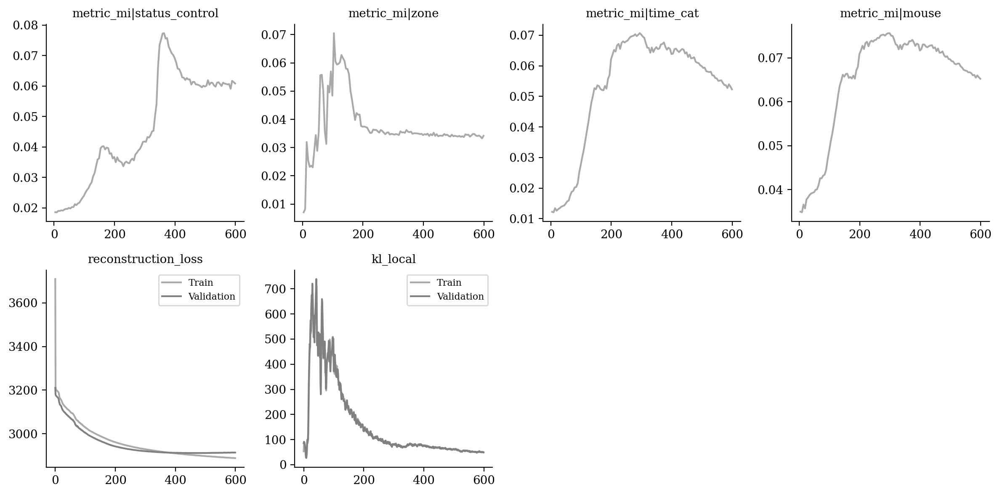

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

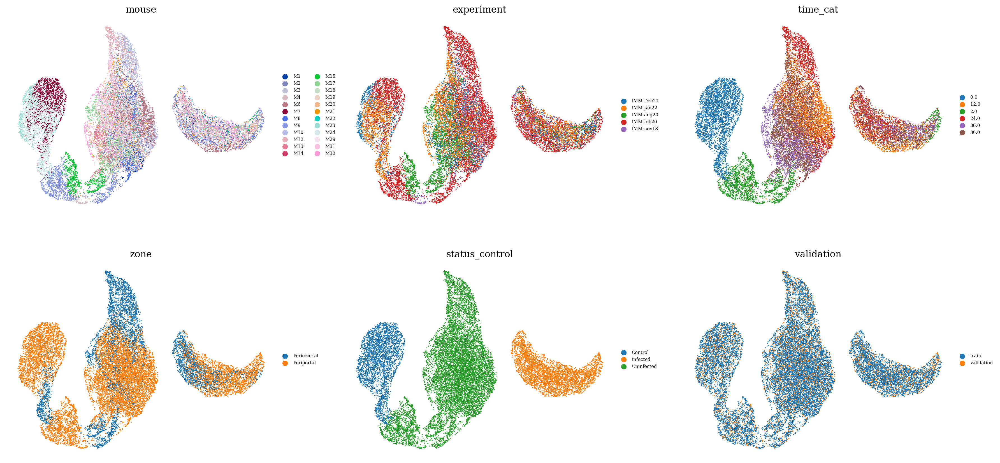

In [13]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

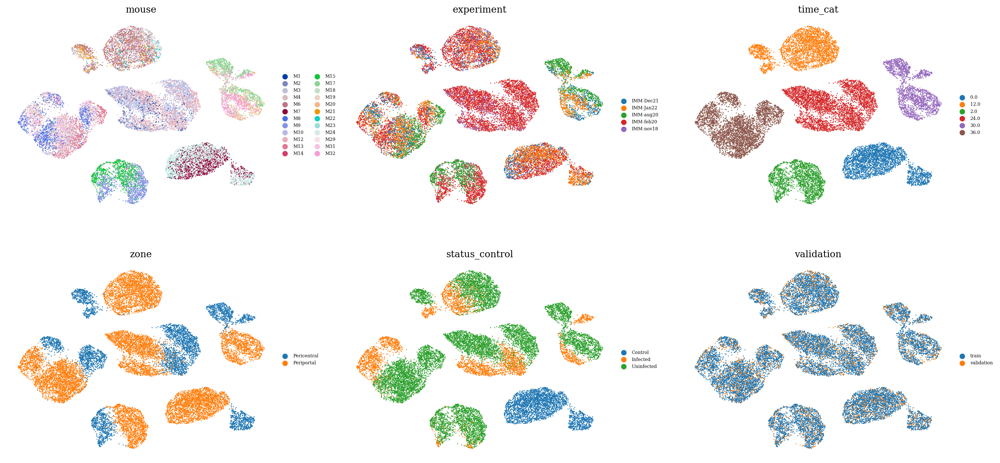

In [14]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

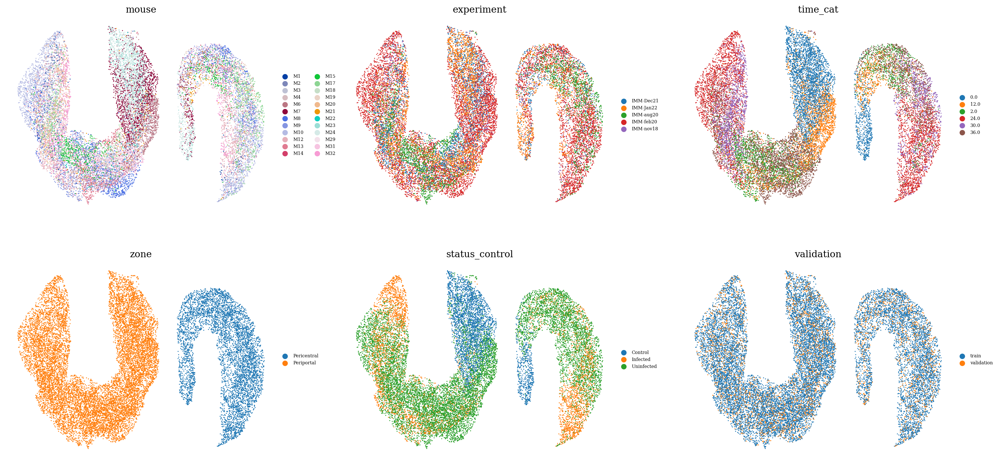

In [15]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

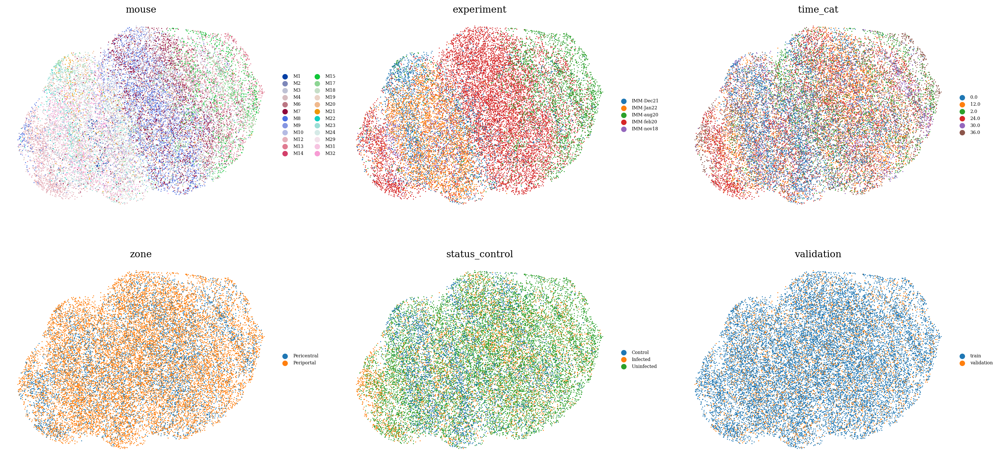

In [16]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )